In [1]:
!pip install "git+https://github.com/ibm-granite-community/utils.git" transformers pillow langchain_community langchain_huggingface langchain_milvus docling replicate


  Cloning https://github.com/ibm-granite-community/utils.git to /tmp/pip-req-build-37v82hiy
  Running command git clone --filter=blob:none --quiet https://github.com/ibm-granite-community/utils.git /tmp/pip-req-build-37v82hiy
  Resolved https://github.com/ibm-granite-community/utils.git to commit ae54b4ff8a21d59918a1080c9e152365502dd8f4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 13.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 79.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.1/196.1 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 17.7 MB/s eta 0:00:00
   ━━━━

In [2]:
from langchain_huggingface import HuggingFaceEmbeddings

from transformers import AutoTokenizer

embeddings_model_path = "ibm-granite/granite-embedding-30m-english"  #from huggingface

embeddings_model = HuggingFaceEmbeddings(model_name=embeddings_model_path,) #Model

embeddings_tokenizer =AutoTokenizer.from_pretrained(embeddings_model_path) #tokenizer for that model

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


modules.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/54.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/683 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/60.6M [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/191 [00:00<?, ?B/s]

**#vision model**

In [ ]:
'''from ibm_granite_community.notebook_utils import get_env_var
from langchain_community.llms import Replicate
from transformers import AutoProcessor   #It’s often used in vision or multi-modal models.

# Define the model path
vision_model_path = "ibm-granite/granite-vision-3.2-2b"

# Initialize the vision model
vision_model = Replicate(
    model=vision_model_path,
    replicate_api_token=get_env_var("REPLICATE_API_TOKEN"),
    model_kwargs={
        "max_tokens": 512,  # Adjust as needed or use a tokenizer to determine this dynamically
        "min_tokens": 100,
    }
)

# Initialize the processor for the vision model (image transformer, tokenizer)
vision_processor = AutoProcessor.from_pretrained(vision_model_path)
'''

'from ibm_granite_community.notebook_utils import get_env_var\nfrom langchain_community.llms import Replicate\nfrom transformers import AutoProcessor   #It’s often used in vision or multi-modal models.\n\n# Define the model path\nvision_model_path = "ibm-granite/granite-vision-3.2-2b"\n\n# Initialize the vision model\nvision_model = Replicate(\n    model=vision_model_path,\n    replicate_api_token=get_env_var("REPLICATE_API_TOKEN"),\n    model_kwargs={\n        "max_tokens": 512,  # Adjust as needed or use a tokenizer to determine this dynamically\n        "min_tokens": 100,\n    }\n)\n\n# Initialize the processor for the vision model (image transformer, tokenizer)\nvision_processor = AutoProcessor.from_pretrained(vision_model_path)\n'

Gemini model


In [ ]:
'''import google.generativeai as genai
from PIL import Image

# Configure Gemini API key
GOOGLE_API_KEY = "...."
genai.configure(api_key=GOOGLE_API_KEY)

# Initialize Gemini 1.5 Flash model (supports vision + text)
vision_model = genai.GenerativeModel(model_name="gemini-1.5-flash")

# Vision inference function (accepts PIL image + question)
class VisionProcessor:
    def __init__(self, model):
        self.model = model

    def apply_chat_template(self, conversation: list, add_generation_prompt: bool = False):
        """
        This method will convert a conversation structure into a format compatible with the vision model API.
        """
        # Optional: You can append a prompt for generating the image description if needed
        if add_generation_prompt:
            conversation.append({
                "role": "system",
                "content": "Describe the content of the image."
            })

        return conversation

# Initialize the VisionProcessor with the Gemini vision model
vision_processor = VisionProcessor(model=vision_model)

'''

Together ai model


In [3]:
!pip install together

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.2/103.2 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.3/45.3 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 10.2 MB/s eta 0:00:00
  Attempting uninstall: click
    Found existing installation: click 8.2.1
    Uninstalling click-8.2.1:
      Successfully uninstalled click-8.2.1
  Attempting uninstall: typer
    Found existing installation: typer 0.16.0
    Uninstalling typer-0.16.0:
      Successfully uninstalled typer-0.16.0


In [ ]:
import together
from PIL import Image

# Configure Together API key
TOGETHER_API_KEY = "......"
together.api_key = TOGETHER_API_KEY

# Initialize Together AI Vision Model
vision_model = "togethercomputer/llama-3.2-11b-vision-instruct"

# Vision inference function
class VisionProcessor:
    def __init__(self, model):
        self.model = model

    def apply_chat_template(self, conversation: list, add_generation_prompt: bool = False):
        """
        This method will convert a conversation structure into a format compatible with the Together AI vision API.
        """
        if add_generation_prompt:
            conversation.append({
                "role": "system",
                "content": "Describe the content of the image."
            })
        return conversation


**#language model**

In [ ]:
'''# Define the model path
model_path = "ibm-granite/granite-3.2-8b-instruct"

# Initialize the model with Replicate
model = Replicate(
    model=model_path,
    replicate_api_token=get_env_var("REPLICATE_API_TOKEN"),
    model_kwargs={
        "max_tokens": 1000,  # Maximum number of tokens in the output
        "min_tokens": 100    # Minimum number of tokens in the output
    }
)

# Load the tokenizer
tokenizer = AutoTokenizer.from_pretrained(model_path)
'''

'# Define the model path\nmodel_path = "ibm-granite/granite-3.2-8b-instruct"\n\n# Initialize the model with Replicate\nmodel = Replicate(\n    model=model_path,\n    replicate_api_token=get_env_var("REPLICATE_API_TOKEN"),\n    model_kwargs={\n        "max_tokens": 1000,  # Maximum number of tokens in the output\n        "min_tokens": 100    # Minimum number of tokens in the output\n    }\n)\n\n# Load the tokenizer\ntokenizer = AutoTokenizer.from_pretrained(model_path)\n'

In [5]:
!pip install langchain_groq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.4/131.4 kB 10.3 MB/s eta 0:00:00


In [ ]:
from langchain_groq import ChatGroq
from transformers import AutoTokenizer

# Set up Groq API Key
GROQ_API_KEY = "......"

# Initialize LLaMA 3.3 70B Versatile on Groq
model = ChatGroq(
    model_name="llama3-70b-8192",  # LLaMA 3.3 70B Versatile
    api_key=GROQ_API_KEY
)




Extracting pdf content

In [9]:
from docling.document_converter import DocumentConverter, PdfFormatOption
from docling.datamodel.base_models import InputFormat
from docling.datamodel.pipeline_options import PdfPipelineOptions

# Step 1: Define PDF processing options
pdf_pipeline_options = PdfPipelineOptions(
    do_ocr=True,  # Set to True if PDF is scanned (image-based)
    generate_picture_images=True  # Whether to extract images from the PDF
)

# Step 2: Link input format to pipeline options
format_options = {
    InputFormat.PDF: PdfFormatOption(pipeline_options=pdf_pipeline_options),  #Tells the converter how to handle PDF files using the PdfPipelineOptions defined above.
}

# Step 3: Initialize the converter with format options
converter = DocumentConverter(format_options=format_options)

# Step 4: List of sources (can be file paths or URLs)
sources = [
    "/content/man1_merged.pdf"
]

# Step 5: Convert PDFs to structured documents
conversions = {
    source: converter.convert(source=source).document for source in sources
}


This code extracts structured information from PDFs using Docling, making it easier to feed resumes, documents, or scanned forms into LLM pipelines, search tools, or analysis systems.



**##here we do chunking of the above structured data  (only text data)**

In [10]:
from docling_core.transforms.chunker.hybrid_chunker import HybridChunker   #intelligently splits documents into smaller chunks using structure and tokenizer.
from docling_core.types.doc.document import TableItem      #used to identify table-only chunks, which you skip.
from langchain_core.documents import Document               #LangChain's standardized object for storing text + metadata.

# Initialize
doc_id = 0                               #numeric identifier to track and index each chunk.
texts: list[Document] = []               #list to hold all resulting LangChain Document chunks.

# Process each converted document
for source, docling_document in conversions.items():          #For each structured document (PDF → Docling → structured format), a HybridChunker is initialized with your previously loaded IBM Granite tokenizer (embeddings_tokenizer) to control chunk sizes.
    chunker = HybridChunker(tokenizer=embeddings_tokenizer)

    for chunk in chunker.chunk(docling_document):          #Skips chunks that only contain a table (probably because these are hard to semantically embed with plain text models).
        items = chunk.meta.doc_items                       #gets structural components like headings, paragraphs, tables, etc.

        # Skip if chunk is just a table
        if len(items) == 1 and isinstance(items[0], TableItem):
            continue

        # Collect references from items
        refs = "".join(item.get_ref().cref for item in items)   #gathers string references (e.g., paragraph IDs, headings) to help trace where the chunk came from.
        print(refs)
        text = chunk.text

        # Store as LangChain document
        document = Document(
            page_content=text,   # the text data
            metadata={
                "doc_id": (doc_id:= doc_id + 1),   #Assigns a unique document ID to each chunk.
                "source": source,                  #Keeps track of where the chunk came from (i.e., the original file path or URL).
                "ref": refs,                       #Stores a reference string created by concatenating all cref (canonical references) from the document items in the chunk.....ex(sec1.para3sec2.para1)
            }
        )

        texts.append(document)

print(f"{len(texts)} text document chunks created")


Token indices sequence length is longer than the specified maximum sequence length for this model (1022 > 512). Running this sequence through the model will result in indexing errors


#/texts/1#/texts/2#/texts/3#/texts/4#/texts/5#/texts/6
#/texts/8#/texts/9#/texts/10#/texts/11#/texts/12#/texts/13#/texts/14
#/tables/0#/texts/18
#/tables/4#/tables/5
#/texts/25
#/texts/28#/texts/29
#/texts/31#/texts/41#/texts/43#/texts/46
#/texts/49#/texts/50#/texts/51#/texts/52#/texts/53#/texts/54
#/texts/55#/texts/56#/texts/57
#/texts/59#/texts/60#/texts/61
#/texts/64#/tables/6
#/texts/74#/texts/75#/texts/76
#/texts/107#/texts/108
#/texts/110#/texts/111#/texts/112#/texts/114#/texts/119#/texts/120
#/texts/128#/texts/129#/texts/130#/texts/131#/texts/132#/texts/133#/texts/134#/texts/135#/texts/219#/texts/220#/texts/221#/texts/222#/texts/223#/texts/224#/texts/225#/tables/7#/texts/228
#/tables/9#/texts/230
#/texts/233#/texts/236#/texts/237#/texts/238#/texts/239#/texts/240#/texts/241#/texts/242#/texts/243#/texts/244#/texts/245#/texts/246#/texts/247#/texts/248#/texts/249#/texts/250#/texts/251
#/texts/252#/texts/253#/texts/254#/texts/255#/texts/256#/texts/257#/texts/262
#/texts/264#/texts/26

**#Chunking only table data**

In [11]:
from docling_core.types.doc.labels import DocItemLabel
from langchain_core.documents import Document

doc_id = len(texts)  # Continue doc_id count from earlier text chunks...text chunk che counting samplya pasun pudhe
tables: list[Document] = []

for source, docling_document in conversions.items():
    for table in docling_document.tables:            #Filters only those that are explicitly labeled as tables (sometimes documents can contain other structures like figures or captions in the same list).
        if table.label == DocItemLabel.TABLE:
            ref = table.get_ref().cref      #ex (sec1.table3)
            print(ref)
            text = table.export_to_markdown()

            document = Document(
                page_content=text,
                metadata={
                    "doc_id": (doc_id:= doc_id + 1),
                    "source": source,
                    "ref": ref,
                }
            )

            tables.append(document)

print(f"{len(tables)} table documents created")


#/tables/6
#/tables/7
#/tables/8
#/tables/9
#/tables/10
#/tables/11
#/tables/12
#/tables/13
#/tables/14
#/tables/15
#/tables/16
#/tables/17
#/tables/18
#/tables/19
#/tables/20
#/tables/21
#/tables/22
#/tables/23
#/tables/24
#/tables/25
#/tables/26
#/tables/27
#/tables/28
#/tables/29
#/tables/30
#/tables/31
#/tables/32
#/tables/33
#/tables/34
#/tables/35
#/tables/36
#/tables/37
#/tables/38
#/tables/39
#/tables/40
#/tables/41
#/tables/42
#/tables/43
#/tables/44
#/tables/45
#/tables/46
#/tables/47
#/tables/48
#/tables/49
#/tables/50
#/tables/51
#/tables/52
#/tables/53
#/tables/54
#/tables/55
#/tables/56
#/tables/57
#/tables/58
#/tables/59
#/tables/60
55 table documents created


In [ ]:
'''import base64  #Convert images to base64-encoded strings
import io
import PIL.Image
import PIL.ImageOps

def encode_image(image: PIL.Image.Image, format: str = "png") -> str:  ##Standardizes and encodes an image as a base64 data URI, suitable for sending to a vision model API.

    # Correct the typo and apply EXIF transposition if necessary
    image = PIL.ImageOps.exif_transpose(image) or image

    # Convert the image to RGB to avoid any issues with transparency
    image = image.convert("RGB")

    # Save the image into a buffer in the specified format
    buffer = io.BytesIO()
    image.save(buffer, format=format)

    # Encode the image buffer in base64 and return as a URI
    encoding = base64.b64encode(buffer.getvalue()).decode("utf-8")
    uri = f"data:image/{format};base64,{encoding}"

    return uri



# Image prompt to explain text in the image
image_prompt = "If the image contains text, explain the text in the image."

# Define a conversation structure with user input
conversation = [
    {
        "role": "user",
        "content": [
            {"type": "image"},
            {"type": "text", "text": image_prompt}
        ]
    },

]



# Assuming vision_processor is already defined and provides the method apply_chat_template
vision_prompt = vision_processor.apply_chat_template(
    conversation=conversation,
    add_generation_prompt=True
)

# Initialize an empty list for pictures and document ID
pictures:list[Document]=[]  # Initialize the pictures list ....continues unique ID count from previous sections (text + table)


doc_id = len(texts) + len(tables)

# Iterate through the document sources and their pictures
for source, docling_document in conversions.items():
    for picture in docling_document.pictures:
        ref = picture.get_ref().cref  # Assuming picture.get_ref().cref is valid
        print(ref)

        # Extract the image from the document
        image = picture.get_image(docling_document)

        if image:
            # Process the image and apply vision model....Image is passed to the vision model using the encoded base64 string.
            text = vision_model.generate_content([image_prompt, encode_image(image)])




            # Create a document with the page content and metadata
            document = Document(
                page_content=text,
                metadata={
                    "doc_id": (doc_id := doc_id + 1),
                    "source": source,
                    "ref":ref, # Add image URI to metadata
                },
            )

            # Append the document to your collection
            pictures.append(document)'''


Images


#with gemini

In [ ]:
'''import base64
import io
from PIL import Image
from langchain_core.documents import Document

# Image processing function
def process_images_from_docling(conversions, vision_model, start_doc_id):
    pictures = []
    doc_id = start_doc_id

    for source, docling_document in conversions.items():
        # Check if document has pictures attribute
        if hasattr(docling_document, 'pictures') and docling_document.pictures:
            print(f"Found {len(docling_document.pictures)} images in {source}")

            for picture in docling_document.pictures:
                try:
                    # Get image reference and actual image
                    ref = picture.get_ref().cref
                    image = picture.get_image(docling_document)

                    if image:
                        # Process with Gemini
                        response = vision_model.generate_content([
                            "Extract all text and describe key visual elements in this image. "
                            "Include any numbers, labels, or important details.",
                            image
                        ])

                        # Create document
                        document = Document(
                            page_content=response.text,
                            metadata={
                                "doc_id": doc_id,
                                "source": source,
                                "ref": ref,
                            }
                        )
                        pictures.append(document)
                        doc_id += 1
                        print(f"Processed image {ref}")
                    else:
                        print(f"Could not extract image from {ref}")
                except Exception as e:
                    print(f"Error processing image: {str(e)}")
        else:
            print(f"No images found in {source}")

    return pictures

# Usage
start_doc_id = len(texts) + len(tables) + 1  # Continue numbering
pictures = process_images_from_docling(conversions, vision_model, start_doc_id)
print(f"\nSuccessfully processed {len(pictures)} images")'''

#with together ai


In [ ]:
import base64
import io
from PIL import Image
from langchain_core.documents import Document
from together import Together

# Init Together AI client
client = Together(api_key="........")

def process_images_from_docling(conversions, start_doc_id):
    pictures = []
    doc_id = start_doc_id

    for source, docling_document in conversions.items():
        if hasattr(docling_document, 'pictures') and docling_document.pictures:
            print(f"Found {len(docling_document.pictures)} images in {source}")

            for picture in docling_document.pictures:
                try:
                    ref = picture.get_ref().cref
                    image = picture.get_image(docling_document)

                    if image:
                        # Convert PIL image to base64
                        img_buffer = io.BytesIO()
                        image.save(img_buffer, format="PNG")
                        img_str = base64.b64encode(img_buffer.getvalue()).decode("utf-8")

                        # Together AI vision request
                        response = client.chat.completions.create(
                            model="meta-llama/Llama-3.2-11B-Vision-Instruct-Turbo",
                            messages=[
                                {
                                    "role": "user",
                                    "content": [
                                        {
                                            "type": "text",
                                            "text": "Extract all text and describe key visual elements in this image. Include any numbers, labels, or important details."
                                        },
                                        {
                                            "type": "image_url",
                                            "image_url": {"url": f"data:image/png;base64,{img_str}"}
                                        }
                                    ]
                                }
                            ]
                        )

                        # ✅ Correct way to access model output
                        output_text = response.choices[0].message.content

                        document = Document(
                            page_content=output_text,
                            metadata={
                                "doc_id": doc_id,
                                "source": source,
                                "ref": ref,
                            }
                        )
                        pictures.append(document)
                        doc_id += 1
                        print(f"Processed image {ref}")
                    else:
                        print(f"Could not extract image from {ref}")
                except Exception as e:
                    print(f"Error processing image: {str(e)}")
        else:
            print(f"No images found in {source}")

    return pictures

# Usage
start_doc_id = len(texts) + len(tables) + 1
pictures = process_images_from_docling(conversions, start_doc_id)
print(f"\nSuccessfully processed {len(pictures)} images")


Found 353 images in /content/man1_merged.pdf
Processed image #/pictures/0
Processed image #/pictures/1
Processed image #/pictures/2
Processed image #/pictures/3
Processed image #/pictures/4
Processed image #/pictures/5
Processed image #/pictures/6
Processed image #/pictures/7
Processed image #/pictures/8
Processed image #/pictures/9
Processed image #/pictures/10
Processed image #/pictures/11
Processed image #/pictures/12
Processed image #/pictures/13
Processed image #/pictures/14
Processed image #/pictures/15
Processed image #/pictures/16
Processed image #/pictures/17
Processed image #/pictures/18
Processed image #/pictures/19
Processed image #/pictures/20
Processed image #/pictures/21
Processed image #/pictures/22
Processed image #/pictures/23
Processed image #/pictures/24
Processed image #/pictures/25
Processed image #/pictures/26
Processed image #/pictures/27
Processed image #/pictures/28
Processed image #/pictures/29
Processed image #/pictures/30
Processed image #/pictures/31
Proce

#Using moondream model

In [ ]:
#!pip install moondream

In [ ]:
'''import io
from PIL import Image
from langchain_core.documents import Document
import moondream as md

# ----------------------------
# Init Moondream model
# ----------------------------
# For local inference:
# vision_model = md.vl(endpoint="http://localhost:2020/v1")

# For Moondream Cloud:
vision_model = md.vl(api_key="......")  # Replace with your key or env var

def process_images_from_docling(conversions, start_doc_id):
    pictures = []
    doc_id = start_doc_id

    for source, docling_document in conversions.items():
        if hasattr(docling_document, 'pictures') and docling_document.pictures:
            print(f"Found {len(docling_document.pictures)} images in {source}")

            for picture in docling_document.pictures:
                try:
                    ref = picture.get_ref().cref
                    image = picture.get_image(docling_document)  # PIL Image

                    if image:
                        # Ask Moondream to caption / describe image
                        response = vision_model.caption(image)
                        output_text = response.get("caption", "")

                        if not output_text:
                            output_text = "[No caption returned]"

                        # Create LangChain Document
                        document = Document(
                            page_content=output_text,
                            metadata={
                                "doc_id": doc_id,
                                "source": source,
                                "ref": ref,
                            }
                        )
                        pictures.append(document)
                        doc_id += 1
                        print(f"Processed image {ref}")
                    else:
                        print(f"Could not extract image from {ref}")

                except Exception as e:
                    print(f"Error processing image: {str(e)}")
        else:
            print(f"No images found in {source}")

    return pictures

# ----------------------------
# Usage
# ----------------------------
start_doc_id = len(texts) + len(tables) + 1
pictures = process_images_from_docling(conversions, start_doc_id)
print(f"\nSuccessfully processed {len(pictures)} images")
'''

Document ID: 1
Source: /content/man1_merged.pdf
Content:
Manual No.:
H273MA0040E
NC:
MAZA  TROL SmoothG
Serial No.:
Before  using  this  machine  and  equipment,  fully  understand  the  contents  of this manual  to  ensure  proper  operation.  Should  any  questions  arise,  please  ask  the nearest Technical Center or Technology Center.
Document ID: 2
Source: /content/man1_merged.pdf
Content:
1. Be sure to observe the safety precautions described in this manual and the contents of the safety plates on  the machine and equipment.  Failure may cause serious personal  injury or material damage. Please replace any missing safety plates as soon as possible.
2. No modifications are to be performed that will affect operation safety.
3. For the purpose of explaining the operation of the machine and equipment, some il_lustrations may not include safety features such as covers, doors, etc.  Before operation, make sure all such items are in place.
4. This manual was considered complete and accu

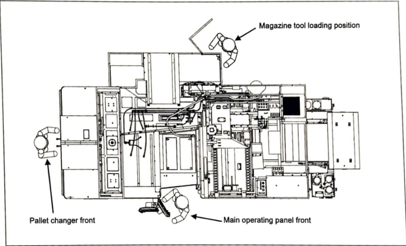

Document ID: 324
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the word "INTRODUCTION" and the number "1" in it. 

* The text box is a small, white rectangle with a thin black border.
	+ The text box is positioned on the right side of the image.
	+ The text box is slightly larger than the text inside it.
* The word "INTRODUCTION" is written in large, dark gray letters inside the text box.
	+ The font is sans-serif and bold.
	+ The text is centered within the text box.
* The number "1" is written in a smaller, dark gray font next to the word "INTRODUCTION".
	+ The number is also centered next to the text.
	+ The number is enclosed in a small, white rectangle with a thin black border, similar to the larger text box.

Overall, the image appears to be a simple label or title for an introduction section.
Image:


Document ID: 325
Source: /content/man1_merged.pdf
Content:
The image presents a simple diagram with text, featuring a line graph and descriptive labels.

*   The line graph is depicted in black on a white background.
    *   The graph consists of a single line that starts at the top-left corner of the image, labeled "2 - 15" in the upper-left corner.
    *   The line extends horizontally to the right, then turns downward and continues to the bottom-right corner of the image.
    *   The line does not intersect with any other lines or shapes within the image.
*   Below the line graph, two lines of text are displayed.
    *   The first line reads "Page number in chapter" and is accompanied by an arrow pointing to the left, indicating the direction of the line graph.
    *   The second line reads "Chapter number" and is also accompanied by an arrow pointing to the left, indicating the direction of the line graph.
*   The background of the image is plain white, providing a clean and neutra

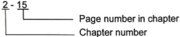

Document ID: 326
Source: /content/man1_merged.pdf
Content:
The image presents a concise and organized diagram illustrating the structure of a technical document, specifically focusing on the organization of figures within the document. The diagram is divided into three main sections: "Chapter number," "Number of figure in chapter," and "Title." Each section provides clear instructions on how to format the corresponding information.

*   **Chapter number**
    *   Located at the top-left corner of the diagram
    *   Indicates the chapter number, which is typically a numerical value
    *   No specific formatting instructions are provided for this section
*   **Number of figure in chapter**
    *   Positioned directly below the chapter number
    *   Specifies the number of figures included in the current chapter
    *   Indicates that the number should be followed by the word "figure" in lowercase
    *   No specific formatting instructions are provided for this section
*   **Title**
 

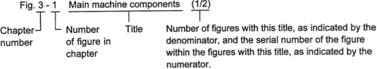

Document ID: 327
Source: /content/man1_merged.pdf
Content:
The image presents a table with four columns, each containing text. The columns are labeled as follows:

*   **Table 2 - 1**: This column is situated on the left side of the image and contains the text "Table 2 - 1".
*   **Chapter number**: This column is located to the right of the first column and contains the text "Chapter number".
*   **Number of table in chapter**: This column is positioned to the right of the second column and contains the text "Number of table in chapter".
*   **Safety nameplate details**: This column is situated at the top of the image and contains the text "Safety nameplate details".

The background of the image is white, providing a clean and neutral backdrop for the text. Overall, the image appears to be a simple table used for organizing and displaying information related to safety nameplates.
Image:


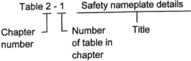

Document ID: 328
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the word "INTRODUCTION" and a number "1" inside it.

*   The text box is rectangular, with a thin black outline. 
    *   It has a white background.
    *   The text "INTRODUCTION" is written in black letters inside the box.
    *   The number "1" is also written in black letters inside the box, but it is positioned to the right of the word "INTRODUCTION".
    *   There are no other objects or elements in the image.
Image:


Document ID: 329
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet clear, safety precaution label. The label is divided into two sections: "SAFETY PRECAUTIONS" and a numeral "2", both enclosed within a square outline.

*   **SAFETY PRECAUTIONS**
    *   The text "SAFETY PRECAUTIONS" is displayed in a plain, black font.
    *   It is positioned at the top-left corner of the image.
*   **Numerical Label**
    *   The numeral "2" is presented in a bold, black font.
    *   It is situated at the top-right corner of the image, within a square outline.

In summary, the image effectively communicates a safety precaution label with a clear and concise design. The use of a simple font and a prominent numeral ensures that the message is easily readable and understood.
Image:


Document ID: 330
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "DANGER" below it. The sign is likely used to alert individuals of potential hazards or risks in their surroundings.

*   **Warning Sign:**
    *   Shape: Triangle
    *   Color: Black outline with a white interior
    *   Symbol: Exclamation mark inside the triangle
*   **Text:**
    *   Word: "DANGER"
    *   Font: Black capital letters
    *   Position: Below the warning sign

In summary, the image displays a warning sign with a triangle containing an exclamation mark, accompanied by the word "DANGER" in black capital letters below it. This sign is typically used to indicate potential dangers or risks in a particular area.
Image:


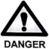

Document ID: 331
Source: /content/man1_merged.pdf
Content:
The image is a warning sign with a triangle and an exclamation mark, accompanied by the word "WARNING" in black text. The purpose of the image is to convey a sense of caution or alertness.

Here are the key features of the image:

* **Triangle:**
	+ Shape: Equilateral triangle
	+ Color: Black outline
	+ Fill: White interior
* **Exclamation Mark:**
	+ Location: Inside the triangle
	+ Color: Black
	+ Shape: Exclamation mark symbol (e.g. !)
* **Word "WARNING":**
	+ Font: Black, sans-serif font
	+ Size: Larger than the triangle
	+ Position: Below the triangle

Overall, the image effectively conveys a warning or alert message through its simple yet striking design. The use of a triangle and exclamation mark creates a sense of urgency, while the word "WARNING" clearly communicates the intended meaning.
Image:


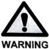

Document ID: 332
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign with the word "CAUTION" and a triangle containing an exclamation point. The purpose of this image is to convey a sense of caution or warning to the viewer.

* A triangle:
	+ The triangle is equilateral, with equal sides and angles.
	+ It is outlined in black, with a white interior.
	+ The triangle is centered in the image, taking up most of the space.
* An exclamation point:
	+ The exclamation point is located inside the triangle, in the center.
	+ It is also black, matching the color of the triangle's outline.
	+ The exclamation point is larger than the triangle, making it more prominent.
* The word "CAUTION":
	+ The word "CAUTION" is written in black text below the triangle.
	+ It is in all capital letters, emphasizing the importance of the warning.
	+ The text is centered, aligning with the center of the triangle.

Overall, the image effectively conveys a sense of caution or warning through 

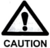

Document ID: 333
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet distinctive design featuring a large number "2" within a rectangular frame. The purpose of this image appears to be decorative or illustrative, possibly used in educational materials, presentations, or as a standalone graphic.

* A large number "2" is displayed:
	+ The number "2" is prominently centered in the image.
	+ It is rendered in a bold, dark gray font that stands out against the light gray background.
	+ The size and placement of the number draw attention to it.
* The number is enclosed in a rectangular frame:
	+ The frame is a thin, light gray outline that surrounds the number "2".
	+ It provides a subtle border around the number, defining its space within the image.
	+ The frame is not overly ornate, maintaining a clean and minimalist aesthetic.
* The background of the image is light gray:
	+ The light gray background serves as a neutral canvas for the number and frame.
	+ It helps th

Document ID: 334
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of two machines, accompanied by a comprehensive list of safety warnings and cautions. The diagram is set against a white background, with black text and lines used to illustrate the machines and their various components.

**Machine Diagrams:**

* Two machines are depicted in the center of the image, each consisting of several interconnected boxes and lines.
* The machines appear to be of similar design, but with distinct differences in their layout and components.

**Safety Warnings and Cautions:**

* A total of 15 safety warnings and cautions are highlighted throughout the diagram, each consisting of a triangle symbol and a brief description of the potential danger or hazard.
* The warnings and cautions are scattered throughout the diagram, with some located near specific components or areas of the machines.

**Locations and Numbers:**

* Each warning or caution is assigned a unique locat

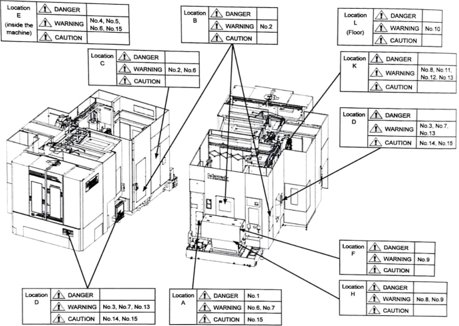

Document ID: 335
Source: /content/man1_merged.pdf
Content:
The image is a grayscale rectangle with a dark gray border and a white interior. Inside the rectangle, there is a large, blurry, black "N" symbol. The "N" is slightly tilted to the right and has a thick, bold line style.

*   The rectangle is a solid gray color with a thin white border.
*   The "N" symbol is centered inside the rectangle.
*   The "N" is a thick, bold line style with a slight tilt to the right.
*   The image is blurry, making it difficult to discern any fine details.

Overall, the image appears to be a simple graphic design element, possibly used as a logo or icon.
Image:


Document ID: 336
Source: /content/man1_merged.pdf
Content:
The image depicts a logo with a black "N" and "J" intertwined to form a loop, set against a white background. The logo is presented within a rectangular box, which is outlined in a thin black line.

*   **Logo:**
    *   The logo features the letters "N" and "J" intertwined to form a loop.
    *   The letters are black in color.
    *   The logo is centered within the rectangular box.
*   **Rectangular Box:**
    *   The rectangular box is outlined in a thin black line.
    *   The box has a white background.
    *   The logo is placed within the box.
*   **Background:**
    *   The background of the image is white.
    *   The white background provides a clean and neutral backdrop for the logo.

In summary, the image showcases a simple yet distinctive logo featuring intertwined "N" and "J" letters, set against a white background within a rectangular box outlined in black.
Image:


Document ID: 337
Source: /content/man1_merged.pdf
Content:
The image depicts a warning sign, featuring a black triangle with a white interior and an exclamation mark in the center. The triangle's points are directed upwards and to the right, while the exclamation mark is positioned at its base.

**Key Features:**

* **Triangle:** Black with a white interior
* **Exclamation Mark:** Centered within the triangle
* **Points:** Directed upwards and to the right
* **Background:** White

**Purpose:**
The warning sign is likely used to alert individuals of potential hazards or risks, and is commonly used in various contexts such as construction sites, road signs, and safety notices.
Image:


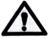

Document ID: 338
Source: /content/man1_merged.pdf
Content:
The image displays a warning sign with the word "WARNING" underneath it. 

* The triangle is a warning sign, which is typically used to indicate danger or caution.
	+ It has a black outline and a white interior.
	+ Inside the triangle, there is a black exclamation mark.
	+ The triangle points downward.
* The word "WARNING" is written in black text below the triangle.
	+ It is centered and takes up two lines.

The image effectively conveys a sense of caution and alertness, suggesting that the viewer should be aware of potential danger or risk.
Image:


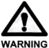

Document ID: 339
Source: /content/man1_merged.pdf
Content:
The image presents a cautionary symbol accompanied by the word "CAUTION" in bold, black text. The symbol features a triangle with an exclamation mark at its center, serving as a warning indicator.

*   A triangle with an exclamation mark
    *   The triangle is formed by three connected lines, with the exclamation mark situated at its center.
    *   The exclamation mark is depicted in black and is positioned within the triangle.
    *   The triangle is outlined in black and has a solid fill, indicating that it is a cautionary symbol.
*   The word "CAUTION"
    *   The word "CAUTION" is written in bold, black text below the triangle.
    *   The text is centered and aligned with the triangle.
    *   The font used for the text is sans-serif and easy to read.

In summary, the image effectively conveys a sense of caution through the use of a triangle with an exclamation mark, which is a universally recognized warning symbol. The 

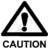

Document ID: 340
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black and white warning sign featuring a stylized triangle with a horizontal line at its base. The triangle's apex points upward, while the horizontal line serves as a base. Inside the triangle, a vertical line is positioned, and within this line, a smaller, inverted triangle is situated. The background of the image is transparent, allowing the sign to take center stage.

*   **Triangle:**
    *   The triangle is the central element of the image.
    *   It is depicted in a simple, black-and-white design.
    *   The triangle has a horizontal line at its base, which serves as a foundation for the rest of the sign.
*   **Vertical Line:**
    *   A vertical line is positioned within the triangle.
    *   This line is also rendered in black and white.
    *   The vertical line forms the core of the sign's design.
*   **Inverted Triangle:**
    *   Inside the vertical line, a smaller, inverted triangle 

Document ID: 341
Source: /content/man1_merged.pdf
Content:
The image is a simple, black-and-white graphic featuring the number 2 in a large, bold font.

* The number 2 is centered in the image and takes up most of the space.
	+ It is written in a large, bold font with a thick stroke.
	+ The number is oriented vertically, with the top of the 2 pointing upwards and the bottom pointing downwards.
* The background of the image is white, providing a clean and neutral contrast to the black number.
	+ There are no other visual elements or details in the image, apart from the number 2.

Overall, the image is a straightforward and minimalist representation of the number 2, with a clear and easy-to-read design.
Image:


Document ID: 342
Source: /content/man1_merged.pdf
Content:
The image presents a simple, square-shaped sign featuring the number 2 in a bold, black font. The sign is outlined by a thin black border, with a subtle shadow effect that adds depth to the design.

*   **Number 2:**
    *   The number 2 is prominently displayed in the center of the sign.
    *   It is rendered in a bold, black font, making it easily readable.
*   **Square Sign:**
    *   The sign itself is a square shape, providing a clean and straightforward backdrop for the number 2.
    *   The square shape helps to focus attention on the number, creating a sense of simplicity and clarity.
*   **Black Border:**
    *   A thin black border surrounds the sign, defining its edges and adding a touch of sophistication.
    *   The border helps to separate the sign from its surroundings, making it stand out more effectively.
*   **Shadow Effect:**
    *   A subtle shadow effect is applied to the sign, giving it a sense of depth a

Document ID: 343
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "WARNING" below it. The purpose of this image is to convey a sense of caution or alertness.

* Triangle:
	+ The triangle is equilateral and has a thick black outline.
	+ It is positioned at the top center of the image.
	+ The triangle is symmetrical, with all three sides being equal in length.
* Exclamation mark:
	+ The exclamation mark is located inside the triangle, near the center.
	+ It is also black and has a bold font.
	+ The exclamation mark is a standard punctuation mark used to indicate emphasis or alarm.
* Word "WARNING":
	+ The word "WARNING" is written in all capital letters.
	+ It is positioned below the triangle, centered horizontally.
	+ The text is in a simple, sans-serif font.
	+ The color of the text is the same as the triangle and exclamation mark, which is black.

Overall, the image effectively conveys a sens

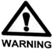

Document ID: 344
Source: /content/man1_merged.pdf
Content:
The image displays a warning sign with the word "CAUTION" below it, set against a white background.

*   The warning sign is a black triangle with an exclamation mark inside.
    *   The triangle is equilateral and has a flat base.
    *   The exclamation mark is centered within the triangle.
*   Below the warning sign is the word "CAUTION".
    *   The word "CAUTION" is written in all capital letters.
    *   It is positioned directly below the warning sign, aligned with its center.

The image effectively conveys a sense of warning or alertness, making it clear that attention should be paid to the message that follows. The use of a bold font and a prominent placement of the word "CAUTION" ensures that the viewer's attention is drawn to the warning.
Image:


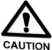

Document ID: 345
Source: /content/man1_merged.pdf
Content:
The image depicts a warning sign with the word "WARNING" in large letters at the bottom, accompanied by a triangle-shaped icon above it. The triangle is outlined in black and features a black exclamation mark in its center.

*   **Triangle Icon:**
    *   Shape: Triangle
    *   Color: Black
    *   Exclamation Mark: Present in the center
*   **Text:**
    *   Word: WARNING
    *   Font: Large
    *   Color: Black
    *   Position: Bottom of the image

The image effectively conveys a sense of caution or alertness, likely used to warn individuals of potential hazards or dangers.
Image:


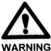

Document ID: 346
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a number inside, set against a white background. The purpose of this image is unclear, but it may be used as a placeholder or a visual element in a larger context.

Here are the key features of the image:

* A number is shown in the image:
	+ The number is two.
	+ It is written in black font.
	+ It is positioned in the center of the box.
* The number is inside a box:
	+ The box has a thin gray border.
	+ The box is rectangular in shape.
	+ The box is centered in the image.
* The background is white:
	+ The background is plain and unadorned.
	+ There are no other visual elements or patterns on the background.

In summary, the image is a simple representation of the number 2 inside a rectangular box, set against a white background. The image does not provide any additional context or information, leaving its purpose and meaning unclear.
Image:


Document ID: 347
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "CAUTION" below it. The purpose of this image is to convey a sense of caution or warning to the viewer.

* A triangle with an exclamation mark inside:
	+ The triangle is equilateral, with equal sides and angles.
	+ The exclamation mark is centered within the triangle.
	+ The triangle and exclamation mark are depicted in black, with a white background.
* The word "CAUTION" in black text:
	+ The text is written in lowercase letters.
	+ The font is simple and easy to read.
	+ The text is positioned directly below the triangle.

Overall, the image effectively conveys a sense of caution or warning to the viewer, making it a clear and concise visual representation of a safety message.
Image:


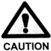

Document ID: 348
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, characterized by a black triangle with a white interior and a black exclamation mark inside. Below the triangle, the word "WARNING" is written in bold black letters.

*   **Triangle:**
    *   Shape: Equilateral triangle
    *   Color: Black
    *   Interior: White
    *   Exclamation mark: Black, centered within the triangle
*   **Text:**
    *   Word: "WARNING"
    *   Font: Bold
    *   Color: Black
    *   Position: Below the triangle

The warning sign is set against a plain white background, which helps to draw attention to the message being conveyed. The use of a bold, black font for the word "WARNING" emphasizes the importance of the message, while the white background provides a clean and neutral contrast that makes the sign easy to read. Overall, the design of the warning sign effectively communicates a sense of caution and alertness, making it an effective tool for conveying importan

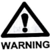

Document ID: 349
Source: /content/man1_merged.pdf
Content:
The image displays a gray square with a large number 2 in the center, set against a white background.

* A large number 2:
	+ The number is centered within the gray square.
	+ It is written in a bold, black font.
	+ The number is slightly darker than the gray square it is contained within.
* A gray square:
	+ The square has a thick gray border.
	+ The border is slightly lighter than the gray color of the interior of the square.
	+ The square is positioned on the left side of the image, taking up most of the space.
* A white background:
	+ The background is a solid white color.
	+ It provides a clean and neutral contrast to the gray square and the black number 2.

The overall design of the image suggests that it may be a simple graphic element used in a digital context, such as a website or application.
Image:


Document ID: 350
Source: /content/man1_merged.pdf
Content:
The image depicts a warning sign, featuring a triangle with an exclamation mark inside. The triangle is outlined in black and has a white interior, with the exclamation mark positioned at its center. The background of the image is plain white.

*   **Triangle:**
    *   The triangle is the central element of the image.
    *   It is outlined in black and has a white interior.
    *   The triangle is equilateral, with all sides being equal in length.
*   **Exclamation Mark:**
    *   The exclamation mark is positioned at the center of the triangle.
    *   It is also black in color.
    *   The exclamation mark is symmetrical, with equal distances between its apex and base.
*   **Background:**
    *   The background of the image is plain white.
    *   There are no other objects or features visible in the background.

In summary, the image shows a warning sign consisting of a black-triangle with a white interior and a black excl

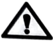

Document ID: 351
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign with a bold, black triangle and an exclamation mark, accompanied by the word "DANGER" in smaller text below. The overall design is simple yet striking, effectively conveying a sense of caution or alertness.

Here are the key features of the image:

* **Triangle:**
	+ Shape: Equilateral triangle with pointed tip
	+ Color: Black
	+ Size: Large, taking up most of the image
* **Exclamation Mark:**
	+ Location: Center of the triangle
	+ Color: Black
	+ Size: Slightly smaller than the triangle
* **Text:**
	+ Word: "DANGER"
	+ Font: Simple, sans-serif font
	+ Color: Black
	+ Size: Smaller than the triangle and exclamation mark
* **Background:**
	+ Color: White

In summary, the image is a clear and concise warning sign that grabs attention with its bold design and prominent placement of the word "DANGER". The use of a black triangle and exclamation mark creates a sense of urgency, while the white backg

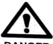

Document ID: 352
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, characterized by a triangle with an exclamation mark inside and the word "WARNING" written below it. The purpose of this image is to convey a sense of caution or alertness.

* A triangle:
	+ The triangle is equilateral and has a black outline.
	+ It is positioned at the top of the image.
	+ The triangle contains an exclamation mark inside.
* An exclamation mark:
	+ The exclamation mark is black and positioned in the center of the triangle.
	+ It is a standard exclamation mark symbol.
* The word "WARNING":
	+ The word "WARNING" is written in all capital letters.
	+ It is positioned below the triangle.
	+ The text is also black.

The image effectively conveys a warning or alert message, likely indicating potential danger or risk. The use of a triangle and exclamation mark creates a clear visual representation of caution, while the word "WARNING" reinforces the message.
Image:


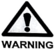

Document ID: 353
Source: /content/man1_merged.pdf
Content:
The image is a caution sign, which is a type of warning sign used to alert people of potential hazards or dangers. The sign features a triangle with an exclamation mark inside it, accompanied by the word "CAUTION" written below it.

Here are the key elements of the image:

* **Triangle**: The triangle is the central element of the sign. It is a equilateral triangle with a black outline and a white interior.
	+ Shape: Equilateral triangle
	+ Color: Black outline, white interior
* **Exclamation Mark**: Inside the triangle is a large exclamation mark. This symbol indicates that attention should be paid to the warning or hazard.
	+ Shape: Exclamation mark
	+ Color: Black
* **Word "CAUTION"**: Below the triangle is the word "CAUTION" written in all capital letters.
	+ Font: All capital letters
	+ Color: Black

Overall, the image effectively conveys a sense of warning or caution, indicating that attention should be paid to the potent

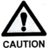

Document ID: 354
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a bold black number 2 inside. The purpose of this image is likely to serve as a placeholder or a visual cue in a digital context.

* A large number 2:
	+ The number 2 is displayed prominently in the center of the image.
	+ It is rendered in a bold, black font.
	+ The number is contained within a rectangular box.
* A rectangular box:
	+ The box is outlined in black and has a thin border.
	+ It is positioned around the number 2, framing it completely.
	+ The box provides a clear visual distinction between the number and the surrounding background.
* A thin black border:
	+ The border is a thin, solid line that surrounds the entire image.
	+ It adds a subtle touch of contrast to the overall design.
	+ The border helps to define the edges of the image and create a sense of depth.

In summary, the image consists of a bold, black number 2 enclosed within a rectangular box, which is su

Document ID: 355
Source: /content/man1_merged.pdf
Content:
The image displays a warning sign with the word "WARNING" written below it. The sign is triangular, with a black border and a white interior. Inside the triangle is a black exclamation mark.

*   The triangle is outlined in black and has a white interior.
    *   It is positioned at the top of the image.
    *   The triangle is equilateral, with all sides being equal in length.
*   Inside the triangle is a black exclamation mark.
    *   The exclamation mark is centered within the triangle.
    *   It is a simple, bold design, consisting of a vertical line with an inverted triangle at the top.
*   Below the triangle is the word "WARNING".
    *   The word is written in all capital letters.
    *   It is centered and takes up most of the width of the image.

The image effectively conveys a sense of caution or alertness through its use of a warning sign and bold, attention-grabbing typography.
Image:


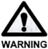

Document ID: 356
Source: /content/man1_merged.pdf
Content:
The image depicts a simple, grayscale numeral 2 within a square box. The numeral is positioned centrally and occupies most of the space within the box, with its top-left and bottom-right corners slightly rounded. The box itself features a thin, light gray border that is thicker at the corners, creating a subtle shadow effect around the numerals. The background of the image is a clean white.

**Key Features:**

* **Numeral 2:** A simple, grayscale representation of the numeral 2, positioned centrally within the box.
* **Square Box:** A thin, light gray border surrounds the numeral, with thicker lines at the corners to create a subtle shadow effect.
* **Background:** A clean white background provides a neutral contrast to the numeral and box.

**Overall Impression:**

The image presents a straightforward and minimalist design, with the numeral 2 taking center stage within the square box. The use of grayscale tones and a clean whi

Document ID: 357
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, characterized by a black triangle with an exclamation mark inside and the word "WARNING" written below it. The purpose of this image is to convey a sense of caution or alertness.

* A black triangle with an exclamation mark inside:
	+ The triangle is centered in the image.
	+ It has a pointed top and flat bottom.
	+ The exclamation mark is positioned within the triangle, slightly off-center towards the bottom.
* The word "WARNING" written below the triangle:
	+ The text is in all capital letters.
	+ It is aligned to the right of the triangle.
	+ The font is simple and easy to read.

The main finding from this image is that it serves as a clear warning sign, indicating potential danger or risk. There are no significant changes or comparisons to note within this single image.
Image:


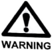

Document ID: 358
Source: /content/man1_merged.pdf
Content:
The image features a warning sign with the word "CAUTION" written below it.

*   The warning sign is triangular in shape, with a black border and a white interior.
    *   The sign has an exclamation mark in the center, which is also black.
    *   The sign is positioned above the word "CAUTION", which is written in all capital letters.
    *   The word "CAUTION" is also black and appears to be in a sans-serif font.

The background of the image is plain white, providing a clean and simple backdrop for the warning sign and text. Overall, the image effectively conveys a sense of caution and alertness, making it suitable for use in a variety of contexts where attention is needed.
Image:


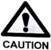

Document ID: 359
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black and white warning sign, featuring a triangle with an exclamation mark inside. The sign is set against a plain white background, which serves to emphasize its importance.

* The triangle is the central element of the sign, with its apex pointing upwards.
	+ The triangle is outlined in black, creating a clear and defined shape.
	+ The triangle's interior is white, providing a clean and neutral contrast to the black outline.
* Inside the triangle, an exclamation mark is prominently displayed.
	+ The exclamation mark is also black, matching the color of the triangle's outline.
	+ The exclamation mark is centered within the triangle, drawing attention to its significance.
* The background of the image is a solid white, which helps to focus attention on the warning sign.
	+ The white background provides a clean and neutral backdrop for the sign.
	+ The simplicity of the background allows the viewer 

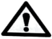

Document ID: 360
Source: /content/man1_merged.pdf
Content:
The image displays a warning symbol and the word "WARNING" in black text on a white background. 

* The warning symbol is a triangle with an exclamation mark inside it.
	+ The triangle is outlined in black, with a white interior.
	+ The exclamation mark is centered within the triangle.
* Below the triangle, the word "WARNING" is written in large black letters.
	+ The font is bold and sans-serif.
	+ The text is centered below the triangle.

Overall, the image effectively conveys a sense of caution or alertness, suggesting that the viewer should be aware of potential dangers or risks.
Image:


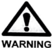

Document ID: 361
Source: /content/man1_merged.pdf
Content:
The image presents a simple and straightforward design, featuring the words "SAFETY PRECAUTIONS" in black text on a white background. The text is centered at the top of the image, with the word "SAFETY" followed by "PRECAUTIONS" in a slightly smaller font size.

In the upper right-hand corner, a small square outline contains the number "2", which is also in black text. This number appears to be a reference or identifier for the safety precautions being presented.

The overall design of the image is clean and easy to read, with a clear hierarchy of information. The use of a simple font and a white background helps to focus the viewer's attention on the text, making it easy to quickly scan and understand the information being presented.

There are no significant changes or comparisons to note in this image, as it appears to be a standalone graphic intended to convey a specific message or instruction.
Image:


Document ID: 362
Source: /content/man1_merged.pdf
Content:
The image presents a safety sign and a section of text, both in black and white. The sign is situated on the left side of the image, while the text is located on the right side.

*   **Safety Nameplates**
    *   The sign features a rectangular shape with a rounded corner at the bottom-right side.
    *   It has a white background with black text and graphics.
    *   At the top, it displays "(a)" in parentheses, followed by "Safety Nameplates" in bold font.
    *   Below this, there is a warning triangle containing a lightning bolt graphic, accompanied by the word "DANGER" in bold font.
    *   The phrase "HAZARDOUS VOLTAGE" is written below the triangle, with a line underneath it stating "Turn OFF power before servicing."
    *   In the bottom-right corner of the sign, the number "GX108401011" is displayed.
*   **Remark**
    *   The text on the right side of the image is titled "Remark" and features a boxed border around it.

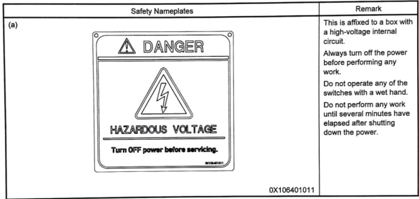

Document ID: 363
Source: /content/man1_merged.pdf
Content:
The image presents a safety nameplate for a machine, featuring a warning message and several safety instructions. The nameplate is divided into two sections: the left side contains the warning message, while the right side provides additional safety instructions.

* **Warning Message:**
	+ Located on the left side of the nameplate
	+ Emphasizes the importance of following the operator's manual and warns against ignoring the manual or the machine's safety devices
	+ Includes a list of three numbered points that outline the consequences of ignoring the manual or safety devices
* **Additional Safety Instructions:**
	+ Located on the right side of the nameplate
	+ Provides specific safety guidelines for the machine, including:
		- Avoiding work places and cutting tools seconds before starting the machine
		- Keeping safety glasses, safety shoes, heat protection, and hearing protection on when operating the machine
		- Never placing

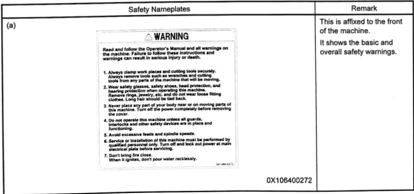

Document ID: 364
Source: /content/man1_merged.pdf
Content:
The image presents a technical document, likely from a manufacturer's instruction manual, featuring safety nameplates and warnings for a machine or tool. The document is divided into two sections: the top section contains a warning label, while the bottom section includes another warning label accompanied by additional text.

*   **Warning Label (Top Section)**
    *   **Title:** "WARNING"
    *   **Content:** "Use the tool within the tool's tolerable speed. Respecting the usage can cause severe injury."
    *   **Code:** "0X106401580"
*   **Additional Text (Top Section)**
    *   **Remark:** "Check that the spindle speed is not higher than the maximum permissible speed of the tool to be used."
*   **Warning Label (Bottom Section)**
    *   **Title:** "WARNING"
    *   **Content:** "CRUSH HAZARD"
    *   **Subheading:** "Do NOT operate with guards removed. Turn OFF power before servicing."
    *   **Code:** "0X106401430"
*   **

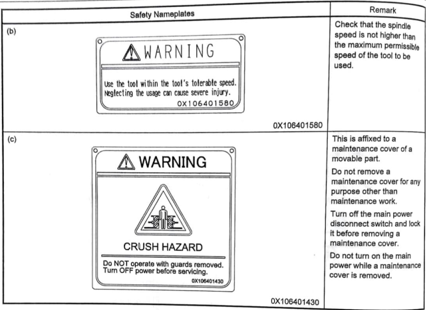

Document ID: 365
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the words "SAFETY PRECAUTIONS" and the number "2" in it. The text is likely part of a larger document or presentation that provides safety guidelines or protocols.

*   **Text**
    *   The text is written in a plain, sans-serif font.
    *   It is centered within the text box.
    *   The text reads "SAFETY PRECAUTIONS".
*   **Number**
    *   The number "2" is displayed in a larger font size than the text.
    *   It is positioned to the right of the text.
    *   It is enclosed in a small square box with a thin border.
*   **Background**
    *   The background of the image is white.
    *   There are no other design elements or graphics present in the image.

Overall, the image appears to be a straightforward and concise indication of a specific safety precaution or protocol.
Image:


Document ID: 366
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a black triangle with an exclamation mark inside and the word "WARNING" below it. The sign is set against a white background, creating a clear and attention-grabbing visual.

*   **Warning Sign:**
    *   The warning sign is a black triangle with an exclamation mark inside.
    *   The triangle is outlined in black, with a white interior that features a black exclamation mark.
    *   The exclamation mark is centered within the triangle, drawing attention to the warning.
*   **Background:**
    *   The background of the image is white, providing a clean and neutral contrast to the black warning sign.
    *   The white background helps to make the warning sign stand out, ensuring it grabs the viewer's attention.
*   **Text:**
    *   Below the warning sign, the word "WARNING" is written in black text.
    *   The text is in all capital letters, emphasizing the importance of the warnin

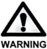

Document ID: 367
Source: /content/man1_merged.pdf
Content:
The image presents a vertical gray bar with a white border, set against a plain white background. The bar is positioned centrally in the frame, with no other objects or elements visible.

*   **Bar:**
    *   Color: Gray
    *   Border: White
    *   Position: Centered in the frame
*   **Background:**
    *   Color: White
    *   Nothing else is visible in the image.

The image is a simple representation of a gray bar with a white border, set against a plain white background.
Image:


Document ID: 368
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated, and low-resolution representation of a rectangular shape with a dark gray rectangle inside it. The background is white, and there are no other objects or features visible in the image.

*   The rectangular shape has a light gray border around it, which is slightly thicker on the right side.
*   Inside the rectangle, there is a dark gray rectangle that is slightly smaller than the outer rectangle. It has a similar light gray border around it.
*   The dark gray rectangle has a faint, lighter gray line running through its center, which gives it a slightly textured appearance.
*   The overall effect of the image is one of simplicity and minimalism, with clean lines and a limited color palette.

There are no significant changes or comparisons to be made in this image, as it is a standalone representation of a simple shape.
Image:


Document ID: 369
Source: /content/man1_merged.pdf
Content:
The image depicts a simple, rectangular box with a gray border and a white interior. The box is positioned against a white background. Inside the box, there is a large, dark gray numeral "2" that is centered within the box.

*   **Box**
    *   The box is rectangular in shape.
    *   It has a gray border around it.
    *   The border is thicker on the left and right sides than on the top and bottom.
    *   The box is positioned against a white background.
*   **Background**
    *   The background of the image is white.
    *   It provides a clean and neutral backdrop for the box and its contents.
*   **Numeral 2**
    *   The numeral "2" is large and dark gray in color.
    *   It is centered within the box.
    *   The numeral is bold and easy to read.

In summary, the image features a simple box with a gray border and a white interior, containing a large, dark gray numeral "2". The box is positioned against a white backgrou

Document ID: 370
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of safety device locations, featuring two distinct views of a machine or device. The diagram is divided into two sections, each showcasing a different perspective of the device.

* **Title and Label**
	+ The title "Safety device locations" is displayed at the top-left corner of the image.
	+ A label "1" is positioned near the bottom-left corner of the first view.
	+ A label "2" is located near the bottom-right corner of the second view.
	+ Labels "3" are placed near the bottom of both views.
	+ A label "4" is situated near the top-left corner of the first view.
* **First View**
	+ The first view shows the device from the side, with the front facing the viewer.
	+ The device has a rectangular shape with a flat top and a curved bottom.
	+ Various components are visible, including a control panel, a motor, and a series of wires and cables.
* **Second View**
	+ The second view displays the dev

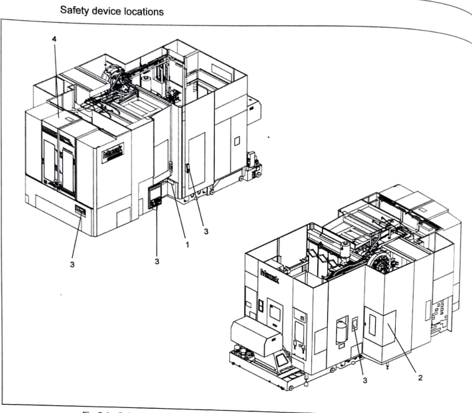

Document ID: 371
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet striking visual representation of the number 2. The number is displayed in a large, bold font against a white background, surrounded by a thin gray border. This border adds a subtle touch of elegance to the overall design.

Here are the key features of the image:

* **Number 2**: The number 2 is prominently displayed in a large, bold font, taking center stage in the image.
* **White Background**: The number is set against a clean and crisp white background, which provides a neutral contrast that allows the number to stand out.
* **Thin Gray Border**: A thin gray border surrounds the entire image, adding a touch of sophistication and framing the number nicely.

Overall, the image is a straightforward and effective representation of the number 2, with a clean and modern design aesthetic.
Image:


Document ID: 372
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of two identical pieces of machinery, showcasing their various components and features. The top-down and isometric views provide a comprehensive understanding of the machine's layout and functionality.

* **Machine Components:**
	+ 1. Electrical Panel
	+ 2. Control Panel
	+ 3. Motor
	+ 4. Fan
	+ 5. Air Filter
	+ 6. Electrical Connection
* **Machine Features:**
	+ 1. Access Panel
	+ 2. Control Panel
	+ 3. Motor Mounting
	+ 4. Fan Mounting
	+ 5. Air Filter Housing
	+ 6. Electrical Connection

In summary, the image provides a detailed technical drawing of the machine, highlighting its various components and features. The use of numbers and arrows effectively labels and explains each part of the machine, making it easier for viewers to understand its functionality and operation.
Image:


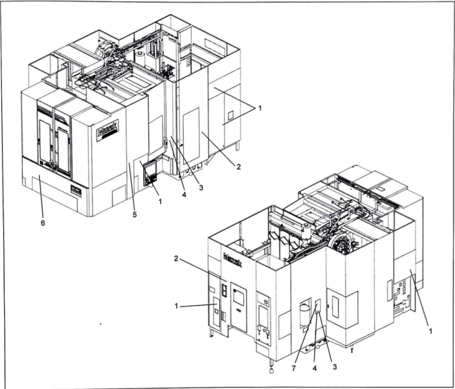

Document ID: 373
Source: /content/man1_merged.pdf
Content:
The image is a blurry, grayscale diagram of a rectangle with a number three inside it. 

* The rectangle is outlined in a thick black line and has a white interior.
	+ The rectangle is centered in the image and takes up most of the space.
	+ The rectangle is rectangular in shape, with a width that is approximately 1.5 times its height.
* Inside the rectangle, there is a large, grayish-black number three.
	+ The number three is written in a bold, sans-serif font.
	+ The number three is centered within the rectangle and takes up most of the space inside it.
* There are no other notable features in the image.

The image appears to be a simple graphic or icon, possibly used to represent a numerical value or quantity.
Image:


Document ID: 374
Source: /content/man1_merged.pdf
Content:
The image displays a blurry, black number 3 on a white background.

The number 3 is in the center of the image and is written in a large, bold font. It is positioned slightly to the left of the middle of the image. The number is dark gray, and it appears to be a sans-serif font. The background of the image is white, with a gray border around the edges. The border is thicker at the top and bottom than it is on the sides. The overall effect is one of simplicity and clarity, with the large number 3 standing out prominently against the clean white background.
Image:


Document ID: 375
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a machine, comprising multiple components and parts. The diagram is divided into three sections, each featuring a distinct view of the machine.

*   **Top-Left View**
    *   This section displays the machine's front perspective, showcasing its overall structure and design.
    *   The view highlights the machine's front panel, which features various buttons, controls, and interfaces.
    *   The diagram includes labels and numbers corresponding to specific parts of the machine, providing a clear identification of its components.
*   **Bottom-Left View**
    *   This section presents a side view of the machine, offering insights into its internal mechanisms and layout.
    *   The view reveals the machine's side panel, which houses several components, including motors, gears, and other mechanical elements.
    *   The diagram provides a detailed illustration of the machine's internal wo

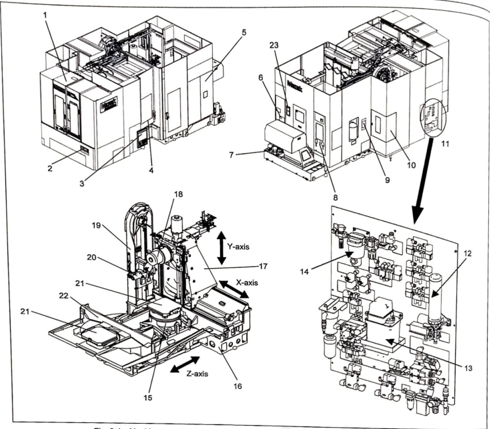

Document ID: 376
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated number 3 in a white box with a gray border.

* The number 3 is written in large, dark gray font.
	+ It is centered within the white box.
	+ The number appears to be a bold, sans-serif font.
* The white box has a gray border around it.
	+ The border is thin and evenly spaced on all sides.
	+ It provides a clear contrast between the white box and the surrounding background.
* The background of the image is a solid gray color.
	+ It provides a neutral and unobtrusive backdrop for the white box and number 3.

Overall, the image effectively presents a simple and clear visual representation of the number 3, with a clean and modern design aesthetic.
Image:


Document ID: 377
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram featuring four sketches of a mechanical part, each with distinct labels and arrows. The purpose of the diagram appears to be instructional or explanatory, likely used in a technical context such as engineering or manufacturing.

* **Top-left Sketch:**
	+ Label: "X-axis"
	+ Description: A simple diagram showing a circular object with two protruding lines, one horizontal and one vertical.
	+ Statistics: None
* **Top-right Sketch:**
	+ Label: "Y-axis"
	+ Description: A more complex diagram depicting a rectangular object with various lines and shapes, including a horizontal line with an arrow pointing to the right.
	+ Statistics: None
* **Bottom-left Sketch:**
	+ Label: "Z-axis"
	+ Description: Another complex diagram showing a rectangular object with multiple lines and shapes, including a vertical line with an arrow pointing down.
	+ Statistics: None
* **Bottom-right Sketch:**
	+ Label: None


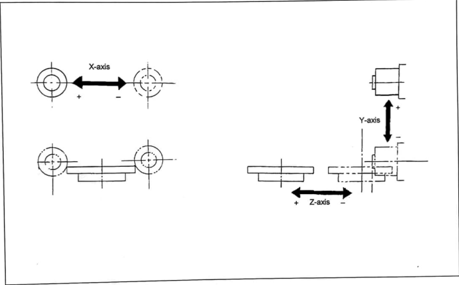

Document ID: 378
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated representation of the number "3" within a square box. The number "3" is displayed in a large, black font, with its center aligned to the middle of the square box. The box has a thick gray border, which is also visible when viewed from a distance.

Upon closer inspection, it appears that the image may have been cropped or resized, resulting in a distorted appearance. The overall effect is one of fuzziness and lack of clarity, making it difficult to discern finer details.

Despite the blurred quality, the number "3" remains somewhat legible, suggesting that the image may have been intentionally designed to convey this specific digit. However, the surrounding context and any additional information are unclear due to the poor image quality.
Image:


Document ID: 379
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign accompanied by the word "WARNING" in bold, black text. The purpose of this image is to convey a sense of caution or alertness to the viewer.

Here are the key elements of the image:

* Warning sign:
	+ A triangle with an exclamation mark inside
	+ The triangle is outlined in black and has a solid white interior
	+ The exclamation mark is also black
* Text:
	+ The word "WARNING" is written in bold, black font
	+ It is positioned below the warning sign

In summary, the image effectively conveys a warning message through its use of a clear and recognizable symbol (the warning sign) combined with a prominent display of the word "WARNING" in bold text.
Image:


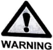

Document ID: 380
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a machine, accompanied by labels and annotations that provide additional information about the device. The drawing is divided into two sections, each showcasing a distinct perspective of the machine.

* **Machine Rear Maintenance Cover**
	+ Located at the bottom left of the image
	+ Labeled with the text "Machine rear maintenance cover"
	+ Depicts the rear of the machine, with various components and features visible
* **X-axis Maintenance Cover**
	+ Positioned at the top left of the image
	+ Labeled with the text "X-axis maintenance cover"
	+ Shows the front of the machine, highlighting the X-axis maintenance cover and its surrounding components

The image provides a detailed view of the machine's design and layout, allowing for a thorough understanding of its structure and functionality. The inclusion of labels and annotations enhances the clarity and usability of the drawing, making i

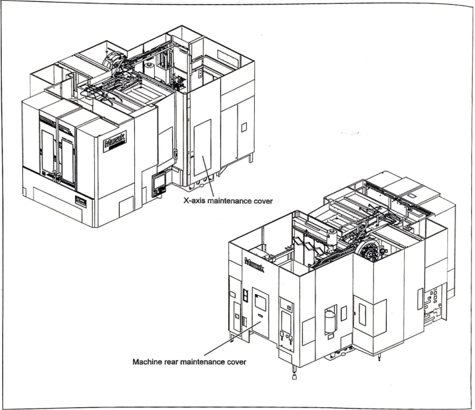

Document ID: 381
Source: /content/man1_merged.pdf
Content:
The image presents a cautionary message, featuring a triangle with an exclamation mark inside it and the word "CAUTION" below it.

* The triangle is centered in the image and has a black outline.
	+ The triangle is equilateral, with all sides being equal in length.
	+ The apex of the triangle points upwards.
* Inside the triangle, there is an exclamation mark.
	+ The exclamation mark is black in color.
	+ It is positioned at the center of the triangle.
* Below the triangle, the word "CAUTION" is written in black text.
	+ The font used for the text is sans-serif.
	+ The text is aligned to the left.

In summary, the image effectively conveys a sense of caution through its simple yet striking design. The use of a triangle and exclamation mark creates a clear visual warning, while the text "CAUTION" reinforces the message.
Image:


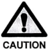

Document ID: 382
Source: /content/man1_merged.pdf
Content:
The image is a warning sign with a triangle and an exclamation mark inside, set against a white background. The purpose of the image is to convey a sense of caution or alertness.

Here are the key features of the image:

* **Triangle:**
	+ Shape: Equilateral triangle
	+ Color: Black
	+ Size: Approximately 2/3 of the image's height
* **Exclamation Mark:**
	+ Symbol: An exclamation mark (!)
	+ Color: Black
	+ Position: Inside the triangle
	+ Size: Approximately 1/4 of the triangle's width
* **Text:**
	+ Word: "WARNING"
	+ Font: Bold, sans-serif font
	+ Color: Black
	+ Size: Approximately 1/2 of the image's height
	+ Position: Below the triangle

In summary, the image is a simple yet effective warning sign that conveys a sense of urgency and caution. The use of a bold, black font and a prominent exclamation mark inside a triangle creates a clear and attention-grabbing visual message.
Image:


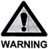

Document ID: 383
Source: /content/man1_merged.pdf
Content:
The image presents a black and white line drawing of a power outlet, accompanied by text that provides instructions on how to reset it. The purpose of the image is to illustrate the process of resetting a power outlet.

* **Power Outlet**
	+ The power outlet is depicted as a simple line drawing.
	+ It has two outlets, one on the left and one on the right.
	+ A cord is plugged into the right outlet.
* **Text**
	+ The text "OPEN RESET OFF" is written in a curved line above the power outlet.
	+ The text "TRIP" is written in a curved line above the cord.
* **Background**
	+ The background of the image is a solid beige color.
	+ A thin black border surrounds the image.

The image effectively conveys the necessary steps to reset a power outlet, making it a useful resource for individuals who need to understand the process.
Image:


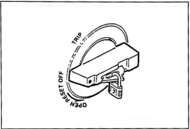

Document ID: 384
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the words "REGULAR INSPECTION" and the number "4" in it.

* The text is written in black, sans-serif font.
	+ The text box is outlined in black.
	+ It is positioned in the top-left corner of the image.
* The number "4" is displayed in a white square with a black outline.
	+ The square is positioned to the right of the text box.
	+ It is slightly larger than the text box.

The image appears to be a label or indicator for a regular inspection, possibly used in a professional or industrial setting.
Image:


Document ID: 385
Source: /content/man1_merged.pdf
Content:
The image presents a simple, text-based graphic with the title "REGULAR INSPECTION" prominently displayed. The purpose of this image appears to be informational or instructional, likely serving as a heading or label for a larger document or presentation.

Here are the key elements of the image:

* **Number 4**
	+ Located in the top-left corner
	+ Black font color
	+ Rectangular shape with a thin black border
* **Title "REGULAR INSPECTION"**
	+ Positioned below the number 4
	+ Black font color
	+ Centered and aligned horizontally
* **Background**
	+ White color

In summary, the image features a clear and concise display of the title "REGULAR INSPECTION," accompanied by a small number 4 in a rectangular box. The use of a plain white background helps to draw attention to the text, making it easy to read and understand.
Image:


Document ID: 386
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "REGULAR INSPECTION" and a numerical identifier. The purpose of this image is likely to serve as a label or indicator for inspection purposes.

* A number in a box:
	+ The number is 4.
	+ It is enclosed within a small white square with a thin black border.
	+ The number is positioned in the top-left corner of the image.
* The words "REGULAR INSPECTION":
	+ The text is written in a clear, sans-serif font.
	+ It is centered below the number in the box.
	+ The text is in all capital letters.
* A gray background:
	+ The background is a solid, light gray color.
	+ It provides a neutral backdrop for the text and number.

The image effectively conveys a straightforward message about regular inspection, making it suitable for use in various contexts where such identification is necessary.
Image:


Document ID: 387
Source: /content/man1_merged.pdf
Content:
The image presents a concise and straightforward visual representation of the text "REGULAR INSPECTION." The main points are as follows:

• **Number 4 in a box**: A small white box with a black border contains the number 4, positioned in the top-left corner of the image.
• **Text**: The words "REGULAR INSPECTION" are written in black font, situated to the right of the box containing the number 4.
• **Background**: The background of the image is a plain white color, providing a clean and neutral backdrop for the text.

In summary, the image effectively communicates the message "REGULAR INSPECTION" through a simple yet clear design, utilizing a prominent number and concise text against a white background.
Image:


Document ID: 388
Source: /content/man1_merged.pdf
Content:
The image presents a close-up view of a metal surface with a blue hue, featuring a pattern of oval-shaped indentations. The surface appears to be made of metal, with a blue color that suggests it may have been coated or painted.

*   **Metal Surface**
    *   The surface is made of metal.
    *   It has a blue color.
    *   The blue color may be due to a coating or paint.
*   **Oval Indentations**
    *   There are oval-shaped indentations on the surface.
    *   The indentations are evenly spaced and aligned in a specific pattern.
    *   The indentations are likely machined or stamped into the metal surface.
*   **Edge of the Surface**
    *   The edge of the surface is visible at the top of the image.
    *   The edge appears to be sharp and defined.
    *   It is not clear what material the edge is made of.
*   **Background**
    *   The background of the image is out of focus.
    *   It appears to be a dark color, possib

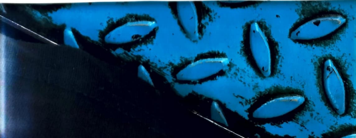

Document ID: 389
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "REGULAR INSPECTION" and a number "4" in a square box. The purpose of this image is likely to serve as a visual indicator or label for a specific category or process related to regular inspections.

* A square box with the number "4" in it:
	+ The box is a small, rectangular shape with a solid black outline.
	+ The number "4" is centered within the box, also in black.
	+ The box is positioned to the left of the text.
* The words "REGULAR INSPECTION" in black text:
	+ The text is written in a simple, sans-serif font.
	+ The words are left-aligned and take up most of the width of the image.
	+ The text is in black, which provides good contrast against the white background.
* A white background:
	+ The background is a plain, solid white color.
	+ There are no other design elements or patterns on the background.

The image effectively conveys a clear message through

Document ID: 390
Source: /content/man1_merged.pdf
Content:
The image is a warning symbol, consisting of a triangle with an exclamation mark inside and the word "WARNING" below it.

* The triangle is centered in the image and has a black outline.
	+ The triangle is equilateral, with all sides being equal in length.
	+ The triangle is pointing upwards, with the apex at the top.
* The exclamation mark is located inside the triangle, near the center.
	+ The exclamation mark is black and bold, making it stand out against the white background of the triangle.
	+ The exclamation mark is symmetrical, with the vertical line on the left and the horizontal line on the right.
* The word "WARNING" is written in black text below the triangle.
	+ The text is in all capital letters, making it easy to read.
	+ The text is centered, both horizontally and vertically, below the triangle.

Overall, the image effectively conveys a sense of warning or caution, with the bold exclamation mark and the clear, ea

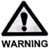

Document ID: 391
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a machine, accompanied by a checklist of safety procedures to be followed when operating the device. The diagram is divided into two sections: the top section features a drawing of the machine, while the bottom section provides a list of safety procedures.

**Machine Diagram:**

* The diagram illustrates the machine's components, including:
	+ A spindlehead
	+ A pallet changer
	+ A setup station
	+ A pallet changer safety cover
* The diagram is labeled with numbers 1-7, corresponding to each of the safety procedures outlined in the checklist.

**Safety Procedures Checklist:**

* **Removing chips from on top of the spindlehead**
	+ Remove chips from the area near the ATC door
	+ If chips are accumulated in this area during machining and/or during the execution of ATC cycle, adjust the angle of the Niagara coolant nozzles so that coolant washes away chips
	+ Accumulation of chips and other

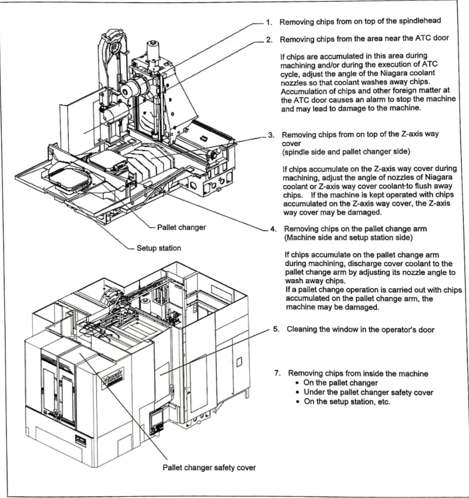

Document ID: 392
Source: /content/man1_merged.pdf
Content:
The image displays a simple text graphic with the words "REGULAR INSPECTION" and a number "4" in a box. 

* The text is in all capital letters, with "REGULAR INSPECTION" on the left side of the image and "4" on the right side.
	+ The text is in a dark gray color.
	+ The font is a sans-serif font.
* The number "4" is inside a small square box.
	+ The box is outlined in a thin line.
	+ The number is centered within the box.
* The background of the image is white.

The image appears to be a label or indicator for a regular inspection, possibly used in a workplace or industrial setting.
Image:


Document ID: 393
Source: /content/man1_merged.pdf
Content:
The image contains a single line of text and a number enclosed in a box.

The text, "REGULAR INSPECTION," is written in all capital letters and appears to be a label or heading.

To the left of the text is a small box containing the number 4 in black text. The box is outlined in black, and the text inside it is also black.

The background of the image is white, providing a clean and neutral backdrop for the text and box. Overall, the image appears to be a simple label or heading used in a technical or professional context.
Image:


Document ID: 394
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of an electrical control cabinet, accompanied by a caption that provides context for the diagram. The purpose of the image is to illustrate the components and layout of the cabinet, likely for instructional or maintenance purposes.

* A technical drawing of an electrical control cabinet:
	+ The cabinet is depicted in a 3D isometric view, showcasing its various components and features.
	+ The drawing includes labels and annotations to identify specific parts and their functions.
* The cabinet is shown with various components and features:
	+ The cabinet contains several panels, doors, and compartments, each with its own unique characteristics and purposes.
	+ The drawing highlights the location and connection of various electrical components, such as wires, switches, and outlets.
* The drawing is labeled with text and numbers:
	+ The caption "6. Cleaning the electrical control cabinet cooli

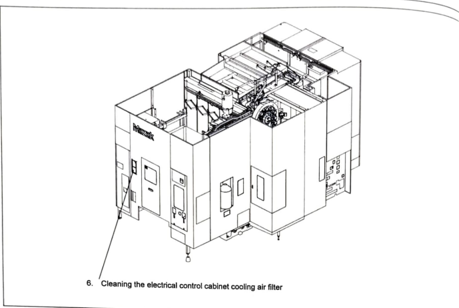

Document ID: 395
Source: /content/man1_merged.pdf
Content:
The image displays a warning sign with the word "CAUTION" underneath it.

* The triangle is a warning sign, indicating caution or danger.
	+ It has a black outline and a white interior.
	+ The triangle is centered in the image.
* The exclamation mark is inside the triangle, emphasizing the importance of the warning.
	+ It is also black in color.
	+ The exclamation mark is positioned at the center of the triangle.
* The word "CAUTION" is written below the triangle in black text.
	+ It is written in all capital letters.
	+ The font is simple and easy to read.

Overall, the image effectively conveys a sense of caution or warning, making it clear that attention should be paid to the potential danger or risk indicated by the sign.
Image:


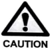

Document ID: 396
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "WARNING" below it. The purpose of this image is to convey a sense of caution or alertness.

* A triangle with an exclamation mark inside:
	+ The triangle is equilateral.
	+ The exclamation mark is centered within the triangle.
	+ The triangle and exclamation mark are depicted in black.
* The word "WARNING" is written below the triangle:
	+ The text is in all capital letters.
	+ The font is simple and sans-serif.
	+ The text is also depicted in black.

The image effectively conveys a warning message through the use of a clear and recognizable symbol (the triangle with an exclamation mark) and a prominent text label ("WARNING"). The simplicity and boldness of the design make it easy to understand and attention-grabbing.
Image:


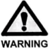

Document ID: 397
Source: /content/man1_merged.pdf
Content:
The image depicts a warning sign, featuring a triangle with an exclamation mark inside. The triangle is outlined in black and has a white interior, while the exclamation mark is also black. The background of the image is white.

*   **Triangle:**
    *   Outlined in black
    *   White interior
*   **Exclamation Mark:**
    *   Black color
*   **Background:**
    *   White color

The image effectively conveys a sense of warning or caution, making it suitable for use in various contexts where attention is needed.
Image:


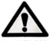

Document ID: 398
Source: /content/man1_merged.pdf
Content:
The image is a simple graphic of a warning sign with the word "CAUTION" written below it. 

* The triangle is centered in the image and has a thick black border.
	+ The triangle is equilateral.
	+ The triangle has a white interior.
	+ There is a black exclamation mark in the center of the triangle.
* The word "CAUTION" is written in all capital letters below the triangle.
	+ The text is black.
	+ The text is in a sans-serif font.
	+ The text is centered below the triangle.

The image appears to be a warning sign, possibly for a hazardous situation or area. The use of a triangle shape and an exclamation mark is a common visual cue for warning signs.
Image:


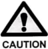

Document ID: 399
Source: /content/man1_merged.pdf
Content:
The image displays a simple text and number combination, likely used as a label or identifier in a technical or instructional context.

* The text is written in a monospaced, sans-serif font and reads "REGULAR INSPECTION".
	+ The text is centered within the image.
	+ It is capitalized, indicating that it may be a title or heading.
* A number is displayed to the right of the text.
	+ The number is "4" and is enclosed in a small square.
	+ The square is a light gray color with a thin black outline.
* The background of the image is white.
	+ There are no other visual elements or distractions in the image.

Overall, the image appears to be a straightforward and functional design, intended to convey information clearly and efficiently. The use of a simple font and color scheme suggests that the image may be intended for use in a technical or instructional setting, where clarity and readability are important.
Image:


Document ID: 400
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a gray border and a large number "4" in the center. The box is aligned to the left within the image, leaving considerable empty space on the right side.

* A rectangular box:
	+ Gray border
	+ Aligned to the left within the image
	+ Leaves considerable empty space on the right side
* The number "4":
	+ Large font
	+ Centered within the box
	+ Gray color
* A gray background:
	+ Serves as the base color of the image
	+ Provides a neutral backdrop for the box and the number "4"

In summary, the image features a gray-bordered rectangular box containing the large number "4" against a gray background. The overall design is minimalist and straightforward, drawing attention to the central element: the number "4".
Image:


Document ID: 401
Source: /content/man1_merged.pdf
Content:
The image displays a warning sign with the word "WARNING" written below it. The purpose of this image is to alert the viewer of potential danger or risk.

* A warning sign:
	+ The sign is triangular, with a black border and a white interior.
	+ Inside the triangle, there is an exclamation mark symbol, which is also black.
	+ The sign is positioned at the top of the image.
* The word "WARNING":
	+ The word is written in all capital letters.
	+ It is centered below the warning sign.
	+ The font is simple and sans-serif.

The image effectively conveys a sense of caution and alertness, suggesting that the viewer should be aware of potential hazards or risks. The use of a clear and recognizable warning sign, combined with the bold and prominent display of the word "WARNING", makes it difficult to ignore or overlook the message.
Image:


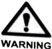

Document ID: 402
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign with the word "CAUTION" written below it, set against a white background.

* The warning sign is a triangle with an exclamation mark inside it.
	+ The triangle is outlined in black and has a white interior.
	+ The exclamation mark is also black.
* The word "CAUTION" is written in all capital letters below the triangle.
	+ The text is centered and in a simple, sans-serif font.
	+ The color of the text matches the outline of the triangle, which is black.

In summary, the image features a warning sign with a prominent exclamation mark and the word "CAUTION" written below it, both in black text on a white background.
Image:


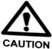

Document ID: 403
Source: /content/man1_merged.pdf
Content:
The image presents a grayscale letter "L" against a white background, with a subtle shadow effect.

* The letter "L" is the central focus of the image.
	+ It is rendered in a grayscale color scheme.
	+ The letter is positioned at an angle, with its top-left corner pointing towards the upper-right side of the image.
	+ The letter's shape is characterized by a vertical line on the left and a horizontal line at the bottom, with a curved connection between them.
* The background of the image is a solid white color.
* A subtle shadow effect is visible around the edges of the letter "L".
	+ The shadow is darker than the grayscale color of the letter.
	+ It adds depth and dimension to the image.

In summary, the image features a stylized grayscale letter "L" against a clean white background, with a hint of shadowing to enhance its visual appeal.
Image:


Document ID: 404
Source: /content/man1_merged.pdf
Content:
The image displays a blurry, pixelated, black-and-white logo or text against a white background.

The text is centered in the image and reads "L1" in large, bold font. The "L" is on the left side of the text and the "1" is on the right side. Both letters are outlined in black with a thick border, and the interior of each letter is filled with a dark gray color. The text is also slightly shadowed, giving it a 3D appearance.

The background of the image is solid white, providing a clean and simple contrast to the black-and-white text. Overall, the image appears to be a logo or graphic element that could be used in a variety of contexts, such as a website, document, or advertisement.
Image:


Document ID: 405
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a mechanical device, likely a component of a larger system. The drawing is rendered in black and white, with various lines, shapes, and symbols used to convey information about the device's design and functionality.

**Key Features:**

* **Lines and Shapes:**
	+ Thin black lines form the outline of the device.
	+ Thick black lines are used for internal components, such as pipes or tubes.
	+ Circles and rectangles are used to represent various parts of the device.
* **Symbols:**
	+ Arrows indicate the direction of flow or movement within the device.
	+ Letters (H, L, L1) are used to label different parts of the device.
* **Background:**
	+ The background of the image is a solid light gray color.
* **Overall Impression:**
	+ The image appears to be a detailed technical drawing, likely created for engineering or manufacturing purposes.

**Summary:**

The image is a technical drawing of a m

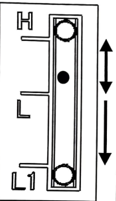

Document ID: 406
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a machine, accompanied by a detailed description of its components and a call to action. The diagram is titled "3. Checking the Window" and features a black-and-white line drawing of the machine.

* **Machine Diagram**
	+ A 3D line drawing of the machine, showcasing its various components and parts.
	+ The diagram is labeled with arrows pointing to specific features, such as the window in the operator's door.
* **Window in the Operator's Door**
	+ A small window located in the door of the machine, which appears to be accessible from the inside.
	+ The window is depicted as being partially open, allowing for visibility into the machine's interior.
* **Call to Action**
	+ A caption below the diagram reads "Window in the operator's door", indicating the purpose of the diagram is to illustrate this specific feature.
	+ The caption is likely intended to guide the viewer's attention to the im

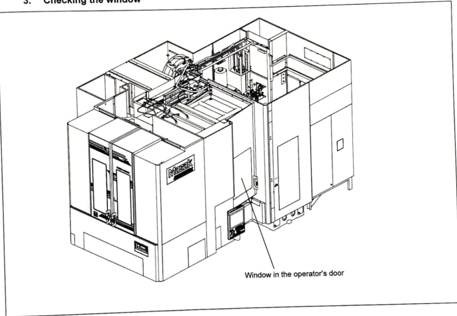

Document ID: 407
Source: /content/man1_merged.pdf
Content:
The image displays a warning sign with a triangle and an exclamation mark inside it, accompanied by the word "WARNING" in bold black text below.

*   The triangle is centered at the top of the image and is outlined in black. It has a white interior with a black exclamation mark in the center.
*   Below the triangle, the word "WARNING" is written in bold black text. The text is aligned to the left and takes up about half of the image's width.
*   The background of the image is solid white.

Overall, the image effectively conveys a sense of caution or alertness due to the use of a warning sign and bold black text.
Image:


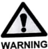

Document ID: 408
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the words "REGULAR INSPECTION" and the number "4" inside it.

* The text box is a small, white rectangle with a thin black border.
	+ It is positioned in the top-right corner of the image.
	+ The text inside the box is in all capital letters.
* The text inside the box reads "REGULAR INSPECTION".
	+ The font is plain and sans-serif.
	+ The text is centered within the box.
* The number "4" is displayed inside the box.
	+ It is positioned to the right of the text "REGULAR INSPECTION".
	+ The font is the same as the text, but larger.

Overall, the image appears to be a label or indicator for a regular inspection, possibly used in a technical or industrial context.
Image:


Document ID: 409
Source: /content/man1_merged.pdf
Content:
The image is a blurry, low-resolution representation of the number "4" in a large font size. The number is centered within a square box with a white background and a gray border.

*   **Number 4:**
    *   The number "4" is displayed in a large font size.
    *   It is centered within the square box.
    *   The number is slightly blurry, making it difficult to discern details.
*   **Square Box:**
    *   The square box has a white background.
    *   It has a gray border around its edges.
    *   The border is thicker at the top and bottom than on the left and right sides.
*   **Background:**
    *   The background of the image is a solid gray color.
    *   It provides a neutral backdrop for the number and square box.

In summary, the image features a large, blurry number "4" within a square box with a white background and a gray border. The background of the image is a solid gray color.
Image:


Document ID: 410
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a mechanical component, featuring a cylindrical object with a bolt and indicator. The diagram is accompanied by a part number and a reference code.

*   **Cylindrical Object**
    *   The cylindrical object is the central element of the diagram.
    *   It has a flat top with a bolt protruding from it.
    *   The bolt is positioned at the top of the object, with an indicator pointing to it.
    *   The object is shown in a two-dimensional representation, with clean lines and minimal shading.
*   **Bolt**
    *   The bolt is located on top of the cylindrical object.
    *   It is depicted as a small, cylindrical piece with a threaded end.
    *   The bolt is attached to the object via a small base plate.
*   **Indicator**
    *   The indicator is a small, rectangular piece that points to the bolt.
    *   It is positioned at an angle, with one end attached to the object and the other en

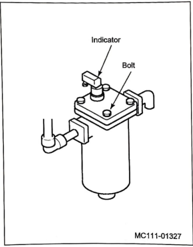

Document ID: 411
Source: /content/man1_merged.pdf
Content:
This image is a black-and-white photograph of a person's hands working on a piece of machinery. 

The foreground of the image shows the person's hands, wearing white gloves, engaged in manipulating the machinery. The hands are positioned in front of a large metal machine, with their fingers grasping a small metal component. The person's attire, including the gloves and sleeves, suggests that they are likely in a workshop or industrial setting.

In the background, the machine takes center stage, its metal components and mechanisms visible against the dark background. The image appears to capture a moment of maintenance or repair work, with the person focused intently on their task.

Overall, the image conveys a sense of industriousness and attention to detail, highlighting the importance of manual labor and machinery maintenance in various industries.
Image:


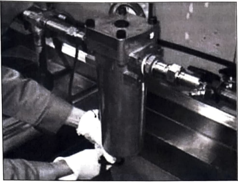

Document ID: 412
Source: /content/man1_merged.pdf
Content:
The image is a blurry black-and-white photograph of a person in a lab setting, wearing a white glove on their left hand.

The person is mostly out of frame, with only their hand in focus. They are wearing a white glove on their left hand, which is reaching over a metal object, presumably a pipe or valve. The person's sleeve is dark and can be seen up to their wrist. They are reaching over a cylindrical object that could be a metal pipe or valve. It has a circular opening at the top. A white square attached to a black rod is also in the foreground. 

The background shows a dark, metal industrial pipe on a metal frame. The wall in the background is dark, and there are some white scuff marks on it. The overall atmosphere suggests that the person is working in a laboratory or workshop setting, possibly conducting an experiment or maintenance task. The image appears to be a vintage photograph, possibly from the early 20th century.
I

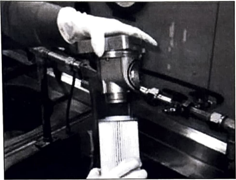

Document ID: 413
Source: /content/man1_merged.pdf
Content:
The image presents a black-and-white icon of two trash cans, accompanied by a bold black border that encloses the entire graphic. The trash cans are depicted in a simple yet effective line drawing style, with a solid oval shape at the top and vertical lines on the sides. The cans are positioned side by side, with the one on the left slightly closer to the viewer.

**Key Features:**

* **Trash Cans:** The two trash cans are the central element of the image, drawn in a clean and straightforward manner.
* **Border:** A thick black border surrounds the entire graphic, adding a sense of depth and framing the trash cans.
* **Background:** The background of the image is a plain white, providing a neutral and unobtrusive backdrop for the trash cans and border.
* **Arrows:** Two arrows, one pointing to the left and one to the right, are situated on either side of the trash cans, adding a sense of movement and direction to the image.

Ov

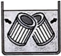

Document ID: 414
Source: /content/man1_merged.pdf
Content:
The image depicts a black-and-white graphic of an object, possibly a trash can or a container, with a lid and a handle. 

*   The object is centered in the image and has a cylindrical shape with vertical lines on its body.
    *   It has a flat top with a small, round lid that is slightly raised.
    *   A short handle extends from the top of the object, curving downward at the end.
*   There are four teardrop shapes on either side of the object, suggesting steam or water vapor emanating from it.
    *   These shapes are symmetrical and evenly spaced, with two on each side of the object.
*   The background of the image is white, providing a clean and simple contrast to the black-and-white graphic.

In summary, the image presents a stylized illustration of an object, likely a trash can or container, with a lid and a handle, surrounded by steam or water vapor. The use of black and white colors creates a striking visual effect, wh

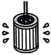

Document ID: 415
Source: /content/man1_merged.pdf
Content:
The image is a simple black-and-white graphic of a cylindrical object with vertical lines on it, accompanied by two arrows pointing upwards to its right.

* The object is drawn in a thick black line style and appears to be made of a cylindrical shape with vertical lines running down its length.
	+ The object is positioned in the left half of the image.
	+ The object has a circular top and bottom, with a small gap between the top and bottom edges.
	+ The vertical lines are evenly spaced and run from the top to the bottom of the object.
* To the right of the object are two black arrows pointing upwards.
	+ The arrows are identical in size and shape.
	+ They are positioned vertically, one above the other.
	+ The arrows are also drawn in a thick black line style.

The image features a simple black-and-white graphic of a cylindrical object with vertical lines on it, accompanied by two arrows pointing upwards to its right. The object

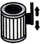

Document ID: 416
Source: /content/man1_merged.pdf
Content:
The image features a black-and-white graphic of two cans, set against a light gray background with a darker gray border. The cans are positioned side by side, with their tops facing upwards and their sides featuring vertical lines.

A black line separates the cans from the rest of the graphic, while two black arrows point towards the cans from either side, suggesting that they may be being opened or closed. The overall design appears to be a simple yet effective representation of a common household item, possibly used for storage or packaging purposes.
Image:


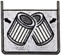

Document ID: 417
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white line drawing of a cylindrical object with vertical lines on its sides and a horizontal line at the top. The object is positioned centrally in the image, surrounded by four teardrop shapes on either side.

Here are the key features of the image:

* **Object:**
	+ Color: Black
	+ Shape: Cylindrical
	+ Vertical lines: Present, running along the sides of the object
	+ Horizontal line: Present, located at the top of the object
* **Teardrop Shapes:**
	+ Color: Black
	+ Number: Four
	+ Position: Two on either side of the object

In summary, the image features a black-and-white line drawing of a cylindrical object with vertical lines and a horizontal line at the top, surrounded by four teardrop shapes. The object is centered in the image, with the teardrop shapes arranged symmetrically on either side.
Image:


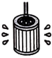

Document ID: 418
Source: /content/man1_merged.pdf
Content:
The image presents a simple, pixelated graphic of the number 4 within a square frame. The numeral "4" is prominently displayed in the center of the image, set against a white background.

*   **Number 4:**
    *   The number 4 is rendered in a dark gray color.
    *   It is positioned centrally within the square frame.
    *   The font used for the number is sans-serif.
*   **Square Frame:**
    *   The square frame that encloses the number 4 is also dark gray in color.
    *   It has a thin border around its edges.
    *   The frame's dimensions are not explicitly stated but appear to be of equal width and height.
*   **Background:**
    *   The background of the image is a solid white color.
    *   This provides a clean and neutral contrast to the dark gray number and frame.

In summary, the image features a central number 4 within a square frame, both in dark gray, against a white background. The simplicity of the design ma

Document ID: 419
Source: /content/man1_merged.pdf
Content:
The image displays a simple, text-based graphic with the words "REGULAR INSPECTION" and a number 4 in a box. The purpose of the image is to convey information about regular inspections.

* A number 4 in a box:
	+ The number 4 is displayed in a small, rectangular box.
	+ The box is outlined in black and has a slight shadow effect.
	+ The number 4 is centered within the box.
* The words "REGULAR INSPECTION":
	+ The text is written in a simple, sans-serif font.
	+ The words are aligned to the right of the image.
	+ The text is dark gray in color.

The image effectively conveys the message that regular inspections are important, with the number 4 indicating a specific frequency or standard. The use of a simple, bold font and a clear layout makes the image easy to read and understand.
Image:


Document ID: 420
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "REGULAR INSPECTION" and a number "4" in a box. The purpose of this image is unclear due to its brevity.

*   **Text**
    *   The text "REGULAR INSPECTION" is written in all capital letters.
    *   It is positioned on the left side of the image.
*   **Number**
    *   The number "4" is enclosed in a thin black square.
    *   The square is located on the right side of the image.
*   **Background**
    *   The background of the image is white.
    *   There are no other elements or details present in the image.

In summary, the image features a straightforward design with a prominent text and a numbered box, set against a plain white background.
Image:


Document ID: 421
Source: /content/man1_merged.pdf
Content:
The image displays a blurry, pixelated number 4 in a box.

* The number 4 is written in a dark gray font and is positioned in the center of the image.
	+ It is surrounded by a thin, light gray border that forms a square around the number.
	+ The border has a subtle shadow effect, giving it a slightly raised appearance.
* The background of the image is a plain white color, providing a clean and neutral backdrop for the number 4.

Overall, the image appears to be a simple graphic design element, possibly used as a placeholder or icon in a digital context.
Image:


Document ID: 422
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "CAUTION" below it. The sign is set against a white background.

*   A triangle:
    *   The triangle is outlined in black and has a solid fill.
    *   It is positioned at the top of the image.
    *   Inside the triangle is a black exclamation mark.
*   An exclamation mark:
    *   The exclamation mark is black and centered within the triangle.
    *   It is a standard exclamation mark symbol.
*   The word "CAUTION":
    *   The word "CAUTION" is written in black text below the triangle.
    *   It is aligned to the left side of the image.

The overall design of the sign is simple and straightforward, effectively conveying a warning message to the viewer.
Image:


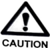

Document ID: 423
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram and two photographs, likely illustrating the assembly or disassembly of a machine component. The diagram on the left depicts a 3D rendering of the component, accompanied by a labeled arrow pointing to a specific part. The photograph on the right shows a grease cartridge, while the second photograph appears to display the component being assembled.

*   **Diagram on the Left:**
    *   A 3D rendering of the component
    *   Labeled arrow pointing to a specific part
*   **Photograph on the Right:**
    *   Grease cartridge
    *   Component being assembled
*   **Second Photograph:**
    *   Displaying the component being assembled

The image suggests that the component is a grease cartridge, and the diagrams and photographs provide a step-by-step guide for its assembly or disassembly. The labeled arrow in the diagram highlights the specific part being referred to in the photographs, indicat

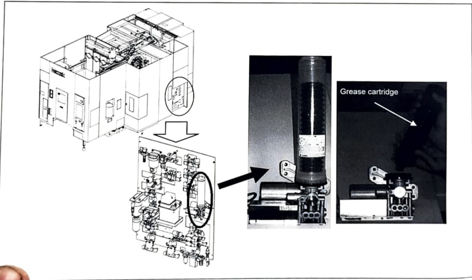

Document ID: 424
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet informative visual representation of a regular inspection process. The key elements in the image are:

* **Text:**
	+ The word "REGULAR INSPECTION" is displayed in a clear and concise manner.
	+ The text is presented in a dark gray font, which provides good contrast against the light gray background.
* **Number:**
	+ A small square box is positioned to the right of the text.
	+ Inside the box, the number "4" is displayed in a large, bold font.
* **Background:**
	+ The background of the image is a light gray color, which provides a clean and neutral backdrop for the text and number.
	+ A darker gray border surrounds the entire image, which helps to frame the content and create visual hierarchy.

In summary, the image effectively communicates the concept of a regular inspection process through its clear and concise text, accompanied by a prominent number and a clean background. The use of a dark g

Document ID: 425
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a mechanical device, comprising various components and features. The diagram is rendered in black and white, with a focus on the device's design and functionality.

*   **Device Description:**
    *   The device features a central component with a cylindrical shape, adorned with a series of horizontal lines that suggest either grooves or ridges.
    *   A smaller, rectangular component is attached to the side of the central unit, with an arrow pointing towards it, indicating its connection or movement.
    *   Another rectangular component is positioned at the bottom of the central unit, featuring a circular component attached to it, which may be a wheel or gear.
    *   A small, cylindrical component is situated at the top of the central unit, accompanied by an arrow pointing towards it, implying its connection or movement.
*   **Background and Context:**
    *   The diagram is set aga

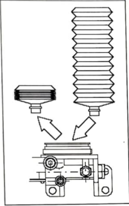

Document ID: 426
Source: /content/man1_merged.pdf
Content:
The image depicts a blurry, pixelated icon featuring a wrench and a square with a thick border. The wrench is positioned centrally within the square, but its details are obscured by the blurriness. The square itself has a thick, gray border, with a subtle shadow effect around it. The background of the image is white, providing a clean and neutral contrast to the icon.

**Key Features:**

* **Icon:** A blurry, pixelated representation of a wrench
* **Square Border:** A thick, gray border surrounding the icon
* **Background:** A clean and neutral white background

**Visual Impression:**

The image appears to be a low-resolution or pixelated representation of an icon, possibly from a computer software or application. The blurriness and pixelation give the image a rough, unfinished appearance. Despite this, the icon is still recognizable as a wrench, and the square border provides a clear frame for the image. Overall, the image sug

Document ID: 427
Source: /content/man1_merged.pdf
Content:
The image is a blurry, low-resolution graphic featuring a white wrench icon on a black background.

* The wrench icon is centered in the image and is depicted in a simple, two-dimensional style.
	+ It has a long handle and a curved end that resembles a crescent moon shape.
	+ The icon is oriented horizontally, with the curved end facing to the right.
* The background of the image is a solid black color.
	+ There are no other visual elements or text present in the image.
* The overall appearance of the image suggests that it may be a button or icon for a website or application.
	+ The simplicity and lack of detail in the icon suggest that it may be intended for use as a universal symbol for tools or maintenance.
	+ The black background and lack of other visual elements suggest that the image may be intended to be used as a standalone icon, rather than as part of a larger graphic or design.
Image:


Document ID: 428
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular table with two columns and one row. The table is divided into two equal parts by a vertical line, creating two distinct sections. Each section contains a single line of text centered within its respective box.

**Left Section:**
In the left section, the text "OPTION1" is displayed in a bold, black font.

**Right Section:**
In the right section, the text "OPTION2" is also displayed in a bold, black font.

**Table Border:**
The table is outlined with a thin, black border that runs along the edges of the table. This border is consistent and uniform throughout the image.

**Background:**
The background of the image is white, providing a clean and neutral backdrop for the table and its contents.

Overall, the image appears to be a basic table with two options, presented in a straightforward and easy-to-read format.
Image:


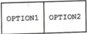

Document ID: 429
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic featuring two rectangular boxes labeled "OPTION1" and "OPTION2." The boxes are positioned side by side, with a hand icon situated below them, pointing to the left box.

**Key Features:**

* **Rectangular Boxes:**
	+ Two boxes are displayed, one on the left and one on the right.
	+ Each box has a solid black border.
	+ The boxes are separated by a thin vertical line.
* **Text Labels:**
	+ The left box is labeled "OPTION1."
	+ The right box is labeled "OPTION2."
	+ The text is centered within each box.
* **Hand Icon:**
	+ A hand icon is located below the boxes.
	+ The hand is pointing to the left box.
	+ The hand is depicted in a simple line drawing style.

**Background:**

* The background of the image is a solid white color.

**Overall:**

* The image appears to be a simple graphic design element, possibly used in a user interface or interactive system.
* The use of a hand ic

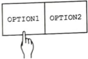

Document ID: 430
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white diagram illustrating the operation of three distinct components. These components are:

* Grease Pump: This component is responsible for lubricating the system.
* Open Door Unlock Manual: This component controls the unlocking mechanism for the door.
* Chiller Malfunction Not Disp: This component monitors the chiller's operation and alerts if it malfunctions.

**Key Features:**

* Each component is represented by a rectangular box with a thin black line border.
* The text within each box is centered and written in a clear, bold font.
* The background of the image is a plain white surface.

**Overall Impression:**

The diagram provides a straightforward and easy-to-understand representation of these three components and their functions.
Image:


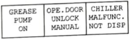

Document ID: 431
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet distinctive visual representation of the number 4. The number is displayed in an enlarged font, occupying most of the image space.

*   **Number 4**
    *   The number 4 is prominently featured in the image, using a bold and dark gray font that stands out against the white background.
    *   It is centered within the image, drawing the viewer's attention.
    *   The font size is considerable, allowing the number to dominate the visual landscape.
    *   The color choice for the number, dark gray, provides good contrast with the white background, making it easy to read and understand.

In summary, the image effectively communicates the number 4 through its use of a large, bold font on a clean white background. The dark gray color of the number ensures high visibility, making it easy to recognize and understand at first glance.
Image:


Document ID: 432
Source: /content/man1_merged.pdf
Content:
The image is a close-up of a person's thumb against a white background. 

* The thumb is positioned in the center of the image, with the tip pointing towards the top-right corner.
	+ The thumbnail is rounded and smooth, with a slight curve at the tip.
	+ The skin tone of the thumbnail is a medium brown color.
* The background of the image is solid white, providing a clean and neutral backdrop for the thumbnail.
	+ There are no other objects or features visible in the image, allowing the focus to remain on the thumbnail.
* Overall, the image appears to be a simple yet effective way to showcase the thumbnail, possibly for use in a medical or educational context.
Image:


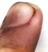

Document ID: 433
Source: /content/man1_merged.pdf
Content:
The image presents a simple, monochrome graphic featuring three white boxes with black text and a hand icon. The boxes are arranged horizontally, with the first box on the left containing the text "GREASE PUMP ON" and a hand icon pointing to it. The second box reads "OPE. DOOR UNLOCK MANUAL", while the third box displays "CHILLER MALFUNC. NOT DISP".

**Key Features:**

* **Boxes:** Three white boxes with black text and a hand icon.
* **Text:** Each box contains a specific message:
	+ First box: "GREASE PUMP ON"
	+ Second box: "OPE. DOOR UNLOCK MANUAL"
	+ Third box: "CHILLER MALFUNC. NOT DISP"
* **Hand Icon:** A hand icon is placed next to the first box, pointing towards it.
* **Background:** The background of the image is a solid light gray color.

**Overall Impression:**

The image appears to be a simple graphic used for instructional or instructional purposes, possibly in a technical or industrial setting. The use of a hand i

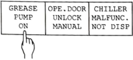

Document ID: 434
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark at its center and the word "CAUTION" written below it. The purpose of this image is to convey a sense of alertness or danger, likely in a context where attention needs to be drawn to a potential hazard.

* A triangle:
	+ The triangle is centered in the image.
	+ It has a black outline and a white interior.
	+ The triangle is equilateral, with all sides being equal in length.
* An exclamation mark:
	+ The exclamation mark is located at the center of the triangle.
	+ It is also black in color.
	+ The exclamation mark is the most prominent feature of the image, drawing immediate attention to itself.
* The word "CAUTION":
	+ The word "CAUTION" is written in black text below the triangle.
	+ It is aligned with the bottom edge of the triangle.
	+ The font used for the word "CAUTION" is simple and easy to read.

Overall, the image effectively conveys a se

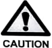

Document ID: 435
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with the text "REGULAR INSPECTION" and the number "4" inside it. The purpose of this image is to convey information about regular inspections, likely in a professional or technical context.

* The text "REGULAR INSPECTION" is written in a simple, sans-serif font and is left-aligned within the box.
	+ The word "REGULAR" is in a larger font size than "INSPECTION".
	+ The text is in a dark gray color.
* The number "4" is displayed in a larger font size than the text and is centered within the box.
	+ The number is also in a dark gray color.
* The box itself is a light gray color with a thin, dark gray border.
	+ The box has a slight shadow effect, giving it a 3D appearance.

Overall, the image effectively conveys a sense of professionalism and technicality, suggesting that it may be used in a setting such as a laboratory, workshop, or construction site. The use of a simple, easy-to-read

Document ID: 436
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a mechanical device, accompanied by text that provides instructions on its operation. The diagram is set against a white background.

*   The diagram features a black line drawing of a mechanical device, comprising various components such as gears, levers, and a shaft.
    *   The device is depicted in a side view, with the front facing left.
    *   A lever is shown on the right side of the device, with an arrow pointing to it labeled "Loosen".
    *   On the left side of the device, another lever is illustrated, accompanied by an arrow pointing to it labeled "Tighten".
*   In the bottom-right corner of the image, the text "D311M0011" is displayed in small black font.
*   A thin black border surrounds the entire image, with a small portion of illegible text visible in the top-left corner.

In summary, the image provides a detailed illustration of a mechanical device, complete with inst

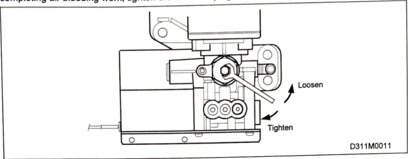

Document ID: 437
Source: /content/man1_merged.pdf
Content:
The image displays a single number, four, in large black font on a white background with a gray border. The number is centered in the image and is slightly blurry, giving it a soft appearance.

* The number "4" is written in large black font.
	+ It is centered in the image.
	+ It is slightly blurry, giving it a soft appearance.
* The background of the image is white.
	+ It provides a clean and simple contrast to the black number.
* The border of the image is gray.
	+ It adds a subtle frame to the image.
	+ It helps to separate the image from the surrounding environment.

Overall, the image is a simple yet effective display of the number four. The use of a large font and a white background makes the number stand out, while the gray border adds a touch of sophistication.
Image:


Document ID: 438
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, characterized by a triangle with an exclamation mark inside and the word "WARNING" written below it. The purpose of this image is to convey a sense of caution or danger.

* A triangle:
	+ The triangle is equilateral.
	+ It has a thick black outline.
	+ The triangle is filled with white.
* An exclamation mark:
	+ The exclamation mark is located inside the triangle.
	+ It is centered within the triangle.
	+ The exclamation mark is also black.
* The word "WARNING":
	+ The word "WARNING" is written in all capital letters.
	+ It is positioned directly below the triangle.
	+ The text is in a plain, sans-serif font.

The image effectively conveys a warning message through its simple yet attention-grabbing design. The use of a triangle and an exclamation mark creates a clear visual cue for the viewer to take notice of the warning.
Image:


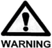

Document ID: 439
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated icon of a thumbs-up symbol within a square with rounded corners. The icon is centered in the square and appears to be a black outline of a hand with the thumb up. The background of the image is white, and there is a gray border around the square that contains the icon. The overall effect is one of simplicity and minimalism, with clean lines and a bold, graphic design. The image appears to be a digital graphic or icon, possibly used in a user interface or web design context. It conveys a sense of approval or agreement, suggesting that the user has made a decision or taken action.
Image:


Document ID: 440
Source: /content/man1_merged.pdf
Content:
The image presents a blurry, pixelated graphic of two rectangular shapes with arrows.

* A blurry, pixelated graphic of two rectangular shapes with arrows:
	+ The rectangles are positioned side by side.
	+ The arrows are pointing to the right.
* The rectangles are positioned side by side:
	+ They are aligned horizontally.
	+ There is a small gap between them.
* The arrows are pointing to the right:
	+ They are black in color.
	+ They are positioned at the top-right corner of each rectangle.
* The rectangles are blurry and pixelated:
	+ The edges are indistinct.
	+ The interior is filled with a dark gray color.
* The background is white:
	+ It provides a clean and simple backdrop for the rectangles and arrows.

In summary, the image features two rectangular shapes with arrows pointing to the right, set against a white background. The rectangles are blurry and pixelated, with a small gap between them. The arrows are black and pos

Document ID: 441
Source: /content/man1_merged.pdf
Content:
The image is a black and white photograph of a large machine with a sign that reads "Apply lubricating oil here". The purpose of the image is to instruct someone on where to apply lubricating oil to the machine.

* A sign that says "Apply lubricating oil here"
	+ The sign is rectangular in shape
	+ It has a white background with black text
	+ It is attached to a metal beam above the machine's gears
* A large machine with many gears and cogs
	+ The machine is made up of various metal components
	+ It has several large gears and cogs that are interconnected
	+ The machine appears to be complex and intricate in design
* A metal beam supporting the machine
	+ The beam is sturdy and robust
	+ It is attached to the machine at multiple points
	+ It provides structural support to the machine

The image provides clear instructions on where to apply lubricating oil to the machine, and it also gives a glimpse into the complex design and s

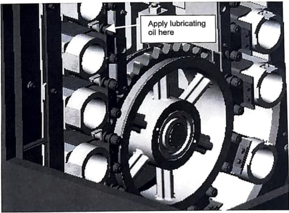

Document ID: 442
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the words "REGULAR INSPECTION" and a number 4.

* The text box is rectangular, with a thin black border.
	+ The text inside the box is in all capital letters.
	+ The text reads "REGULAR INSPECTION".
	+ To the right of the text, there is a smaller square box with a thin black border.
	+ Inside this smaller box, the number 4 is displayed in large font.
* The background of the image is white.

The image appears to be a label or indicator for a regular inspection, possibly in a medical or industrial setting. The use of a simple text box and bold font suggests that the image is intended to be easy to read and understand at a glance.
Image:


Document ID: 443
Source: /content/man1_merged.pdf
Content:
The image presents a technical illustration of a mechanical component, accompanied by instructions for lubricating oil application. The diagram is divided into two sections, each featuring a distinct view of the component.

* **Left Section:**
	+ A detailed drawing of the mechanical component is displayed.
	+ The component is depicted in a complex configuration, with various parts labeled.
	+ A callout indicates the area where lubricating oil should be applied.
* **Right Section:**
	+ A side view of the component is shown, highlighting its internal structure.
	+ A second callout points to the location where lubricating oil should be applied.
* **Bottom-Right Corner:**
	+ The text "MC111-00802" is printed, likely representing a part number or identifier.

In summary, the image provides a detailed illustration of a mechanical component, complete with instructions for lubricating oil application. The diagram's dual views offer a c

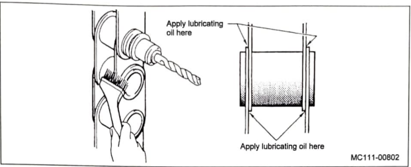

Document ID: 444
Source: /content/man1_merged.pdf
Content:
The image depicts a blurry, low-resolution icon of a rounded rectangle with a curved line inside it, set against a white background. The icon is surrounded by a thin black border, which is slightly thicker at the corners. The curved line within the icon is also black and appears to be a stylized representation of a circle or an oval shape.

The overall effect of the image is one of simplicity and minimalism, with clean lines and a limited color palette. The use of a rounded rectangle and a curved line creates a sense of softness and fluidity, while the bold black lines provide contrast and definition. Despite the blurriness of the image, the icon's basic shape and design elements are still discernible, making it clear that it is intended to represent some kind of object or concept.
Image:


Document ID: 445
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated representation of a rectangular object with two dark rectangles inside it. The object is centered in the image and has a light gray background.

Here are the details of the image:

* **Object:**
	+ Shape: Rectangular
	+ Color: Light gray
	+ Position: Centered in the image
* **Dark Rectangles:**
	+ Number: 2
	+ Position: Inside the rectangular object
	+ Color: Dark gray or black
	+ Size: Roughly equal in size
	+ Orientation: Horizontal
* **Background:**
	+ Color: Light gray
	+ Pattern: No pattern or texture visible

In summary, the image depicts a simple, rectangular object with two dark rectangles inside it, set against a light gray background. The overall effect is one of simplicity and minimalism.
Image:


Document ID: 446
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "REGULAR INSPECTION" accompanied by a number 4 in a box. The purpose of this image is likely to indicate that it is a regular inspection, possibly in a professional or business setting.

Here are the key features of the image:

* **Number 4 in a box**: 
	+ The number 4 is enclosed in a small white box.
	+ The box has a thin black border.
	+ The number is centered within the box.
* **Text "REGULAR INSPECTION"**:
	+ The text is written in a simple, black font.
	+ It is positioned below the number 4 and the box.
	+ The text is centered on the page.

Overall, the image effectively conveys a sense of organization and attention to detail, with the number 4 and accompanying text suggesting a systematic approach to inspections.
Image:


Document ID: 447
Source: /content/man1_merged.pdf
Content:
The image presents a warning symbol, comprising a triangle with an exclamation mark inside it. The text "WARNING" is positioned below the triangle.

* The triangle is outlined in black and has its apex pointing upwards.
	+ The triangle is equilateral, with all sides being equal in length.
	+ The triangle is centered in the image.
* The exclamation mark is located inside the triangle, centered within it.
	+ The exclamation mark is also black.
	+ It is positioned directly below the apex of the triangle.
* The word "WARNING" is written in black text below the triangle.
	+ The text is in all capital letters.
	+ The text is aligned to the left of the image.

In summary, the image displays a warning symbol consisting of a triangle with an exclamation mark inside it, accompanied by the text "WARNING" in black font below the triangle.
Image:


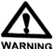

Document ID: 448
Source: /content/man1_merged.pdf
Content:
The image depicts a warning sign with the word "CAUTION" written below it. The sign is a triangle with an exclamation mark inside, and the word "CAUTION" is written in all capital letters.

*   **Triangle Warning Sign:**
    *   The triangle is centered in the image.
    *   It has a thick black outline.
    *   Inside the triangle, there is a black exclamation mark.
    *   The triangle is filled with a light gray color.
*   **Word "CAUTION":**
    *   The word "CAUTION" is written in all capital letters.
    *   It is placed below the triangle warning sign.
    *   The text color is also black.

The image effectively conveys a sense of warning or caution, as indicated by the triangle warning sign and the word "CAUTION" written below it. The use of a triangle with an exclamation mark inside is a common symbol for warning or caution, and the placement of the word "CAUTION" below the sign reinforces this message. Overall, the im

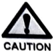

Document ID: 449
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of an ATC unit, accompanied by labels and arrows that identify its various components. The purpose of the image is to provide a clear understanding of the ATC unit's structure and organization.

* ATC arm:
	+ Located on the left side of the unit
	+ Connected to the grease supply port
	+ Has a small circle at its end
* Grease supply port:
	+ Located at the bottom of the unit
	+ Connected to the ATC arm
	+ Has a small circle at its center
* ATC unit:
	+ Central component of the drawing
	+ Has a rectangular shape with a curved top
	+ Features several small circles and lines indicating connections and attachments
* Grease supply port:
	+ Located at the bottom of the unit
	+ Connected to the ATC arm
	+ Has a small circle at its center

The image provides a detailed view of the ATC unit's components and their relationships, allowing for a deeper understanding of its design and functionality. The

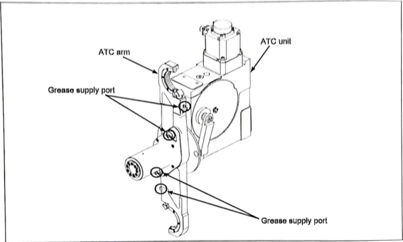

Document ID: 450
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram illustrating the process of pulling a component out of a machine, comprising two distinct sections.

**Section 1:**

* A black-and-white line drawing depicts a rectangular box with an "IN" label positioned on the left side.
* Within the box, a smaller rectangle is visible, featuring a series of vertical lines and a horizontal line at the bottom.
* A small arrow points downwards from the top of the box, indicating the direction of the pull.

**Section 2:**

* A second black-and-white line drawing is situated on the right side of the image, labeled "PULL".
* This section also features a rectangular box, containing a similar smaller rectangle with vertical lines and a horizontal line at the bottom.
* An arrow points upwards from the top of the box, indicating the direction of the pull.

The diagram effectively conveys the action of pulling a component out of a machine, providing a clear visua

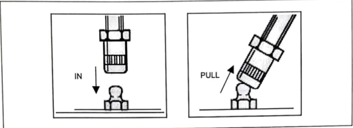

Document ID: 451
Source: /content/man1_merged.pdf
Content:
The image depicts a black and white diagram of a technical drawing, featuring a large X in the center. The diagram is set against a white background with a thin black border.

**Diagram Description:**

* The diagram consists of two rectangular shapes, one on the left and one on the right, connected by a horizontal line.
* A vertical line extends from the top of the left rectangle to the bottom of the right rectangle, forming an "X" shape.
* The left rectangle contains a smaller rectangle with a jagged edge, accompanied by a series of lines and shapes.
* An arrow points to the right, indicating the direction of movement or flow.

**Key Features:**

* The large X in the center of the diagram serves as a prominent feature, potentially representing a warning or cautionary symbol.
* The technical drawing style suggests a focus on precision and accuracy, likely for engineering or architectural purposes.
* The use of black and white c

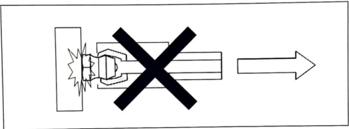

Document ID: 452
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "REGULAR INSPECTION" and a number "4" enclosed in a box. The purpose of this image is likely to serve as a label or identifier for a specific category or process.

* The text "REGULAR INSPECTION" is prominently displayed in the center of the image.
	+ Font: The font used for the text is plain and easy to read.
	+ Size: The text is moderately large, making it easily visible.
	+ Color: The text is black, providing good contrast against the white background.
* A box surrounds the number "4", indicating that it is a separate entity from the text.
	+ Shape: The box is a square with a thin black outline.
	+ Size: The box is relatively small compared to the text.
	+ Position: The box is positioned to the right of the text, aligned with the top edge.
* The background of the image is white, providing a clean and neutral backdrop for the text and box.
	+ Color: The backgr

Document ID: 453
Source: /content/man1_merged.pdf
Content:
The image presents a simple, text-based graphic with the title "REGULAR INSPECTION" accompanied by a numerical label. The graphic is designed to be easily readable and unobtrusive.

*   **Number 4 in a square**
    *   Located in the top-left corner of the image
    *   Enclosed in a small square with a thin black border
    *   The number 4 is displayed in a large, bold font within the square
*   **Text "REGULAR INSPECTION"**
    *   Positioned below the square containing the number 4
    *   Written in a clear, medium-sized font
    *   Centered horizontally within the image

In summary, the image features a straightforward design with a prominent numerical label and corresponding text, likely intended for use in a technical or instructional context.
Image:


Document ID: 454
Source: /content/man1_merged.pdf
Content:
The image depicts a warning sign, which is typically used to alert individuals of potential hazards or dangers. The sign consists of:

*   **Triangle**: The sign is shaped like an equilateral triangle, with a solid black outline and a white interior.
*   **Exclamation Mark**: Inside the triangle, there is a black exclamation mark, which is a common symbol used to indicate warning or alertness.
*   **Text**: Below the triangle, the word "WARNING" is written in large black letters, emphasizing the importance of the warning being conveyed.

Overall, the image effectively conveys a sense of caution and alertness, making it clear that the viewer should be aware of potential risks or dangers.
Image:


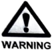

Document ID: 455
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a compound oil control unit, likely used in industrial or manufacturing settings. The drawing is rendered in black lines on a white background, with no additional color or shading.

*   **Title and Label**
    *   The title "Compound oil control unit" is displayed in small black text at the top right corner of the image.
    *   A thin black line extends from the title to a point on the drawing, indicating the location of the compound oil control unit.
*   **Drawing**
    *   The drawing depicts a large, rectangular-shaped device with various components and features.
    *   The device has a flat top surface and a rounded front panel.
    *   Several pipes and tubes are visible, connecting different parts of the device.
    *   A circular component is situated near the center of the device, accompanied by a series of rectangular boxes and other shapes.
    *   The drawing also includes 

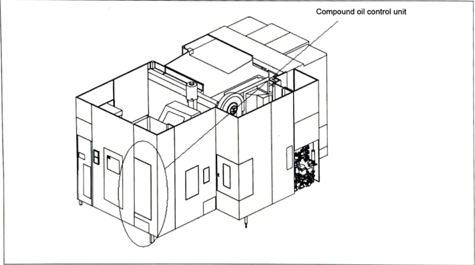

Document ID: 456
Source: /content/man1_merged.pdf
Content:
The image depicts a warning sign, featuring a black triangle with an exclamation mark inside.

* The triangle is outlined in black and has a white interior.
	+ The triangle is centered in the image and points downwards.
	+ The exclamation mark is positioned within the triangle, aligned with its center.
* The background of the image is plain white.
	+ There are no other objects or markings present in the image.

In summary, the image shows a simple warning sign with a black triangle and exclamation mark on a white background.
Image:


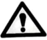

Document ID: 457
Source: /content/man1_merged.pdf
Content:
The image is a warning sign with the word "CAUTION" written below it. The sign is a black triangle with an exclamation mark inside, and the text is in all capital letters.

*   The warning sign is a black triangle with an exclamation mark inside.
    *   The triangle is a standard warning symbol.
    *   The exclamation mark is a common indicator of caution or warning.
*   The word "CAUTION" is written in all capital letters below the sign.
    *   The text is in a simple font.
    *   The text is centered below the sign.

The image is a clear warning sign indicating caution.
Image:


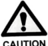

Document ID: 458
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a machine component, with labels and arrows indicating various parts. The diagram is in black and white, providing a clear visual representation of the component's structure.

**Component Description:**

*   **Main Body:**
    *   The main body of the component is a large, circular shape with a flat top and bottom.
    *   It has several small holes and openings on its surface, likely for mounting or connecting other parts.
*   **Oil Fitter Port:**
    *   Located on the left side of the component, near the bottom.
    *   This port is used to connect the component to an oil supply system.
*   **Oil Level Gauge:**
    *   Situated on the front of the component, below the oil fitter port.
    *   This gauge is used to monitor the oil level within the component.
*   **Drain Port:**
    *   Positioned on the right side of the component, near the bottom.
    *   This port is used to drain e

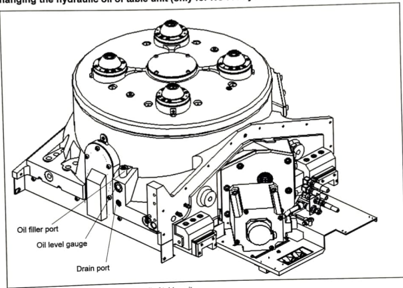

Document ID: 459
Source: /content/man1_merged.pdf
Content:
The image displays a simple text and symbol graphic with the words "REGULAR INSPECTION" and a square containing the number 4.

At the top of the image, the words "REGULAR INSPECTION" are written in black sans serif text. The text is centered horizontally on the image and left-justified. 

In the upper right-hand corner of the image, there is a square outline with a thin black border. Within the square, the number 4 is written in black sans serif text and centered horizontally. The square is positioned slightly above the text "REGULAR INSPECTION".

The background of the image is solid white color.
Image:


Document ID: 460
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated number 4 in a box. 

* The number 4 is in the center of the image.
	+ It is written in a large, gray font.
	+ The font is bold and sans-serif.
* The number 4 is inside a box.
	+ The box is rectangular with a thin gray border.
	+ The box is centered in the image.
* The background of the image is white.
	+ There is a slight shadow effect around the edges of the image.

The image appears to be a simple graphic design element, possibly used as a placeholder or icon.
Image:


Document ID: 461
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, comprising a triangle with an exclamation mark inside and the word "WARNING" below it. The triangle is outlined in black, with a white interior that contains a black exclamation mark. The word "WARNING" is written in bold, black letters directly beneath the triangle.

**Key Features:**

* **Triangle:** The triangle is outlined in black, with a white interior.
* **Exclamation Mark:** A black exclamation mark is situated inside the triangle.
* **Text:** The word "WARNING" is written in bold, black letters below the triangle.
* **Background:** The background of the image is white.

**Overall Impression:**

The image effectively conveys a sense of caution or alarm, making it suitable for use in various contexts where attention needs to be drawn to potential hazards or risks.
Image:


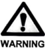

Document ID: 462
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "WARNING" below it. The sign is set against a white background.

*   **Triangle:**
    *   The triangle is the central element of the warning sign.
    *   It is a black triangle with a solid black outline.
    *   The triangle is equilateral, with all three sides being equal in length.
    *   Inside the triangle, there is a black exclamation mark.
*   **Exclamation Mark:**
    *   The exclamation mark is a standard punctuation symbol.
    *   It is centered within the triangle.
    *   The exclamation mark is black in color.
*   **Text:**
    *   Below the triangle, the word "WARNING" is written in all capital letters.
    *   The text is also black in color.
    *   The font used for the text is simple and easy to read.
*   **Background:**
    *   The background of the image is white.
    *   The white background provides goo

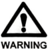

Document ID: 463
Source: /content/man1_merged.pdf
Content:
The image presents a simple, text-based graphic with the words "REGULAR INSPECTION" prominently displayed in black font against a white background. The text is centered horizontally and vertically within the image.

Here are the key elements of the image:

* **Text**
	+ Font: Black
	+ Alignment: Centered horizontally and vertically
	+ Text: "REGULAR INSPECTION"
* **Background**
	+ Color: White
* **Rectangle**
	+ Color: Black
	+ Thickness: Thin
	+ Position: Top-right corner of the image
	+ Number: 4

In summary, the image features a straightforward design with the phrase "REGULAR INSPECTION" in black text against a white background, accompanied by a thin black rectangle in the top-right corner containing the number 4.
Image:


Document ID: 464
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a machine part, with a focus on the magazine chain tension adjusting section. The diagram is rendered in black and white, providing a clear and concise visual representation of the component.

*   **Machine Part Diagram**
    *   The diagram showcases a machine part with a prominent magazine chain tension adjusting section.
    *   The part is depicted in a vertical orientation, with the magazine chain tension adjusting section situated at the center.
    *   The diagram is presented in black and white, which enhances visibility and clarity.
*   **Magazine Chain Tension Adjusting Section**
    *   The magazine chain tension adjusting section is highlighted as the central feature of the machine part.
    *   The section appears to be a critical component, responsible for regulating the tension within the magazine chain.
    *   The diagram provides a detailed view of the section's design

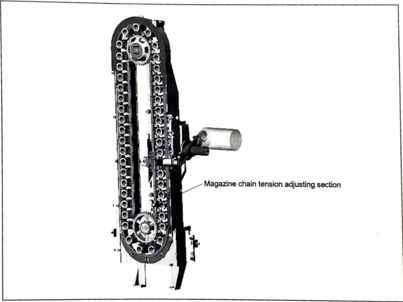

Document ID: 465
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "REGULAR INSPECTION" and the number "4" enclosed in a square.

* The text "REGULAR INSPECTION" is displayed prominently in the center of the image.
	+ It is written in a clear, easy-to-read font.
	+ The text is likely used to indicate that a regular inspection is required or recommended.
* A square with a number "4" inside it is situated in the top-left corner of the image.
	+ The square has a thin border and is positioned at an angle, pointing towards the right side of the image.
	+ The number "4" is centered within the square, making it easily visible.

In summary, the image features a straightforward design with the text "REGULAR INSPECTION" and the number "4" enclosed in a square, likely used to convey important information or instructions.
Image:


Document ID: 466
Source: /content/man1_merged.pdf
Content:
The image depicts a technical drawing of an industrial machine, likely used in manufacturing or production. The machine is shown in a top-down view, with its components and mechanisms visible.

*   **Machine Frame:**
    *   The machine's frame is rectangular in shape, with a flat top and bottom.
    *   It has a series of circular holes along its edges, which may be used for mounting or attaching other components.
    *   The frame is supported by four legs, two at the front and two at the back, which provide stability and balance.
*   **Rotary Components:**
    *   There are several rotary components visible on the machine, including gears, pulleys, and sprockets.
    *   These components are arranged in a specific pattern, with some connected to each other by shafts or belts.
    *   The rotary components appear to be driven by motors or other power sources, although these are not visible in the image.
*   **Belts and Chains

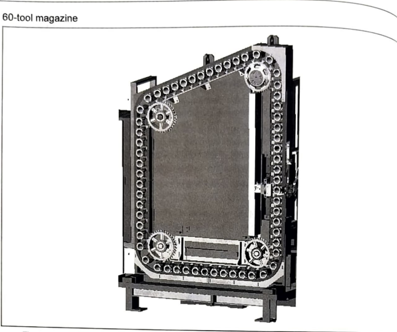

Document ID: 467
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a machine component, specifically a magazine chain tension adjusting section. The drawing is rendered in black and white, with the text and lines providing a clear visual representation of the component's design.

* **Main Component:**
	+ A large, rectangular shape with rounded corners
	+ Featuring a series of interconnected gears and chains
	+ The gears are positioned at various points along the chain, with some overlapping or overlapping partially
	+ The chain is depicted as a series of links connected by small circles
* **Gears:**
	+ Several gears are visible within the main component
	+ They vary in size, with some being larger than others
	+ Each gear has a distinct shape, with some featuring teeth and others appearing smooth
	+ Some gears are positioned on top of one another, while others are separated by small gaps
* **Chains:**
	+ The chain is a prominent feature of the main com

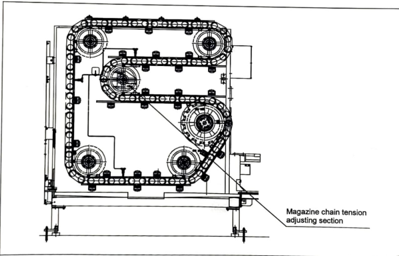

Document ID: 468
Source: /content/man1_merged.pdf
Content:
The image is a simple, blurry number four in black text on a white background. The number is centered in the image and is written in a large, bold font. It is slightly blurry, giving it a soft and pixelated appearance.

* A number 4:
	+ The number is centered in the image.
	+ It is written in a large, bold font.
	+ It is slightly blurry, giving it a soft and pixelated appearance.
* A white background:
	+ The background is a plain white color.
	+ It provides a clean and simple contrast to the dark number.
* A gray border:
	+ The border is a thin, dark gray color.
	+ It surrounds the white background and adds a subtle frame to the image.

The image is a simple and straightforward representation of the number four. The use of a bold font and a plain white background makes the number stand out, while the gray border adds a touch of sophistication.
Image:


Document ID: 469
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a machine, with a focus on the magazine chain tension adjusting section. The diagram is rendered in black and white, providing a clear visual representation of the machine's components and their relationships.

*   **Machine Diagram**
    *   The diagram showcases a complex machine with various components, including gears, chains, and other mechanical parts.
    *   The machine appears to be designed for industrial or manufacturing applications, possibly related to material handling or processing.
    *   The diagram provides a detailed view of the machine's internal mechanisms, highlighting the intricate connections between its components.
*   **Magazine Chain Tension Adjusting Section**
    *   A prominent label in the lower-right corner of the diagram identifies the magazine chain tension adjusting section.
    *   This section is likely responsible for regulating the tension of the 

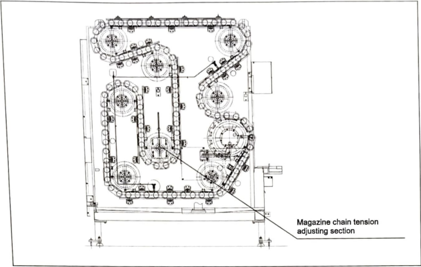

Document ID: 470
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a machine, showcasing its various components and mechanisms. The diagram is drawn in black and white, with a focus on precision and clarity.

*   **Machine Diagram:**
    *   The diagram depicts a complex machine with multiple parts, including gears, chains, and other mechanical components.
    *   The machine appears to be designed for industrial or manufacturing purposes, with a focus on efficiency and productivity.
    *   The diagram provides a comprehensive view of the machine's internal workings, allowing users to understand its operation and potential areas for improvement.
*   **Key Components:**
    *   **Gears:** The machine features several gears, which are connected by chains or other mechanical linkages.
    *   **Chains:** The chains are used to transmit power and motion between different parts of the machine.
    *   **Mechanical Components:** The diagram includes various 

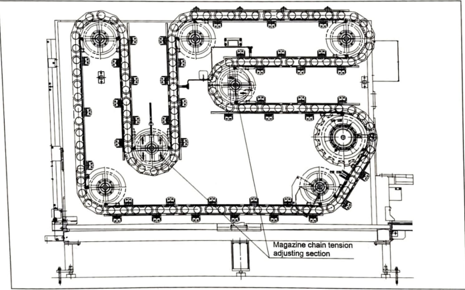

Document ID: 471
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a thick black border, containing the number 4 in its center. The box is positioned within a larger white rectangle, which serves as the background of the image.

*   The number 4 is prominently displayed in the center of the box, with a thick black border surrounding it.
*   The box itself is contained within a larger white rectangle, which provides a clean and neutral background for the image.
*   The overall design of the image is minimalist and straightforward, with no additional elements or embellishments present.

In summary, the image features a straightforward and unadorned representation of the number 4, set against a plain white background.
Image:


Document ID: 472
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a machine, with the title "Pro tool Magazine" situated at the top left corner. The purpose of the image is to provide a detailed illustration of the machine's components and their relationships.

Here are the key features of the image:

* A diagram of a machine:
	+ The machine is depicted in a 2D representation, with various parts and components labeled.
	+ The diagram shows the machine's layout, including the location of gears, chains, and other mechanical elements.
* The machine is made up of several components, including:
	+ Gears: The diagram shows multiple gears of varying sizes, which are likely connected to perform a specific function.
	+ Chains: The machine features several chains that transmit motion between different parts of the system.
	+ Other mechanical elements: The diagram includes various other mechanical components, such as sprockets and pulleys, which are likely used 

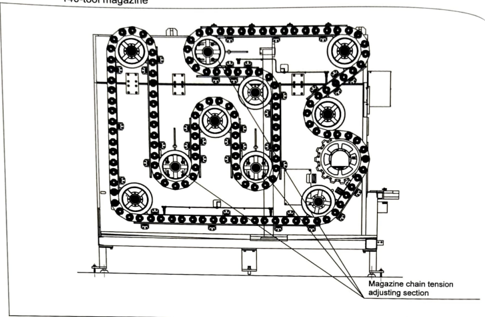

Document ID: 473
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a machine component, showcasing its intricate design and various parts. The title "Magazine chain tension adjusting section" is prominently displayed in the bottom-right corner, providing context for the component's function.

Here are the key features of the image:

* **Machine Component:**
	+ The component is composed of multiple interconnected gears, sprockets, and chains.
	+ The gears and sprockets are arranged in a specific pattern, with some being larger than others.
	+ The chains connect the gears and sprockets, forming a complex network.
* **Magazine Chain Tension Adjusting Section:**
	+ This section is highlighted in the bottom-right corner of the image.
	+ It appears to be a critical component of the machine, responsible for adjusting the tension of the magazine chain.
	+ The section is labeled with a small box containing the text "Magazine chain tension adjusting section".
* 

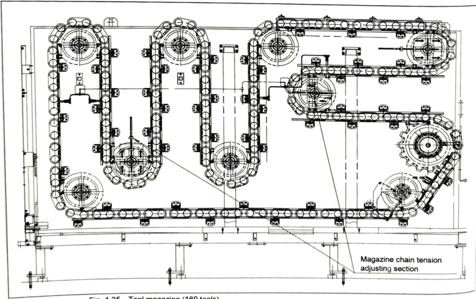

Document ID: 474
Source: /content/man1_merged.pdf
Content:
The image presents a simple, white square with the text "REGULAR INSPECTION" in black font on the left side, accompanied by a number "4" in a smaller black font within a white square on the right side. The background of the image is a clean white.

*   **Text:**
    *   The text "REGULAR INSPECTION" is displayed in black font on the left side of the image.
    *   It is positioned horizontally and takes up approximately 60% of the image's width.
*   **Number:**
    *   A number "4" is shown in a smaller black font within a white square on the right side of the image.
    *   The square containing the number is approximately 20% of the image's width and is positioned vertically.
*   **Background:**
    *   The background of the image is a solid white color.

In summary, the image features a straightforward design with clear text and a prominent number, set against a plain white background.
Image:


Document ID: 475
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a machine component, accompanied by labels and arrows to facilitate understanding. The diagram is divided into three sections, each providing a distinct perspective on the component's structure.

*   **Left Section:**
    *   A three-dimensional view of the machine component is displayed.
    *   The component features a rectangular box-like shape with various protrusions and recesses.
    *   A circular opening is visible on the front side of the box.
*   **Middle Section:**
    *   A top-down view of the component is shown.
    *   The top view reveals a series of small holes and slots along the edges of the component.
    *   A large circular opening is centered on the top surface.
*   **Right Section:**
    *   A cross-sectional view of the component is illustrated.
    *   The cross-section highlights the internal structure of the component.
    *   Several small components, includ

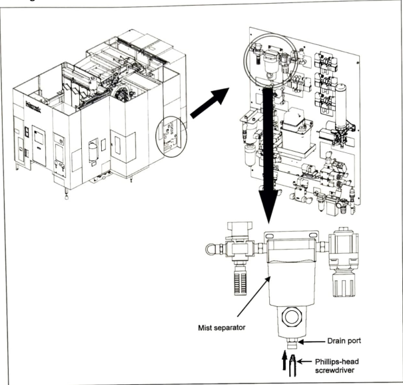

Document ID: 476
Source: /content/man1_merged.pdf
Content:
The image is a simple, rectangular box with a number 4 inside it. The box is outlined in gray, and the number 4 is also in gray. The background of the image is white.

*   The image is a simple, rectangular box with a number 4 inside it.
    *   The box is outlined in gray.
    *   The number 4 is also in gray.
    *   The background of the image is white.
*   The image is blurry, making it difficult to read.
    *   The text is not clear, but it appears to be the number 4.

The image is a simple, rectangular box with a number 4 inside it. The box is outlined in gray, and the number 4 is also in gray. The background of the image is white. The image is blurry, making it difficult to read. The text is not clear, but it appears to be the number 4.
Image:


Document ID: 477
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white warning sign featuring a triangle with an exclamation mark inside. The triangle is depicted in a solid black outline, with its apex pointing upwards and its base forming a horizontal line. Within the triangle, a black exclamation mark is centered, accompanied by a small black circle below it.

**Key Features:**

* **Triangle Shape:** The triangle is outlined in solid black, with a horizontal base and an apex pointing upwards.
* **Exclamation Mark:** A black exclamation mark is positioned centrally within the triangle.
* **Circle:** A small black circle is located below the exclamation mark.
* **Background:** The background of the image is a plain white surface.

**Overall Impression:**

The image appears to be a simple, low-resolution graphic of a warning sign. The use of a solid black outline and a plain white background creates a clean and minimalist aesthetic. The inclusion of the

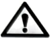

Document ID: 478
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a wiper system, showcasing its various components and their relationships. The diagram is titled "Wiper System" and features a black-and-white line drawing of the system's components.

**Components:**

*   **Wiper A**
    *   X-axis way cover wiper set
*   **Wiper B**
    *   Z-axis way cover wiper set
*   **Wiper C**
    *   Z-axis way cover wiper set

**Key Features:**

*   The diagram highlights the different types of wipers used in the system, including X-axis and Z-axis way cover wipers.
*   The wipers are labeled with arrows indicating their direction of movement.
*   The diagram also shows the various components of the wiper system, such as the wiper arms and the wiper covers.

**Conclusion:**

The diagram provides a clear and detailed representation of the wiper system, allowing viewers to understand the different components and their functions. The use of labels and arrows helps

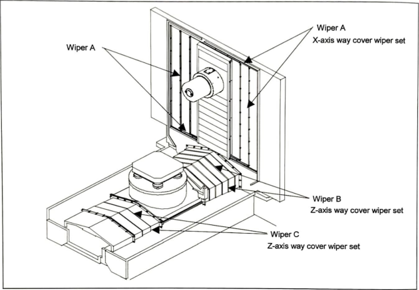

Document ID: 479
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "WARNING" below it.

*   The triangle is outlined in black and filled with a light gray color, creating a striking contrast.
*   Inside the triangle, a black exclamation mark is prominently displayed, drawing attention to the warning.
*   Below the triangle, the word "WARNING" is written in large, bold, black letters, emphasizing the importance of the message.
*   The background of the image is a clean white, providing a clear and unobstructed view of the warning sign.

In summary, the image effectively conveys a warning message through its simple yet impactful design. The use of a triangle and exclamation mark creates a sense of urgency, while the bold font and contrasting colors ensure that the message is easily readable and understood.
Image:


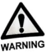

Document ID: 480
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet clear and concise visual representation of the phrase "REGULAR INSPECTION" accompanied by a number in a box. The purpose of this image appears to be instructional or informative, possibly used in a technical or professional setting.

Here are the key elements of the image:

* The text "REGULAR INSPECTION" is displayed prominently in the image.
	+ The font used for the text is plain and easy to read.
	+ The text is centered horizontally within the image.
* A number "4" is enclosed in a box.
	+ The box is small and rectangular in shape.
	+ The number "4" is displayed in a bold, sans-serif font within the box.
	+ The box is positioned to the right of the text "REGULAR INSPECTION".

In summary, the image effectively communicates a message related to regular inspections, with the number "4" potentially indicating a specific type or frequency of inspection. The use of a simple and uncluttered design m

Document ID: 481
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an unspecified device, comprising various components and labels. The diagram is divided into sections, each labeled with a specific term and accompanied by an arrow pointing to the corresponding part of the device.

*   **Side cover**
    *   Located on the top left side of the diagram
    *   Labeled as "Side cover"
    *   Arrow pointing to the side cover
*   **Machine rear cover**
    *   Positioned on the bottom left side of the diagram
    *   Labeled as "Machine rear cover"
    *   Arrow pointing to the machine rear cover
*   **Supporting points**
    *   Situated on the bottom right side of the diagram
    *   Labeled as "Supporting points"
    *   Arrow pointing to the supporting points
*   **Y-axis way cover pantograph**
    *   Located on the top right side of the diagram
    *   Labeled as "Y-axis way cover pantograph"
    *   Arrow pointing to the Y-axis way cover pantograph

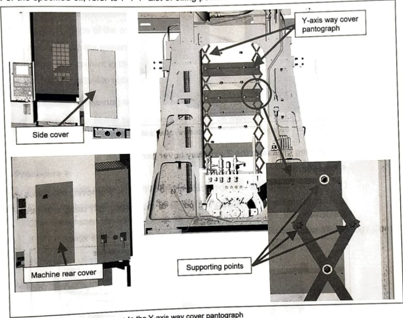

Document ID: 482
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an oil tank, accompanied by explanatory text. The diagram is titled "For the specified oil, refer to 7-1-1 'List of oiling points.'" 

*   **Title**: 
    *   The title is displayed at the top of the image in black text and reads, "For the specified oil, refer to 7-1-1 'List of oiling points.'"
*   **Diagram**:
    *   The diagram is a grayscale illustration of an oil tank, featuring a rectangular shape with a flat top and bottom.
    *   The tank has a series of vertical supports and diagonal braces, providing structural integrity.
    *   Two labels are present within the diagram:
        *   **Supporting points**: This label is situated near the top-right corner of the diagram, pointing to the vertical supports.
        *   **Pantograph**: This label is located near the center of the diagram, indicating the location of the pantograph.
*   **Background**:
    *   The background of the

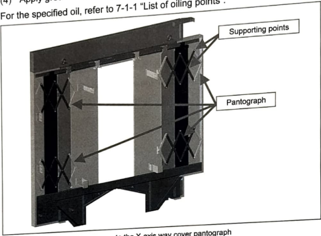

Document ID: 483
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram illustrating the components of a pallet changer and spindle side, with labels and arrows indicating the different parts. The diagram is divided into two sections: the left side depicts the pallet changer side, while the right side shows the spindle side.

*   **Pallet Changer Side:**
    *   The pallet changer side is composed of multiple layers, each featuring a pantograph and supporting points.
    *   The layers are stacked vertically, with the top layer labeled as the "Pallet changer side" and the bottom layer labeled as the "Pantograph."
    *   The supporting points are indicated by arrows, which connect the layers to a central axis.
*   **Spindle Side:**
    *   The spindle side consists of a series of spindles, each connected by a pantograph and supporting points.
    *   The spindles are arranged horizontally, with the top spindle labeled as the "Spindle side" and the bottom spind

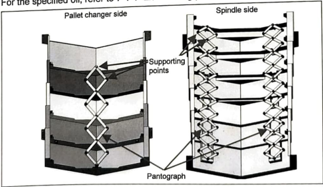

Document ID: 484
Source: /content/man1_merged.pdf
Content:
The image displays a warning sign with the word "WARNING" below it.

* The triangle is a warning sign, which is a common symbol used to alert people of potential danger or hazard.
	+ The triangle is centered in the image and has a black outline.
	+ Inside the triangle, there is an exclamation mark (!) in the center, which is also black.
* Below the triangle, the word "WARNING" is written in black text.
	+ The text is in all capital letters.
	+ It is positioned directly below the triangle, aligned with its center.

Overall, the image effectively conveys a sense of caution and alertness, as the warning sign and the word "WARNING" are clearly visible and prominent.
Image:


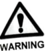

Document ID: 485
Source: /content/man1_merged.pdf
Content:
The image displays a warning symbol with the word "WARNING" underneath it. 

* The triangle is centered in the image, pointing upwards.
	+ It has a thick black border and a thinner white interior.
	+ Inside the triangle, there is a black exclamation mark.
* The word "WARNING" is written in all capital letters.
	+ It is centered below the triangle.
	+ The text is in a simple black font.

The background of the image is white.
Image:


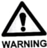

Document ID: 486
Source: /content/man1_merged.pdf
Content:
The image displays a simple text-based graphic with the words "REGULAR INSPECTION" and the number 4 in a square box. 

* The text "REGULAR INSPECTION" is written in a plain, dark gray font and is left-aligned.
	+ The text is centered horizontally within the image.
	+ The text is written on a light gray background.
* The number 4 is displayed in a small, dark gray square box.
	+ The square box is positioned to the right of the text.
	+ The number 4 is centered within the square box.

The image appears to be a simple label or indicator for a regular inspection process.
Image:


Document ID: 487
Source: /content/man1_merged.pdf
Content:
The image is a simple, rectangular box with a gray border and a white background. The box contains the number 4 in a dark gray font.

*   The box is outlined by a thin gray line that forms a rectangle.
*   The number 4 is centered inside the box.
*   The number 4 is written in a dark gray font that is slightly blurry.
*   The background of the image is white.

The image appears to be a simple graphic design element, possibly used as a placeholder or a visual indicator in a digital document or presentation.
Image:


Document ID: 488
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an oil filter port filter, accompanied by a detailed illustration of its components and connections. The diagram is set against a white background, with black text and lines used to convey the information.

**Key Elements:**

* **Oil Filter Port Filter:** A central component of the diagram, represented by a rectangular box with a cylindrical filter attached to it.
* **Connections:** Several lines connect the oil filter port filter to other parts of the system, indicating the flow of oil or other fluids.
* **Illustrations:** Two additional illustrations are included in the diagram, providing further detail on the components and their relationships.
* **Text:** The text "MC111-01235" is displayed at the bottom of the image, likely serving as a reference number or identifier for the diagram.

**Visual Representation:**

The diagram is rendered in a clear and concise manner, making it easy 

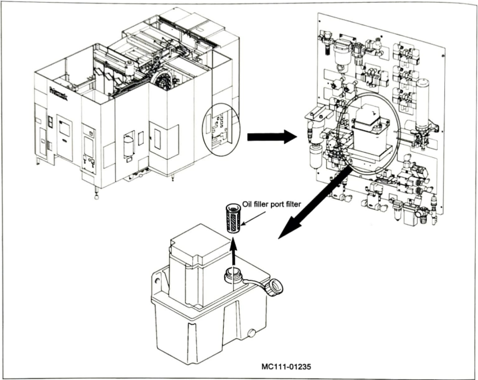

Document ID: 489
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation point inside and the word "WARNING" below it. The purpose of this image is to convey a sense of caution or alertness.

* A triangle with an exclamation point inside:
	+ The triangle is equilateral and has a solid black outline.
	+ The exclamation point is centered within the triangle.
	+ The triangle and exclamation point are both in black.
* The word "WARNING" is written below the triangle:
	+ The text is in all capital letters.
	+ The font is simple and sans-serif.
	+ The text is in black.

The main finding from this image is that it serves as a visual warning to alert individuals to potential hazards or dangers. There are no significant changes or comparisons to note in this image, as it is a straightforward representation of a warning sign.
Image:


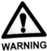

Document ID: 490
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "CAUTION" below it.

*   The triangle is outlined in black and contains a white interior.
    *   The triangle serves as the foundation for the warning sign.
    *   The white interior provides contrast to the black outline, making the symbol more visible.
*   Inside the triangle, there is a black exclamation mark.
    *   The exclamation mark is centered within the triangle.
    *   It is depicted in a bold, sans-serif font.
*   Below the triangle, the word "CAUTION" is written in black text.
    *   The text is aligned with the bottom edge of the triangle.
    *   The font used for the text is also bold and sans-serif.

In summary, the image displays a warning sign consisting of a triangle with an exclamation mark inside and the word "CAUTION" written below it. The use of a triangle and an exclamation mark creates a clear visu

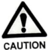

Document ID: 491
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an air cylinder and its components, with labels indicating the various parts. The diagram is drawn in black and white, with the background being a solid white color.

*   **Air Cylinder**
    *   Located at the top center of the diagram
    *   Labeled as "Air cylinder"
*   **Linear Guide**
    *   Situated on either side of the air cylinder
    *   Labeled as "Linear guide"
*   **Greasing Ports Cover**
    *   Positioned at the top and bottom of the diagram
    *   Labeled as "Linear guide greasing ports cover"
*   **ATC Door**
    *   Located at the center of the diagram
    *   Labeled as "ATC door"
*   **Linear Guide Greasing Ports Cover**
    *   Situated at the bottom center of the diagram
    *   Labeled as "Linear guide greasing ports cover"

In summary, the diagram provides a detailed illustration of the air cylinder and its components, including the linear guides, greasing por

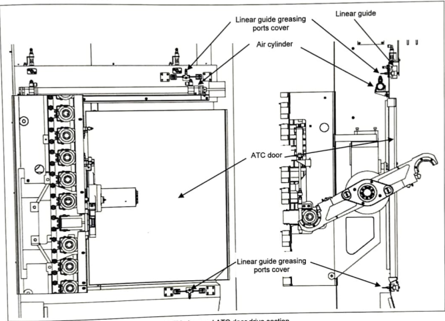

Document ID: 492
Source: /content/man1_merged.pdf
Content:
The image displays a large, blurry number 4 in the center of a white rectangle. The number is written in black and appears to be a handwritten font. The background of the image is a light gray color, with a darker gray border around the edges. The overall effect is one of simplicity and clarity, despite the blurriness of the number.
Image:


Document ID: 493
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with the number "4" prominently displayed in the center. The box is outlined by a thin gray line, providing a clear visual boundary.

Here are the key features of the image:

* **Number 4:**
	+ Located in the center of the box
	+ Rendered in a bold, dark gray font
	+ Slightly blurred at the edges, giving it a soft appearance
* **Box:**
	+ Rectangular shape with a thin gray outline
	+ Slightly transparent, allowing the background to show through
	+ Provides a clean and simple frame for the number "4"

In summary, the image features a straightforward and easy-to-read display of the number "4" within a simple rectangular box. The bold font and clear outline make the number stand out, while the transparent box adds a touch of subtlety to the overall design.
Image:


Document ID: 494
Source: /content/man1_merged.pdf
Content:
The image presents a warning symbol, comprising a triangle with an exclamation mark inside and the word "WARNING" below it. This visual representation is commonly used to convey a sense of urgency or danger.

*   **Triangle:**
    *   A triangle is depicted in the image.
    *   The triangle is black and has a white interior.
    *   It is positioned at the top center of the image.
*   **Exclamation Mark:**
    *   An exclamation mark is situated within the triangle.
    *   The exclamation mark is also black and appears within the white interior of the triangle.
    *   It is centered within the triangle.
*   **Text:**
    *   The word "WARNING" is written in black text below the triangle.
    *   The text is positioned at the bottom center of the image.
    *   The font used for the text is bold.

In summary, the image features a warning symbol consisting of a triangle with an exclamation mark inside and the word "WARNING" wr

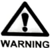

Document ID: 495
Source: /content/man1_merged.pdf
Content:
The image presents a caution sign, featuring a triangle with an exclamation mark inside and the word "CAUTION" below it. The sign is set against a white background.

*   **Triangle:**
    *   The triangle is centered in the image.
    *   It has a black outline and a white interior.
    *   Inside the triangle, there is a black exclamation mark.
*   **Exclamation Mark:**
    *   The exclamation mark is located inside the triangle.
    *   It is black in color.
*   **Word "CAUTION":**
    *   The word "CAUTION" is written in lowercase letters.
    *   It is positioned directly below the triangle.
    *   The text is black in color.
*   **Background:**
    *   The background of the image is white.

In summary, the image displays a caution sign with a triangle containing an exclamation mark and the word "CAUTION" written below it, all set against a white background.
Image:


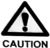

Document ID: 496
Source: /content/man1_merged.pdf
Content:
The image is a technical illustration of an ATC cylinder and grease supply port, with the title "ATC cylinder" and "Grease supply port" in black text. The purpose of the image is to provide a clear visual representation of the components and their relationship.

Here are the key elements of the image:

* **ATC cylinder:**
	+ Located at the top-left corner of the image
	+ Labeled as "ATC cylinder" in black text
	+ Has a small arrow pointing to it from the label
* **Grease supply port:**
	+ Located at the bottom-right corner of the image
	+ Labeled as "Grease supply port" in black text
	+ Has a small arrow pointing to it from the label
* **Lines connecting the components:**
	+ A thin black line connects the ATC cylinder to the grease supply port
	+ The line is labeled with an arrow pointing to the connection
* **Background:**
	+ The background of the image is a light gray color
	+ There is a darker gray border around the edges of

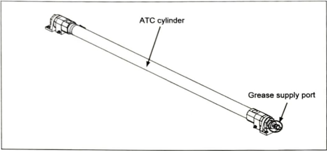

Document ID: 497
Source: /content/man1_merged.pdf
Content:
The image presents a black and white photograph of a metal component, accompanied by an enlarged detail of a black metal object in the bottom right corner. The main photo showcases a large metal component featuring a cylindrical shape at its center, which narrows towards the top. A small cylindrical protrusion is visible on the top right side of the component. The object is mounted on a metal base and secured to a metal box with a screw.

In the bottom right corner, a magnified detail of a black metal object is displayed, resembling a coil spring. The background of the main photo appears to be a grey surface, possibly a countertop or a workbench. The overall atmosphere of the image suggests that it is a technical or instructional photograph, likely used to illustrate a specific part or component in a manual or guide. The use of a black and white photograph and the presence of a magnified detail suggest a focus on technical accu

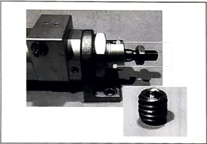

Document ID: 498
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram, likely from an instruction manual or technical document, featuring two black and white photographs accompanied by a caption.

**Photograph 1:**
The left-hand photograph depicts a metal object with a circular white component mounted on top. A black line with an arrowhead at its end is superimposed over the white object, pointing to a small circular hole in its center. The object rests on a metal diamond plate surface.

**Photograph 2:**
The right-hand photograph shows a black spray bottle with a long nozzle and a trigger on the handle. The nozzle is positioned vertically, with the bottle casting a shadow on the surface below.

**Caption:**
The caption, located to the right of the photographs, reads "Diameter: 1 to 2 mm (0.04 to 0.08 in)".

The images are set against a white background, suggesting that they are part of a technical diagram or instruction manual. The captions and photographs 

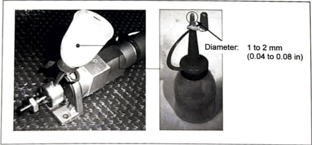

Document ID: 499
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic featuring the number "4" enclosed in a square. The number is displayed in a bold, black font, with a subtle shadow effect that gives it a sense of depth and dimensionality. The square frame surrounding the number is also black, with a thin border that adds a touch of elegance to the overall design.

The background of the image is a clean and crisp white, which provides a striking contrast to the black number and frame. This deliberate use of color creates a visually appealing and attention-grabbing effect, making the image stand out against a plain background.

Overall, the image is a well-designed and visually striking representation of the number "4", with its bold font, elegant frame, and crisp white background working together to create a cohesive and engaging visual experience.
Image:


Document ID: 500
Source: /content/man1_merged.pdf
Content:
The image presents a diagram of three circuits, labeled (a), (b), and (c), each consisting of a circle with lines and symbols inside. The purpose of the image is to illustrate the internal workings of these circuits.

* Three circuits are shown in the image:
	+ Each circuit is represented by a circle with lines and symbols inside.
	+ The circuits are labeled (a), (b), and (c).
* The circuits are labeled with letters (a), (b), and (c):
	+ The labels are placed outside the circles.
	+ Each label corresponds to a specific circuit.
* The circuits have lines and symbols inside them:
	+ The lines and symbols are internal to the circles.
	+ They appear to represent different components or connections within the circuits.
* The lines and symbols are connected to each other:
	+ The lines and symbols are interconnected within each circuit.
	+ This suggests a flow of some kind, possibly electrical or signal-based.

The main finding from t

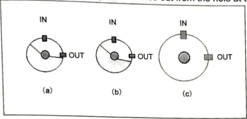

Document ID: 501
Source: /content/man1_merged.pdf
Content:
The image depicts a blurry, pixelated number 4 in black text, surrounded by a grey border. The number is centered in the image and appears to be a large font.

*   A blurry, pixelated number 4 in black text, surrounded by a grey border.
    *   The number is centered in the image and appears to be a large font.
    *   The background of the image is white.
    *   There is no other information or context provided in the image.
Image:


Document ID: 502
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an oil filter, accompanied by labels and arrows to highlight its various components. The diagram is rendered in black and white, with a clear and concise design.

*   **Oil Filler Port (Hydraulic Oil)**
    *   Located at the top of the device
    *   Indicated by a label and an arrow pointing to it
*   **Gauge**
    *   Positioned on the front of the device
    *   Labeled and connected to the oil filler port with an arrow
*   **Drain Port**
    *   Situated at the bottom of the device
    *   Identified by a label and an arrow pointing to it

The diagram effectively illustrates the key components of the oil filter, providing a clear understanding of its structure and functionality.
Image:


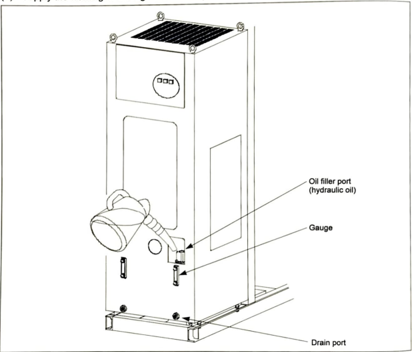

Document ID: 503
Source: /content/man1_merged.pdf
Content:
The image presents a simple yet striking visual representation of the number 4, enclosed within a square frame. The numeral is rendered in a bold, dark gray font, while the background is a clean white.

**Key Features:**

* **Number:** The prominent feature of the image is the number 4, displayed in a large, bold, dark gray font.
* **Background:** The background is a solid white, providing a clean and neutral contrast to the dark gray numeral.
* **Frame:** A square frame, also in dark gray, surrounds the number 4, adding a touch of sophistication and elegance to the overall design.

**Overall Impression:**

The image exudes a sense of simplicity and clarity, making it an effective visual representation of the number 4. The use of a bold font and a clean background ensures that the numeral stands out, while the square frame adds a touch of refinement.
Image:


Document ID: 504
Source: /content/man1_merged.pdf
Content:
The image presents a warning symbol, comprising:

*   A triangle with an exclamation mark inside it
*   The word "WARNING" written below the triangle

**Key Features:**

*   The triangle is positioned at the top center of the image.
*   The exclamation mark is centered within the triangle.
*   The word "WARNING" is written in all capital letters and is positioned below the triangle.

**Background:**

*   The background of the image is white.
Image:


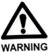

Document ID: 505
Source: /content/man1_merged.pdf
Content:
The image depicts a technical diagram of an oil filter system, accompanied by a series of labels and arrows that provide clear instructions on how to properly install it. The diagram is set against a white background, with black text and lines used to illustrate the various components and their connections.

Here is a detailed breakdown of the image:

* **Oil Filter Port (cooling fluid)**
	+ Located at the top left of the diagram
	+ Connected to the oil filter port via a tube
	+ Arrow pointing to it from the oil level gauge
* **Oil Filter Port (hydraulic oil)**
	+ Positioned at the bottom right of the diagram
	+ Connected to the drain port via a tube
	+ Arrow pointing to it from the oil level gauge
* **Oil Level Gauge**
	+ Situated at the bottom left of the diagram
	+ Connected to both oil filter ports via tubes
	+ Arrow pointing to both oil filter ports
* **Drain Port**
	+ Located at the bottom center of the diagram
	+ Connect

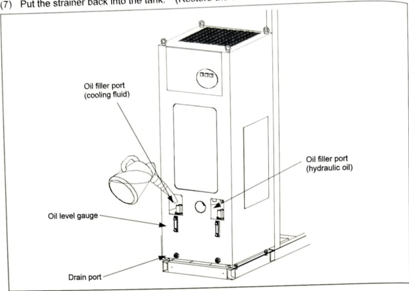

Document ID: 506
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an oil filter unit, accompanied by labels and annotations that provide detailed information about its components. The diagram is set against a white background, with black lines and text used to illustrate the various parts.

*   **Oil Filter Port**
    *   Located at the top of the diagram
    *   Labeled as "Oil filler port"
*   **Bracket**
    *   Positioned below the oil filter port
    *   Connected to the oil filter port by a line
*   **Drain Plug**
    *   Situated below the bracket
    *   Connected to the bracket by a line
*   **ATC Unit**
    *   Located below the drain plug
    *   Connected to the drain plug by a line
*   **Oil Level Gauge**
    *   Positioned below the ATC unit
    *   Connected to the ATC unit by a line
*   **Drain Plug (only for 43/60-tool magazine)**
    *   Situated below the oil level gauge
    *   Connected to the oil level gauge by a line
*   **ATC A

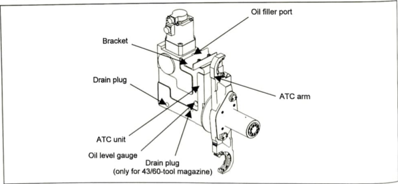

Document ID: 507
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an oil filler port, oil level gauge, drain port, and magazine shifter. The diagram is set against a white background with a thin black border.

*   **Oil Filler Port**
    *   Located at the top of the diagram
    *   Labeled as "Oil filler port"
    *   Features a circular opening with a small knob or handle on top
*   **Oil Level Gauge**
    *   Positioned below the oil filler port
    *   Labeled as "Oil level gauge"
    *   Displays a series of parallel lines, possibly indicating a measuring scale or indicator
*   **Drain Port (at the bottom)**
    *   Situated at the bottom of the diagram
    *   Labeled as "Drain port (at the bottom)"
    *   Features a circular opening with a small knob or handle on top
*   **Magazine Shifter**
    *   Located to the right of the oil level gauge
    *   Labeled as "Magazine shifter"
    *   Displays a series of gears or levers, possibly indicatin

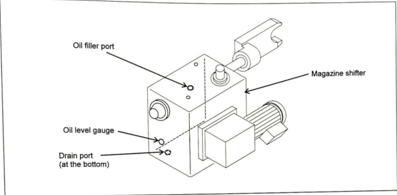

Document ID: 508
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "REGULAR INSPECTION" and the number "4" in a box.

*   The text "REGULAR INSPECTION" is written in a plain, sans-serif font and is left-aligned within the image.
    *   The text is centered horizontally across the width of the image.
    *   The color of the text is black, providing good contrast against the white background.
*   To the right of the text, there is a small square box containing the number "4".
    *   The box is outlined in black, creating a clear visual boundary.
    *   Inside the box, the number "4" is displayed in a larger font size compared to the text, making it stand out.
    *   The box is positioned directly to the right of the text, creating a sense of balance and symmetry in the design.

Overall, the image effectively communicates a message through its clear and concise presentation of text and numerical information. The use of a simp

Document ID: 509
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated number 4 in black font, set against a white background. The number is centered within a rectangular box with a thin gray border, which is also slightly pixelated.

*   **Number 4:**
    *   The number 4 is written in a black font.
    *   It is centered within a rectangular box.
    *   The number is blurry and pixelated.
*   **Rectangular Box:**
    *   The box has a thin gray border.
    *   The box is also blurry and pixelated.
    *   The box is centered in the image.
*   **Background:**
    *   The background is white.
    *   There are no other objects or features visible in the background.

The image appears to be a simple, low-resolution representation of the number 4, possibly used as a placeholder or in a digital context where high-quality graphics are not necessary.
Image:


Document ID: 510
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a machine, comprising two main sections: a top-down view and a side view. The diagram is accompanied by labels and arrows that provide additional information about the machine's components.

* **Top-Down View:**
	+ A large rectangular box with various components attached to its sides
	+ A circular component on the right side of the box
	+ A pipe extending from the circular component to the left side of the box
	+ Several other components attached to the sides of the box, including a tank, suction filter, and bolt
* **Side View:**
	+ A detailed illustration of the machine's internal components
	+ A lubrication unit located at the top of the machine
	+ A pipe extending from the lubrication unit down to the bottom of the machine
	+ A bolt attached to the bottom of the machine
	+ A suction filter attached to the side of the machine
	+ A tank attached to the side of the machine
* **Labels an

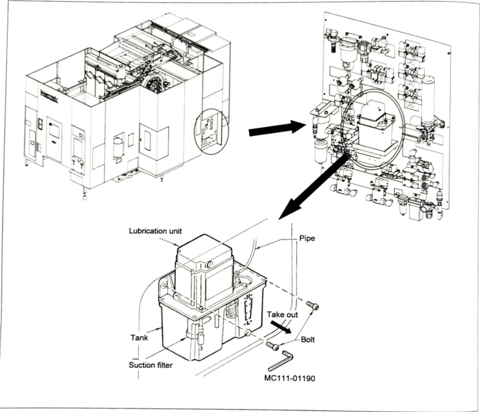

Document ID: 511
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "REGULAR INSPECTION" accompanied by the number 4 in a box. The purpose of this image is likely to serve as a label or identifier for a regular inspection process, possibly in a professional or technical context.

* The word "REGULAR INSPECTION" is written in a clear, easy-to-read font, indicating that it is the main focus of the image.
	+ The text is positioned on the left side of the image, leaving space on the right for the number.
	+ The font size is moderate, suggesting that it is intended for viewing from a short distance.
* A box containing the number 4 is located on the right side of the image, adjacent to the text.
	+ The box has a thin border, which adds a touch of professionalism to the design.
	+ The number 4 is centered within the box, making it easily readable.
* The background of the image is plain white, providing a clean and neutral backdrop for 

Document ID: 512
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a system, comprising four distinct components, each labeled with its respective name. The diagram is accompanied by a key that provides the following information:

• **Pump**: This component is situated at the top left of the diagram and is represented by a rectangular box with a long, thin tube extending from it.
• **Suction filter**: Located below the pump, this component is depicted as a cylindrical object with an arrow pointing towards it.
• **Filter clamp**: Positioned to the right of the suction filter, this component is represented by a small, circular object with an arrow pointing towards it.
• **Tank**: Situated at the bottom right of the diagram, this component is illustrated as a large, rectangular box with an arrow pointing towards it.

The diagram also includes several lines and arrows that connect the various components, indicating the flow of fluid or other substances betw

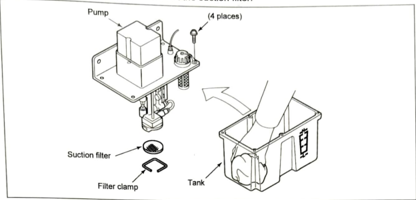

Document ID: 513
Source: /content/man1_merged.pdf
Content:
The image is a warning sign, featuring a triangle with an exclamation mark inside and the word "CAUTION" below it. The purpose of the image is to convey caution or warning to the viewer.

* A triangle with an exclamation mark inside:
	+ The triangle is equilateral and has a thick black outline.
	+ The exclamation mark is centered within the triangle.
	+ The triangle and exclamation mark are both in black.
* The word "CAUTION" in black text:
	+ The text is in all capital letters.
	+ The font is simple and sans-serif.
	+ The text is positioned below the triangle.
* A plain white background:
	+ The background is a solid, unpatterned white.
	+ There are no other design elements or colors present.

Overall, the image effectively conveys a sense of warning or caution, making it clear that attention should be paid to the message being conveyed. The simple design and bold text ensure that the message is easily readable and understood.


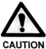

Document ID: 514
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated number 4.

* The number 4 is centered in the image.
	+ It is a dark gray color with a white background.
	+ The font is simple and sans-serif.
	+ The number appears to be a digit, possibly from a keyboard or a digital display.

The image is very blurry and pixelated, making it difficult to discern any details beyond the shape and size of the number. There are no other objects or features visible in the image.
Image:


Document ID: 515
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram, divided into two sections by a vertical line. The left section is labeled "O", while the right section is marked with an "X". Both sections feature diagrams with black lines and text.

*   **Left Section (O)**
    *   A diagram with a black circle in the bottom-left corner.
    *   The diagram depicts a Z-axis cable guide, accompanied by an arrow pointing to it.
    *   The Z-axis cable guide is situated within a larger rectangle.
*   **Right Section (X)**
    *   A diagram with a black "X" in the bottom-right corner.
    *   The diagram also features a Z-axis cable guide, marked by an arrow.
    *   The Z-axis cable guide is positioned within a larger rectangle.

In summary, the image displays two technical diagrams, each with a Z-axis cable guide, set against a white background. The diagrams are arranged in a grid-like pattern, with the left section labeled "O" and the right section mar

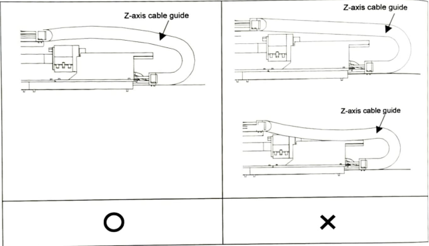

Document ID: 516
Source: /content/man1_merged.pdf
Content:
The image presents a warning symbol, comprising a triangle with an exclamation mark inside and the word "WARNING" below it. The symbol is set against a white background.

*   **Triangle:**
    *   The triangle is outlined in black.
    *   It has a flat bottom and pointed top.
    *   Inside the triangle, there is a black exclamation mark.
*   **Exclamation Mark:**
    *   The exclamation mark is centered within the triangle.
    *   It is solid black.
*   **Text:**
    *   Below the triangle, the word "WARNING" is written in black capital letters.
    *   The text is aligned to the right of the triangle.
*   **Background:**
    *   The background of the image is plain white.

In summary, the image displays a clear and concise warning symbol, consisting of a black triangle with an exclamation mark inside and the word "WARNING" in black text below it, all set against a white background.
Image:


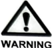

Document ID: 517
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of an oil level gauge, accompanied by three photographs illustrating its various components. The diagram and photographs are set against a white background, with black text and lines used to label each part.

*   **Diagram**
    *   The diagram is divided into two sections, with the top section featuring a 3D illustration of the oil level gauge.
    *   The bottom section displays a 2D illustration of the same gauge.
    *   Both diagrams include labels for the following components:
        *   Loading station side
        *   Machine side
        *   Oil filler port
        *   Cover
        *   Oil level gauge
        *   Machine side
        *   Drain port
*   **Photographs**
    *   The top photograph shows the oil level gauge from a slightly angled perspective, with the oil filler port and cover visible.
    *   The middle photograph provides a close-up view of the oil level gauge, hig

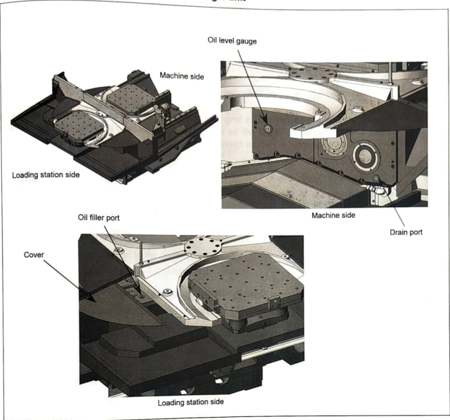

Document ID: 518
Source: /content/man1_merged.pdf
Content:
The image depicts a simple, rectangular shape with a light gray border and a white interior. The rectangle is oriented vertically, with the longer side facing upwards.

At the center of the rectangle, a large, blurry, black number "4" is prominently displayed. The number is rendered in a bold, sans-serif font, with a subtle shadow effect that gives it a slightly three-dimensional appearance.

The background of the image is a plain white color, providing a clean and neutral backdrop for the rectangular shape and its contents. Overall, the image appears to be a basic graphic design element, possibly used as a placeholder or a simple icon in a digital context.
Image:


Document ID: 519
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet distinctive design featuring a large number "4" within a square frame. The number is prominently displayed in the center of the frame, with the square border surrounding it and creating a sense of depth and dimensionality.

*   **Number 4:**
    *   The number "4" is the central element of the image.
    *   It is rendered in a large font size, making it the focal point of the composition.
    *   The number is positioned in the middle of the square frame, creating a sense of balance and symmetry.
*   **Square Frame:**
    *   The square frame serves as a border for the number "4".
    *   It is designed to resemble a picture frame, adding a touch of elegance and sophistication to the overall design.
    *   The frame is plain and lacks any additional embellishments, allowing the number "4" to take center stage.
*   **Background:**
    *   The background of the image is a clean and neutral white

Document ID: 520
Source: /content/man1_merged.pdf
Content:
The image displays a warning sign with the word "WARNING" underneath it. 

* The warning sign is a triangle with an exclamation mark inside it.
	+ The triangle is outlined in black and has a white interior.
	+ The exclamation mark is also black.
* The word "WARNING" is written in all capital letters underneath the triangle.
	+ The text is also black.

The background of the image is white.
Image:


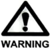

Document ID: 521
Source: /content/man1_merged.pdf
Content:
The image displays a simple graphic with text and a number. 

* The text is in the center-left of the image and reads "REGULAR INSPECTION" in black font.
	+ It is written in all capital letters.
	+ The font is plain and sans-serif.
* To the right of the text is a small square box with a thin black border.
	+ Inside the box is the number "4" in large black font.
	+ The number is centered within the box.

The background of the image is white, providing a clean and neutral backdrop for the text and number. Overall, the image appears to be a simple graphic used for labeling or identification purposes.
Image:


Document ID: 522
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "WARNING" below it.

*   The triangle is centered in the image, with its apex pointing upwards and its base resting on the bottom of the image.
    *   The triangle is outlined in black, with a white interior.
    *   Inside the triangle, there is a black exclamation mark.
*   Below the triangle, the word "WARNING" is written in black capital letters.
    *   The font used for the text is sans-serif and bold.
    *   The text is aligned to the left and takes up about one-third of the image's width.
*   The background of the image is plain white.

In summary, the image displays a warning sign consisting of a black triangle with a white interior and a black exclamation mark inside, accompanied by the word "WARNING" in bold, black capital letters below it.
Image:


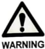

Document ID: 523
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet striking visual representation of the number 5 within a square box. The purpose of this image appears to be a straightforward display of the digit 5, possibly for educational or illustrative purposes.

* A number 5 is in the center of the image:
	+ The number 5 is prominently displayed in the center of the image.
	+ It is a large, black font with a slight shadow effect around it, giving it a sense of depth.
* The number is in a box with a thin border:
	+ The box surrounding the number 5 is a thin, light gray border.
	+ The box is rectangular in shape and has a flat top and bottom edge.
* The background of the image is white:
	+ The entire background of the image is a clean and crisp white color.
	+ There are no other objects or elements present in the background to distract from the central focus on the number 5.

The main finding from this image is that it effectively communicates the value of 

Document ID: 524
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated rectangle with rounded corners, featuring the word "RESET" in the middle. The rectangle has a gray border and a gray gradient shadow effect around it. Inside the rectangle, there is a gray diagonal line that extends from the top-left corner to the bottom-right corner, with its center aligned with the word "RESET".

The word "RESET" is written in black text, with each letter capitalized. The font is simple and sans-serif, with no visible embellishments or decorations.

The background of the image is white, providing a clean and neutral contrast to the gray and black elements within the rectangle.

Overall, the image appears to be a button or icon designed to represent the action of resetting something, possibly in a digital or technical context. However, due to the blurriness and pixelation, it is difficult to determine the exact purpose or functionality of the image.
Image:


Document ID: 525
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a gray border and a prominent number "5" in large, dark gray text. The box is centered within the frame, which has a white background.

*   **Gray Border:**
    *   The border is thin and surrounds the entire image.
    *   It is a light gray color that provides a subtle contrast to the white background.
*   **Number 5:**
    *   The number "5" is displayed in large, dark gray text.
    *   It is centered within the rectangular box.
    *   The font used for the number is bold and easy to read.
*   **Rectangular Box:**
    *   The box is a simple rectangle with no additional design elements or patterns.
    *   It serves as a container for the large number "5".
*   **Background:**
    *   The background of the image is white.
    *   It provides a clean and neutral backdrop for the gray border and the number "5".

In summary, the image features a simple yet striking design, with

Document ID: 526
Source: /content/man1_merged.pdf
Content:
The image presents a close-up view of a left hand's index finger, with the fingernail and surrounding skin as the sole focus. The finger is positioned vertically, with the nail facing upwards, and is surrounded by a light beige background that provides a subtle contrast to the darker skin tone of the finger.

Upon closer inspection, the fingernail appears to be well-manicured, with a slight curve at the tip and a smooth, glossy finish. The skin around the nail is slightly wrinkled, giving the impression of age or wear. A few small, light-colored hairs are visible on the back of the finger, adding texture to the overall image.

The background of the image is a plain white, which helps to draw attention to the finger and its details. There are no other objects or features in the image, allowing the viewer to focus solely on the finger.

Overall, the image presents a simple yet detailed view of a human finger, highlighting its uni

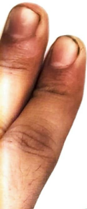

Document ID: 527
Source: /content/man1_merged.pdf
Content:
The image depicts a screenshot of a technical diagram, likely from a manual or instructional guide. The diagram is presented in black and white, with a title at the top that reads "Graphic Maintenance Score" in small text. Below this, there are several buttons and menus, including "Alarm Wave," "Maintain," "Diagnose," "Full Data Display," and "Exit." 

The diagram itself features two complex machines, each labeled with various parts and components. The machine on the left is labeled "Spindle," while the one on the right is labeled "Oil Air P.S. SPS." The diagram also includes several lines and arrows, indicating the relationships between the different parts and components of the machines. 

Overall, the image appears to be a technical illustration intended to help users understand and maintain complex machinery.
Image:


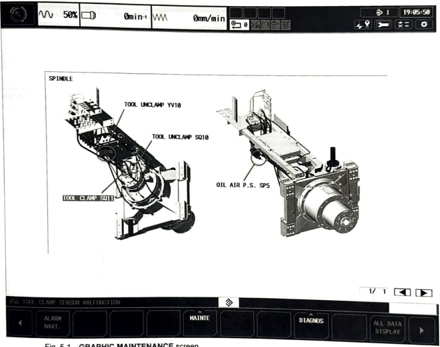

Document ID: 528
Source: /content/man1_merged.pdf
Content:
The image presents a concise and straightforward message, with the title "MAINTENANCE OF MAJOR UNITS" in bold black text against a clean white background. The use of a simple font and minimal design elements emphasizes the importance of the information being conveyed.

* **Title**: "MAINTENANCE OF MAJOR UNITS"
	+ Font: Bold black text
	+ Position: Centered at the top of the image
	+ Size: Large enough to be easily readable
* **Number 5**
	+ Font: Black text
	+ Position: Top-right corner of the image
	+ Size: Smaller than the title, but still clear and legible
* **Background**
	+ Color: White
	+ Texture: Smooth and even

The image effectively communicates the focus on maintenance of major units, with the prominent title and supplementary number 5 drawing attention to the importance of this topic. The simple design and lack of extraneous elements ensure that the viewer's attention is directed solely to the message being conveyed.

Document ID: 529
Source: /content/man1_merged.pdf
Content:
The image depicts a close-up of a hand with the index finger pointing upward, set against a white background.

**Key Features:**

* **Hand:** The hand is positioned in the lower left corner of the image, with the index finger extended upwards.
* **Finger:** The index finger is the only part of the hand visible in the image. It is brown and appears to be hairy.
* **Background:** The background is a plain white color, with a small sliver of blue visible at the bottom of the image.

**Overall Impression:**

The image appears to be a simple and straightforward depiction of a hand with the index finger pointing upwards. There are no notable actions, expressions, or interactions in the image. The overall atmosphere is calm and neutral, with no apparent emotional tone or message conveyed.
Image:


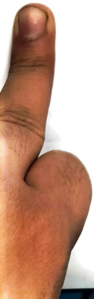

Document ID: 530
Source: /content/man1_merged.pdf
Content:
The image displays a simple text message with a number in a box. The text is in all capital letters and reads "MAINTENANCE OF MAJOR UNITS" on the left side of the image, while the number 5 is enclosed in a small white box with a black border on the right side.

*   **Text:**
    *   The text is in all capital letters.
    *   It reads "MAINTENANCE OF MAJOR UNITS".
    *   The text is left-aligned.
*   **Number in a box:**
    *   The number is 5.
    *   It is enclosed in a small white box with a black border.
    *   The box is located on the right side of the image.

The image appears to be a simple label or indicator for a specific category or process related to maintenance, likely used in a technical or industrial context.
Image:


Document ID: 531
Source: /content/man1_merged.pdf
Content:
The image displays a blurry, pixelated number 5 in a white box with a gray border.

* The number 5 is in the center of the image.
	+ It is written in black font.
	+ The number is slightly blurry and pixelated.
* The number is inside a white box.
	+ The box has a gray border around it.
	+ The border is thin and uniform on all sides.
* The background of the image is not visible.
	+ The white box and the gray border take up the entire space in the image.
	+ There are no other objects or details visible in the background.

The image appears to be a simple graphic design element, possibly used for labeling or identification purposes. The blurriness and pixelation suggest that the image may have been compressed or resized, resulting in a loss of clarity.
Image:


Document ID: 532
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of an industrial machine, likely used for manufacturing or production purposes. The machine is depicted in a detailed line drawing, showcasing its various components and mechanisms.

*   **Machine Components:**
    *   The machine features a prominent cylinder on the left side, connected to a series of pipes and tubes.
    *   A large, circular component is positioned in the center of the machine, with several smaller parts attached to it.
    *   On the right side of the machine, there is a rectangular frame with a series of gears and levers.
    *   The machine also includes a series of wires and cables, which are connected to various components.
*   **Labels and Numbers:**
    *   The machine is labeled with numbers "1", "2", "3", and "4", which appear to correspond to different parts or components of the machine.
    *   The labels are placed near the corresponding components, providin

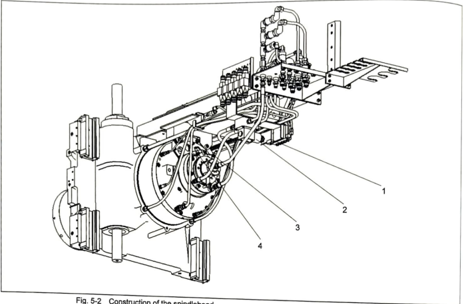

Document ID: 533
Source: /content/man1_merged.pdf
Content:
The image presents a close-up view of a finger, with the nail being the primary focus. The thumb is positioned at an angle, creating a sense of depth and dimensionality.

**Key Features:**

* **Nail:** The nail is the central element of the image, occupying most of the frame. It appears to be well-manicured, with a smooth and even surface.
* **Thumb:** The thumb is visible in the background, providing context for the nail. It is positioned at an angle, adding depth and dimensionality to the image.
* **Background:** The background is white, which helps to highlight the details of the nail and thumb.

**Overall Impression:**

The image conveys a sense of cleanliness and attention to detail, suggesting that the person who owns this finger takes pride in their personal grooming. The close-up shot emphasizes the importance of the nail, drawing the viewer's attention to its shape, size, and condition.
Image:


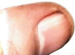

Document ID: 534
Source: /content/man1_merged.pdf
Content:
The image displays a single, blurry number 5 in a large, black font. The number is centered in the image and appears to be surrounded by a white background with a thin, vertical, gray line on either side of it. The number itself is slightly fuzzy, suggesting that it may have been taken from a low-resolution image or zoomed in too far. Overall, the image is simple and straightforward, conveying the message "5" in a clear and concise manner.
Image:


Document ID: 535
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated representation of the number 5 in a box.

*   The number 5 is written in large, dark gray text and centered within a white box.
    *   The font used for the number 5 is bold and sans-serif.
    *   The number 5 is positioned in the middle of the box, leaving no space between it and the edges of the box.
*   The background of the image is light gray, with a darker gray border around the white box containing the number 5.
    *   The border is thin and uniform, with no visible gaps or irregularities.
*   The overall effect of the image is one of simplicity and clarity, with the bold number 5 standing out against the clean white background and light gray border.
Image:


Document ID: 536
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a machine, comprising various components and parts. The diagram is labeled with numbers and letters, providing a clear identification of each element.

*   **Machine Components:**
    *   **1.** A long, flat piece of metal, likely a base or platform.
    *   **2.** A vertical rod with a wheel at the top, possibly a mechanism for movement or rotation.
    *   **3.** A curved piece of metal, potentially a guide or support for another component.
    *   **4.** A small, rectangular box, possibly a housing or compartment for electronics or other components.
    *   **5.** A long, thin rod, likely a shaft or axis for rotation or movement.
    *   **6.** A round, flat disc, possibly a pulley or gear for transmitting motion.
    *   **7.** A small, cylindrical object, potentially a bearing or bushing for reducing friction.
    *   **8.** A long, flat piece of metal, likely a track or guide for m

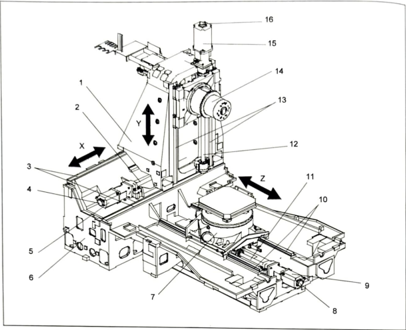

Document ID: 537
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the words "MAINTENANCE OF MAJOR UNITS" and the number 5 in a small white box.

* The text is written in black, sans-serif font and reads:
	+ "MAINTENANCE OF MAJOR UNITS"
* The number 5 is displayed in a small white box with a black outline.
* The background of the image is a light gray color.

The image appears to be a title or heading for a document or presentation, possibly related to maintenance or repair of major units.
Image:


Document ID: 538
Source: /content/man1_merged.pdf
Content:
The image presents a simple yet striking visual representation of the number 5. This is achieved through the use of a large, bold font, with the digit rendered in black on a white background.

* The number 5 is displayed prominently in the center of the image.
	+ It is written in a large, bold font to draw attention to the number.
	+ The font is likely sans-serif, given its clean and modern appearance.
* The background of the image is a solid white color.
	+ This provides a clean and neutral backdrop for the number 5, allowing it to stand out clearly.
	+ The white background helps to create a sense of simplicity and minimalism in the image.

In summary, the image effectively communicates the number 5 in a clear and concise manner, thanks to its bold font and white background. The use of a single color and simple design elements creates a visually appealing and easy-to-understand representation of the number.
Image:


Document ID: 539
Source: /content/man1_merged.pdf
Content:
The image depicts a close-up of a right hand, specifically the index finger and the area around it. The hand is positioned with the index finger pointing upwards, while the thumb is tucked into the palm and the other fingers are not visible.

*   **Index Finger**
    *   The index finger is the most prominent part of the hand in the image.
    *   It is extended and pointing upwards, with the tip of the finger reaching towards the top of the frame.
    *   The fingernail is short and well-manicured, with a slight curve to the left.
*   **Thumb**
    *   The thumb is partially visible, tucked into the palm of the hand.
    *   It is bent at the first knuckle, with the tip of the thumb curled under the index finger.
    *   The fingernail is also short and well-manicured.
*   **Palm and Wrists**
    *   The palm of the hand is not visible, but the wrist is slightly visible at the bottom of the frame.
    *   The skin tone of the 

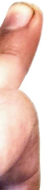

Document ID: 540
Source: /content/man1_merged.pdf
Content:
The image is a black-and-white photograph of a machine with various parts labeled. The purpose of the image appears to be for instructional or educational purposes, as it highlights specific components of the machine.

* ATC door:
	+ Located at the top of the image
	+ Labeled with a white box containing the text "ATC door"
	+ Connected to a cylindrical component
* ATC door cylinder:
	+ Located above the ATC door
	+ Labeled with a white box containing the text "ATC door cylinder"
	+ Appears to be a mechanical component
* Arm swing start sensor:
	+ Located on the left side of the image
	+ Labeled with a white box containing the text "Arm swing start sensor"
	+ Appears to be a small, circular component

The image provides a clear view of the machine's components and their relationships to one another. The labels help to identify each part, making it easier to understand the machine's functionality.
Image:


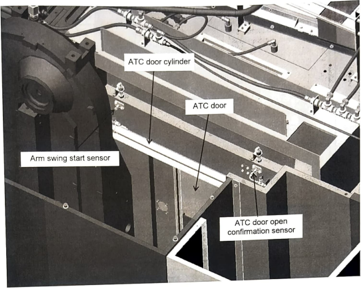

Document ID: 541
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a blurred number "5" inside. The box is outlined by a thin gray border, and the number is centered within it. The background of the image is white.

Here is a detailed description of the image:

* **Rectangular Box:**
	+ Outline: Thin gray border
	+ Color: Gray
	+ Shape: Rectangular
	+ Size: Approximately 1.5 times the size of the number "5"
* **Number "5":**
	+ Color: Dark gray (blurred)
	+ Font: Simple, sans-serif font
	+ Size: Approximately 0.5 times the size of the box
	+ Position: Centered within the box
* **Background:**
	+ Color: White
	+ Texture: Smooth

In summary, the image features a small, rectangular box with a blurred number "5" inside, set against a white background. The box and number are outlined in gray, creating a simple and clean visual effect.
Image:


Document ID: 542
Source: /content/man1_merged.pdf
Content:
The image presented is a black and white photograph of a number 5, displayed within a square box. The number 5 is rendered in a large, bold font, with its top half situated above the center of the square and its bottom half positioned below it. The square box itself is outlined in gray, providing a subtle frame around the central element.

The background of the image is predominantly white, serving as a clean and neutral backdrop for the prominent number 5. Notably, the image appears to be slightly blurry, which may be attributed to the camera's focus or the resolution of the image. Overall, the composition is straightforward and uncluttered, with the number 5 taking center stage within the square box.
Image:


Document ID: 543
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of an ATC (Automated Tool Changer) system, highlighting its various components and their functions. The diagram is titled "ATC cam" and features a black-and-white illustration of the system's mechanical parts.

* **ATC cam**
	+ A cylindrical component with a flat top and bottom
	+ Located at the center of the diagram
	+ Appears to be made of metal
* **ATC arm**
	+ A curved, hook-like structure attached to the ATC cam
	+ Has a small, round base that connects to the cam
	+ Extends outward from the cam, forming a 90-degree angle
* **Magazine**
	+ A rectangular box with a grid-like pattern on its front
	+ Contains several small, round objects (likely tools)
	+ Has a handle on the right side
* **Magazine tool pocket**
	+ A small, circular indentation on the front of the magazine
	+ Designed to hold a single tool
	+ Located near the center of the magazine

The diagram provides a clear visual repr

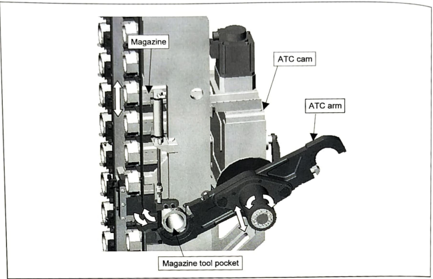

Document ID: 544
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an ATC (Automated Teller Machine) unit, showcasing its various components and their connections. The diagram is drawn in black lines on a white background, with labels and arrows indicating the relationships between the different parts.

*   **ATC arm**
    *   The ATC arm is a key component of the ATC unit, responsible for moving the magazine and spindle.
    *   It is connected to the magazine shifter and the spindle.
    *   The ATC arm is labeled as "ATC arm" in the diagram.
*   **Magazine shifter**
    *   The magazine shifter is a crucial part of the ATC unit, controlling the movement of the magazine.
    *   It is connected to the ATC arm and the magazine.
    *   The magazine shifter is labeled as "Magazine shifter" in the diagram.
*   **Magazine**
    *   The magazine is a storage container for cash or other items.
    *   It is connected to the ATC arm and the magazine shifter

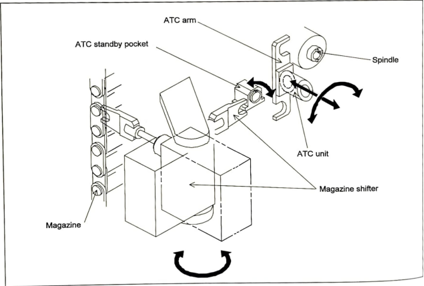

Document ID: 545
Source: /content/man1_merged.pdf
Content:
The image presents a concise and straightforward message, likely used in a technical or instructional context. The text is centered and reads "MAINTENANCE OF MAJOR UNITS" in a clear, black font. To the right of this text, a small box contains the number 5 in a slightly larger font.

**Key Features:**

* **Text:** "MAINTENANCE OF MAJOR UNITS" in black font
* **Number:** 5 in a small box to the right of the text
* **Background:** White

**Purpose:**
The image appears to be a label or identifier for a specific category or section related to maintenance or repair of major units. The use of a simple, bold font and the inclusion of the number 5 suggest that this image is part of a larger system or hierarchy, where the number 5 may represent a specific level or category within the maintenance process. Overall, the image effectively conveys a clear and concise message, making it easy to understand and identify its purpose.
Image:


Document ID: 546
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet clear visual representation of the number 5. Here are the key features of the image:

* **Number 5**: 
	+ The number 5 is prominently displayed in the center of the image.
	+ It is written in a large, bold font, making it easily readable.
	+ The number is positioned within a square box, with equal spacing between the top, bottom, left, and right edges of the box.
* **Background**:
	+ The background of the image is a solid light gray color.
	+ There are no other visual elements or patterns on the background.
* **Border**:
	+ A thin gray border surrounds the entire image.
	+ The border is uniform in width and does not have any visible texture or pattern.

In summary, the image is a straightforward display of the number 5 within a square box, set against a light gray background and surrounded by a thin gray border.
Image:


Document ID: 547
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a mechanical device, likely an industrial component, with various labels and annotations. The diagram is rendered in black and white, featuring a central circular component surrounded by smaller parts and components.

* **Central Circular Component**
	+ Located at the top center of the image
	+ Features several circular protrusions and holes
	+ Appears to be the main functional unit of the device
* **Oil Filler Port**
	+ Positioned below the central circular component
	+ Labelled "Oil filler port"
	+ Suggests a connection for oil or fluid input
* **Oil Level Gauge**
	+ Situated to the left of the oil filler port
	+ Labelled "Oil level gauge"
	+ Indicates a mechanism for measuring oil levels
* **Drain Port**
	+ Located below the oil level gauge
	+ Labelled "Drain port"
	+ Implies a connection for draining excess fluid
* **Servomotor**
	+ Positioned to the right of the central circular co

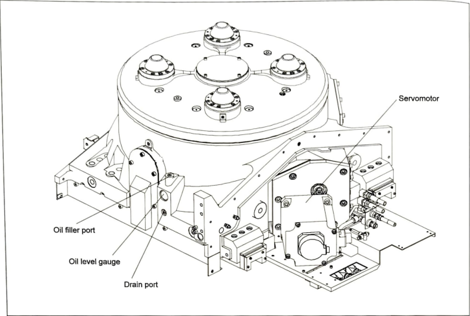

Document ID: 548
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a mechanical device, showcasing its various components and their connections. The diagram is labeled with key terms and phrases, providing context for the different parts of the device.

*   **Table Clamp Detection Sensor**
    *   Located at the bottom left of the image
    *   Extends from the main body of the device to the right side
    *   Terminates in a small box or module
*   **Servomotor**
    *   Positioned near the top center of the image
    *   Circular in shape with several circular protrusions on top
    *   Connected to the main body of the device via a rod or shaft
*   **Main Body**
    *   Central component of the device
    *   Rectangular shape with rounded edges
    *   Features several circular cutouts and protrusions
    *   Serves as the base for the servomotor and table clamp detection sensor

In summary, the image provides a detailed illustration of a mechanica

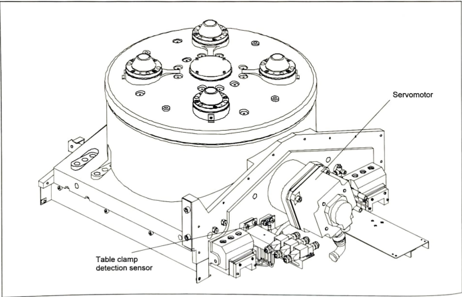

Document ID: 549
Source: /content/man1_merged.pdf
Content:
The image displays a large number 5 in black font on a white background. 

* The number 5 is written in large, bold, black font.
	+ It is centered in the image and takes up most of the space.
	+ The font is sans-serif and has a slight shadow effect around the edges.
* The background is white with a gray border around the edges.
	+ The border is thin and evenly spaced on all sides.
	+ There are no other objects or details in the image.

The image appears to be a simple graphic design element, possibly used as a placeholder or icon.
Image:


Document ID: 550
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a large "5" in the center. The box is outlined by a thin black border, which is slightly thicker on the right and left sides than at the top and bottom. The background of the image is white, providing a clean and neutral backdrop for the box and its contents.

Here are the key features of the image:

* **Box:**
	+ Shape: Rectangular
	+ Color: White
	+ Outline: Thin black border
	+ Border thickness: Slightly thicker on the right and left sides
* **Number 5:**
	+ Color: Black
	+ Font: Large, bold
	+ Position: Center of the box
* **Background:**
	+ Color: White

In summary, the image is a simple yet striking visual representation of the number 5, set against a clean white background. The use of a bold, black font and a thin black border creates a sense of depth and dimensionality, making the image visually appealing and easy to read.
Image:


Document ID: 551
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a pallet change arm, accompanied by labels that identify its various components. The diagram is set against a white background, with the text and lines rendered in black.

Here is a list of bullet points that describe the image:

• **Arm down sensor**
	+ Located at the top-left corner of the diagram
	+ Connected to the arm down sensor via a thin line
	+ No statistics provided

• **Cam drive motor**
	+ Positioned below the arm down sensor
	+ Connected to the cam drive motor via a thin line
	+ No statistics provided

• **Speed reducer**
	+ Situated below the cam drive motor
	+ Connected to the speed reducer via a thin line
	+ No statistics provided

• **Pallet change arm**
	+ Dominates the center of the diagram
	+ Comprises several interconnected components
	+ No statistics provided

• **Pallet bearing faces**
	+ Located at the top-right corner of the diagram
	+ Connected to the pallet bea

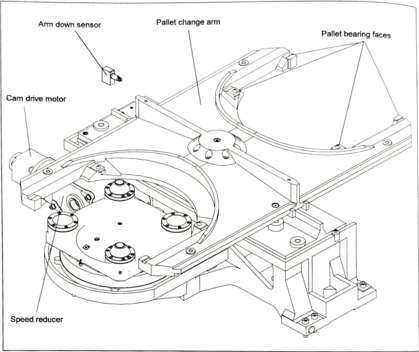

Document ID: 552
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, comprising a triangle with an exclamation mark at its center and the word "WARNING" written below it. The purpose of this image is to serve as a visual indicator of caution or alertness.

* A triangle:
	+ The triangle is equilateral, with equal sides and angles.
	+ It is outlined in black and has a white interior.
	+ The triangle's apex points upwards, forming the top of the warning sign.
* An exclamation mark:
	+ The exclamation mark is centered within the triangle.
	+ It is large and prominent, drawing attention to the warning.
	+ The exclamation mark is also black in color, matching the outline of the triangle.
* The word "WARNING":
	+ The word "WARNING" is written in bold, black letters.
	+ It is positioned directly below the triangle, creating a clear visual connection between the two elements.
	+ The font used for the text is simple and easy to read, ensuring that the message is conveyed

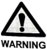

Document ID: 553
Source: /content/man1_merged.pdf
Content:
The image presents a simple, monochromatic design featuring a black vertical bar situated on the left side of the frame. The bar is positioned vertically, spanning from the top to the bottom of the image, and is centered horizontally within the frame. The background of the image is a plain white color, providing a clean and neutral backdrop for the black bar.

*   The black bar:
    *   Color: Black
    *   Shape: Vertical
    *   Position: Left side of the frame
    *   Size: Spans from top to bottom of the image
    *   Centered horizontally within the frame
*   The background:
    *   Color: White
    *   Type: Plain

In summary, the image features a single black vertical bar set against a white background, creating a straightforward and minimalist visual composition.
Image:


Document ID: 554
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the words "MAINTENANCE OF MAJOR UNITS" and the number 5.

* The text box is a rectangle with a thin black border.
	+ It is positioned in the top-right corner of the image.
	+ The text is centered within the box.
* The words "MAINTENANCE OF MAJOR UNITS" are written in black text.
	+ They are also centered within the box.
	+ The font is simple and easy to read.
* The number 5 is displayed in a larger font size than the text.
	+ It is positioned to the right of the text.
	+ It is also centered within the box.

Overall, the image appears to be a label or heading for a section or category related to maintenance. The use of a simple font and color scheme suggests a professional or technical context.
Image:


Document ID: 555
Source: /content/man1_merged.pdf
Content:
The image presents a technical document featuring two pages of diagrams and text, likely from a manual or instructional guide. The purpose of the image is to provide detailed information on the maintenance and operation of a specific system or device.

Here are the key elements of the image:

* **Page 1:**
	+ **Title:** "5 MAINTENANCE OF WATER HEATERS"
	+ **Diagram 1:** A detailed diagram of a water heater system, including pipes, valves, and other components.
	+ **Diagram 2:** A smaller diagram showing the location of a specific valve in the system.
	+ **Text:** Various notes and labels throughout the diagrams, including arrows, symbols, and text.
* **Page 2:**
	+ **Title:** "5 MAINTENANCE OF WATER HEATERS"
	+ **Diagram 3:** A diagram of a water heater system, similar to the one on Page 1.
	+ **Diagram 4:** A smaller diagram showing the location of a specific valve in the system.
	+ **Text:** Various notes and labels throughou

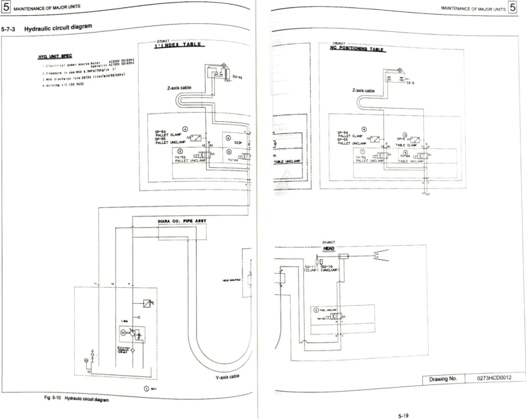

Document ID: 556
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a gray border, featuring the number 5 prominently displayed in large, black font within the box.

Here is a detailed breakdown of the image's components:

* **Border**: The border is a thin, rectangular shape that surrounds the box. It is a light gray color and has a subtle gradient effect, giving it a slightly darker tone around the edges.
* **Box**: The box is a solid white color and has a rectangular shape with rounded corners. It is centered in the image and takes up most of the space.
* **Number 5**: The number 5 is written in large, black font within the box. It is positioned slightly off-center to the left, leaving some space between it and the right edge of the box.

In summary, the image features a simple yet striking design, with a prominent display of the number 5 within a rectangular box. The use of a light gray border and white box creates a clean and minimalist aes

Document ID: 557
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a black triangle with an exclamation mark inside, accompanied by the word "WARNING" in bold black text below it. The background of the image is white.

Here are the key elements of the image:

* **Triangle**: A black triangle with an exclamation mark inside
	+ Shape: Equilateral triangle with rounded edges
	+ Color: Black
	+ Size: Approximately 2/3 of the image's width
* **Exclamation Mark**: A black exclamation mark inside the triangle
	+ Shape: Exclamation mark symbol
	+ Color: Black
	+ Size: Approximately 1/5 of the image's width
* **Word "WARNING"**: Bold black text below the triangle
	+ Font: Bold sans-serif font
	+ Color: Black
	+ Size: Approximately 1/3 of the image's width
* **Background**: White background
	+ Color: White
	+ Pattern: Solid color

In summary, the image features a warning sign with a black triangle containing an exclamation mark, accompanied by the bold black 

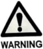

Document ID: 558
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a filter housing and gasket, accompanied by a key that labels the various components. The diagram is set against a white background, with black lines and text used to illustrate the parts.

Here is a list of bullet points that describe the visual content in the image:

* **Diagram of Filter Housing and Gasket**
	+ The diagram shows a filter housing and gasket, with the housing located at the bottom and the gasket situated above it.
	+ The housing has a cylindrical shape with a flat top and bottom, while the gasket is circular and has a small hole in the center.
	+ The gasket is positioned on top of the housing, with the hole aligned with the center of the housing.
* **Key to Diagram**
	+ The key is located to the left of the diagram and consists of a small square with a line drawing of the filter housing and gasket inside.
	+ The key is labeled with numbers (1) through (4), which corresp

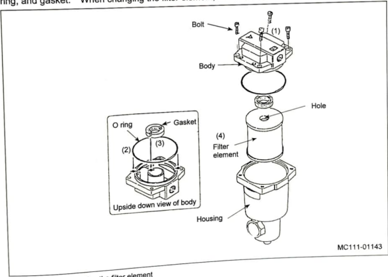

Document ID: 559
Source: /content/man1_merged.pdf
Content:
The image displays a number in black font on a white background, surrounded by a gray border.

* The number is "5" in black font.
	+ It is centered in the image.
	+ The font is simple and sans-serif.
* The background is white.
	+ It provides a clean and neutral backdrop for the number.
* The border is gray.
	+ It is a thin line that surrounds the entire image.
	+ It adds a subtle frame to the number and background.

The image is a simple yet effective representation of the number 5, with a clear and easy-to-read font against a clean white background. The gray border adds a touch of sophistication and helps the image stand out.
Image:


Document ID: 560
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram, specifically a pneumatic circuit diagram, which is likely used to illustrate the connections and components of a pneumatic system. The diagram is presented in a technical style, with various symbols and labels used to represent different components and connections.

* **Title and Section Numbers**
	+ The title "Pneumatic Circuit Diagram" is located at the top-left corner of the image.
	+ Two section numbers, "5-8-3" and "5", are located in the top-left and top-right corners, respectively.
* **Diagram**
	+ The diagram consists of various lines, symbols, and labels that represent different components and connections of the pneumatic system.
	+ The diagram includes several boxes, cylinders, valves, and other components, as well as pipes and tubes that connect them.
	+ The diagram is divided into several sections, each representing a different part of the system.
* **Labels and Text**
	+ Vari

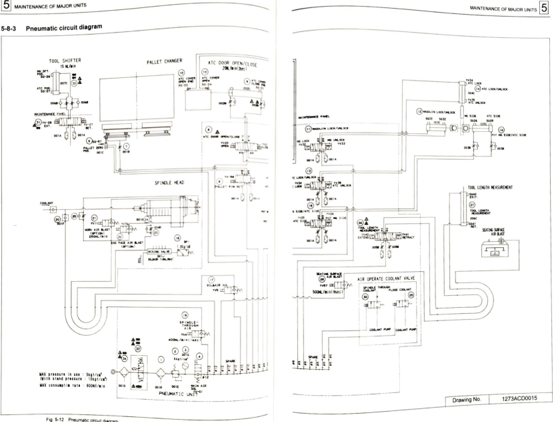

Document ID: 561
Source: /content/man1_merged.pdf
Content:
The image presents a blurry, pixelated number 5 in a white box with a gray border. The number is displayed in a large, dark gray font, with the top and bottom borders of the box appearing slightly lighter than the rest of the box.

*   **Number 5:**
    *   Font: Large, dark gray
    *   Position: Centered in the white box
*   **White Box:**
    *   Color: White
    *   Border: Gray
    *   Size: Slightly larger than the number 5
*   **Gray Border:**
    *   Color: Light gray
    *   Position: Surrounds the entire image

In summary, the image features a prominent, blurry number 5 within a white box with a gray border, set against a larger gray border that encloses the entire image.
Image:


Document ID: 562
Source: /content/man1_merged.pdf
Content:
The image is a simple, black-and-white graphic of the number 5.

* The number 5 is written in a bold, black font.
	+ The font is sans-serif and has a thick, rounded shape to it.
	+ The number is centered within a square shape.
* The square shape has a thin, gray border around it.
	+ The border is a solid line that is one pixel wide.
	+ The border does not have any additional design elements or patterns.
* The background of the image is white.
	+ The background is a plain, solid color with no patterns or textures.

In summary, the image is a basic graphic of the number 5 in a bold, black font, set against a white background with a thin gray border around it.
Image:


Document ID: 563
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an electric pump system, comprising a tank capacity diagram and a detailed description of the pump's components. The diagram is divided into two main sections: the left side illustrates the tank capacity, while the right side provides a detailed breakdown of the pump's components.

**Tank Capacity Diagram:**

*   Electric pump
*   Tank capacity: 400 cm³ (24.41 in³)

**Pump Components:**

*   Linear guide bearings (4 places)
*   Ball screw nut

**Key Features:**

*   Total capacity: 400 cm³ (24.41 in³)
*   Tank capacity diagram on the left side
*   Detailed description of the pump's components on the right side
*   Linear guide bearings and ball screw nut are the primary components

The diagram effectively communicates the key features and components of the electric pump system, providing a clear understanding of its functionality and design.
Image:


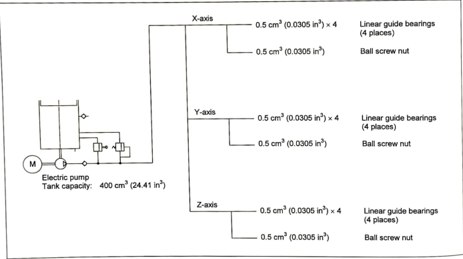

Document ID: 564
Source: /content/man1_merged.pdf
Content:
The image presents a simple text-based graphic, featuring the phrase "MAINTENANCE OF MAJOR UNITS" in black text on a white background. The text is aligned to the left and occupies approximately 2/3 of the image's width.

Here are the key elements of the image:

* **Text**
	+ Font: Black, sans-serif font
	+ Alignment: Left
	+ Content: "MAINTENANCE OF MAJOR UNITS"
	+ Width: Approximately 2/3 of the image
* **Background**
	+ Color: White
* **Number**
	+ Content: The number "5"
	+ Location: Top-right corner of the image
	+ Box: A small black box surrounds the number

In summary, the image displays a straightforward graphic with the phrase "MAINTENANCE OF MAJOR UNITS" in black text on a white background, accompanied by the number "5" in a small black box in the top-right corner.
Image:


Document ID: 565
Source: /content/man1_merged.pdf
Content:
The image presents a table and diagram illustrating the discharge amount of lubricating oil in various scenarios. The table is divided into two columns, with the left column displaying a series of diagrams accompanied by corresponding numerical values. The right column lists the names of different mechanical components.

**Table Structure:**

*   **Left Column:**
    *   A diagram is shown, featuring a line drawing of a mechanical component with arrows pointing to different parts.
    *   Numerical values are listed below the diagram, ranging from 0.01 cm^3 to 0.05 cm^3.
*   **Right Column:**
    *   The names of different mechanical components are listed, including:
        *   Angular bearing
        *   Roller bearing
        *   Table gear
        *   43-tool magazine chain (option)
        *   60-tool magazine chain (option)
        *   80/100-tool magazine chain (option)
        *   120-tool magazine chain (option)
      

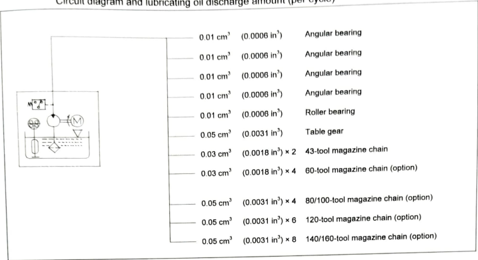

Document ID: 566
Source: /content/man1_merged.pdf
Content:
The image presents a close-up view of a hand with the index finger extended, set against a white background. The hand is positioned at an angle, with the thumb and pinky finger partially visible in the bottom-left corner of the frame. The thumb is bent towards the palm, while the pinky finger extends downwards.

*   **Finger:**
    *   The index finger is the main focus of the image, extending upwards from the hand.
    *   The fingernail is short and well-manicured, with a subtle sheen to it.
    *   The skin tone of the finger is a warm, golden brown, with visible wrinkles on the back of the hand.
*   **Background:**
    *   The background of the image is a solid white, providing a clean and neutral backdrop for the hand.
    *   There are no other objects or features visible in the background, allowing the focus to remain on the hand and finger.
*   **Overall Composition:**
    *   The composition of the image is simple and 

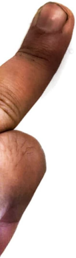

Document ID: 567
Source: /content/man1_merged.pdf
Content:
The image presents a simple and straightforward visual representation of the number 5.

* The number 5 is prominently displayed in the center of the image.
	+ The numeral is rendered in a large, bold font.
	+ It is positioned centrally within the frame.
* The background of the image is a clean and neutral white color.

In summary, the image effectively communicates the value of 5 through its clear and concise design.
Image:


Document ID: 568
Source: /content/man1_merged.pdf
Content:
The image presents a close-up view of a hand with the index finger extended, set against a white background. The index finger is positioned at an angle, with the tip pointing towards the top right corner of the image and the wrist visible at the bottom left corner. The skin tone of the hand is dark brown or black, and the fingernails appear to be well-manicured and clean.

**Key Features:**

* **Hand:** The hand is the primary focus of the image, with the index finger being the most prominent feature.
* **Index Finger:** The index finger is extended, with the tip pointing towards the top right corner of the image.
* **Skin Tone:** The skin tone of the hand is dark brown or black.
* **Fingernails:** The fingernails appear to be well-manicured and clean.
* **Background:** The background of the image is white, providing a clean and neutral contrast to the hand.

**Overall Impression:**

The image appears to be a simple yet effecti

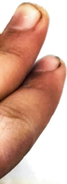

Document ID: 569
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with the number "5" prominently displayed in its center. The box is white, with a gray border that surrounds it. The number "5" is rendered in a bold, black font and is positioned within the box, occupying most of the space.

**Key Features:**

* **Box:** White with a gray border
* **Number 5:** Bold, black font, centered within the box
* **Border:** Gray, surrounds the entire box

**Visual Description:**

The image is a straightforward representation of a single digit, "5", within a rectangular box. The use of a bold font for the number and a plain white background for the box creates a clean and simple visual effect. The gray border adds a touch of sophistication, providing a subtle frame for the central element. Overall, the image is easy to understand and interpret, making it suitable for various contexts where a clear and concise display of the number "5" is required.
Image:


Document ID: 570
Source: /content/man1_merged.pdf
Content:
The image is a close-up of a left hand, with the thumb and index finger prominently displayed. The thumb is positioned at the top of the frame, while the index finger is slightly bent and placed beside it, creating a sense of movement and interaction.

**Key Features:**

* **Skin Color:** The skin tone is a warm, medium brown, with visible pores and fine lines.
* **Nail Condition:** The fingernails are short and well-manicured, with a subtle sheen that suggests regular care.
* **Finger Position:** The index finger is bent at the first joint, giving the impression of being slightly relaxed or curled inward.
* **Thumb Position:** The thumb is straight and upright, with the tip pointing towards the top-left corner of the image.
* **Background:** The background is a plain white, which helps to highlight the details of the hand and fingers.
* **Overall Impression:** The image conveys a sense of intimacy and focus, as if the viewer i

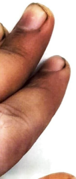

Document ID: 571
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a spindle cooling unit, accompanied by labels and annotations that provide additional information about its components and features. The drawing is divided into two main sections: a detailed view of the unit's internal components and an enlarged view of the compound oil control unit.

* **Detailed View of the Unit's Internal Components**
	+ The unit is depicted as a large, rectangular box with various components and features visible inside.
	+ A label at the top-left corner reads "Construction of the spindle cooling unit" in bold text.
	+ The unit appears to have several compartments or sections, each with its own distinct features and components.
	+ A few components are labeled, including a "Hydraulic oil" tank and a "Cooling fluid" reservoir.
* **Enlarged View of the Compound Oil Control Unit**
	+ This section shows a smaller, separate component that is part of the larger unit.
	+ The

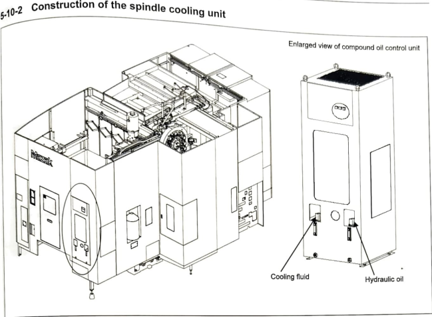

Document ID: 572
Source: /content/man1_merged.pdf
Content:
The image depicts a simple graphic of the number 5 within a rectangle.

*   The number 5 is displayed prominently in the center of the image, occupying most of the space.
    *   It is rendered in a large, bold font with a dark gray color.
    *   The number appears to be centered both horizontally and vertically within the rectangle.
*   The rectangle that contains the number 5 is outlined in a thin, dark gray line.
    *   It has a slight shadow effect around the edges, giving it a subtle depth.
    *   The rectangle is positioned slightly above the center of the image, leaving some space at the top and bottom.
*   The background of the image is a plain white color.
    *   There are no other visual elements or features present in the image besides the rectangle and the number 5.

In summary, the image is a straightforward representation of the number 5 enclosed in a simple rectangle with a subtle shadow effect.
Image:


Document ID: 573
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet striking design featuring the number 5 within a rectangular box. The number is displayed in a large, bold font, with a thick black outline that adds depth and dimension to the overall design.

Here are the key elements of the image:

* **Number 5**: The number 5 is prominently displayed in the center of the image, taking up most of the space. It is rendered in a large, bold font, making it easily readable.
	+ Font: The font used for the number 5 is simple and sans-serif, with clean lines and a lack of ornamentation.
	+ Size: The number 5 is quite large, taking up most of the space in the image.
* **Rectangular Box**: The number 5 is enclosed within a rectangular box, which provides a clear frame for the number and adds a sense of structure to the image.
	+ Color: The box is a solid gray color, which provides a neutral background that allows the number 5 to stand out.
	+ Thickness: The box has a 

Document ID: 574
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a mechanical system, comprising various components and their connections. The diagram is divided into sections, each labeled with a specific component or process, and features arrows indicating the direction of flow or movement.

*   **Cooling the Z-axis ball screw core**
    *   This section includes a spiral-shaped component, likely a spring or coil, connected to a rectangular box.
    *   The box has a series of lines and symbols, possibly representing electrical connections or control systems.
    *   A curved line connects the box to another rectangular component, which may be a valve or pump.
    *   The section also features a small, circular component with a label indicating "45."
*   **Cooling the X-axis ball screw core**
    *   This section consists of a series of straight lines and rectangles, possibly representing pipes or conduits.
    *   A small, circular component is co

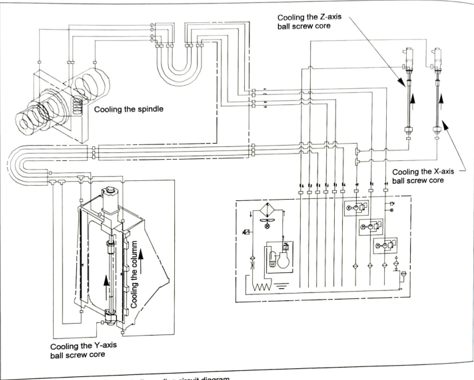

Document ID: 575
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a large number "5" prominently displayed inside. The box is outlined in gray and features a white background, while the number itself is rendered in black.

*   **Background:**
    *   The background of the image is white.
*   **Box:**
    *   The box is rectangular in shape.
    *   It is outlined in gray.
    *   The box has a white background.
*   **Number:**
    *   The number "5" is displayed inside the box.
    *   The number is black in color.
    *   It is centered within the box.

In summary, the image features a white background with a gray-outlined rectangular box containing the large black number "5".
Image:


Document ID: 576
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular shape with a number "5" prominently displayed inside it. The following description outlines the key features of the image:

* **Number 5**: 
	+ Located at the center of the image
	+ Displayed in a large, dark gray font
	+ Appears to be a sans-serif font
* **Rectangle**: 
	+ Surrounds the number "5"
	+ Has a light gray border
	+ Is slightly wider on the right side than on the left
* **Background**:
	+ A plain white background

In summary, the image features a stylized representation of the number "5" within a rectangular frame, set against a clean white background.
Image:


Document ID: 577
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a pump unit, showcasing its various components and their connections. The diagram is titled "Details of pump unit" and features a black-and-white line drawing of the pump unit's internal mechanisms.

**Components:**

* **Coolant pump for flood and through-spindle coolant:** Located at the top-left corner of the diagram, this component is connected to the "Maintenance panel" and the "Through-spindle coolant" line.
* **Line filter for through-spindle coolant:** Situated below the "Coolant pump for flood and through-spindle coolant," this component is connected to the "Coolant pump for Niagara coolant" and the "Way cover coolant" line.
* **Coolant pump for Niagara coolant:** Positioned below the "Line filter for through-spindle coolant," this component is connected to the "Way cover coolant" line and the "Flood coolant" line.
* **Maintenance panel:** Located at the top-center of the diagram

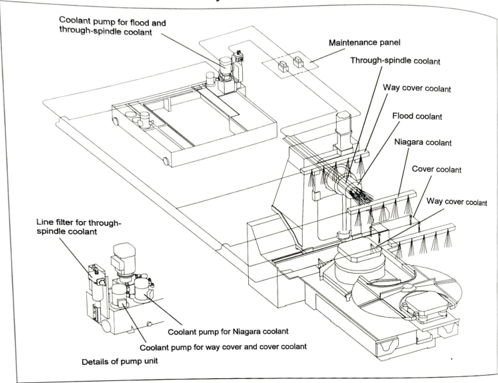

Document ID: 578
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "MAINTENANCE OF MAJOR UNITS" and a numerical value "5" in a box.

* The text "MAINTENANCE OF MAJOR UNITS" is displayed in a clean, sans-serif font.
	+ The text is centered within the image.
	+ It is presented in a light gray color on a white background.
* A box containing the number "5" is situated to the right of the text.
	+ The box is outlined in black and filled with white.
	+ The number "5" is centered within the box.

In summary, the image features a straightforward design with prominent text and a numerical value enclosed in a box. The use of contrasting colors against a plain background ensures clear visibility of the information.
Image:


Document ID: 579
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a system, likely for a mechanical or industrial application. The drawing is rendered in black and white, with a focus on clarity and precision.

**Key Features:**

* **Title and Number:** The title "Drawing No." is displayed in the top-right corner, accompanied by the number "2276CC0011". This suggests that the drawing is part of a larger document or project.
* **System Components:** The drawing depicts various components, including:
	+ A head
	+ A cover coolant
	+ An X axis way cover
	+ A pipe, assy
	+ A maintenance
	+ A coolant tank
* **Labels and Annotations:** The drawing includes labels and annotations to identify each component and its connections. These labels are written in a clear and concise manner, making it easy to understand the relationships between the different parts.
* **Hand and Thumb:** In the bottom-left corner, a hand and thumb are visible, suggesting that the drawi

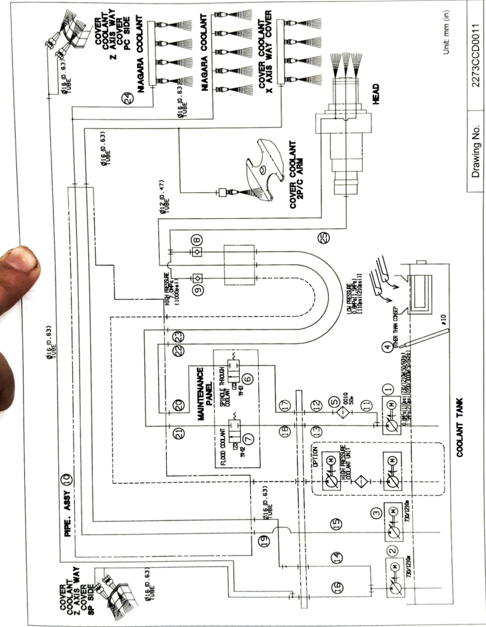

Document ID: 580
Source: /content/man1_merged.pdf
Content:
The image is a low-resolution, pixelated representation of the number 5 in a large font size. The number is centered within a rectangular box, with a thick gray border surrounding it. The background of the image is white.

Here are the key features of the image:

* **Number 5:**
	+ Large font size
	+ Centered within a rectangular box
	+ Pixelated and blurry due to low resolution
* **Rectangular Box:**
	+ Thick gray border
	+ Surrounds the number 5
* **Background:**
	+ White color

In summary, the image is a simple representation of the number 5 in a large font size, surrounded by a thick gray border within a rectangular box, set against a white background.
Image:


Document ID: 581
Source: /content/man1_merged.pdf
Content:
The image is a close-up of a fingernail, with the nail being the main focus of the photo. The nail is positioned on the left side of the image, and it is slightly angled to the right.

* Nail:
	+ Color: The nail has a warm, golden-brown color.
	+ Shape: The nail is oval-shaped, with a slight curve at the tip.
	+ Size: The nail appears to be relatively large, taking up most of the left side of the image.
* Background:
	+ Color: The background is a solid white color.
	+ Texture: The background appears to be smooth and flat.
* Lighting:
	+ Source: The lighting comes from the right side of the image, casting a shadow on the left side of the nail.
	+ Effect: The lighting creates a subtle gradient effect on the nail, with the lightest areas on the right side and the darkest areas on the left side.

Overall, the image provides a detailed view of the fingernail, highlighting its shape, color, and texture. The lighting adds depth and di

Document ID: 582
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a machine, accompanied by labels and annotations that highlight its various components. The diagram is divided into two sections, each featuring a different perspective of the machine.

**Diagram Components:**

*   **Y-axis way cover**
    *   Located at the top-left corner of the diagram
    *   Labels the area where the Y-axis passes through
*   **X-axis way cover**
    *   Positioned at the top-right corner of the diagram
    *   Indicates the region where the X-axis is situated
*   **Operator's door interlock**
    *   Situated at the top-right corner of the diagram, adjacent to the X-axis way cover
    *   Denotes the mechanism that prevents the operator's door from opening while the machine is in operation
*   **2-axis way cover**
    *   Located at the bottom-left corner of the diagram
    *   Labels the area where the 2-axis passes through
*   **Pallet changer safety cover and do

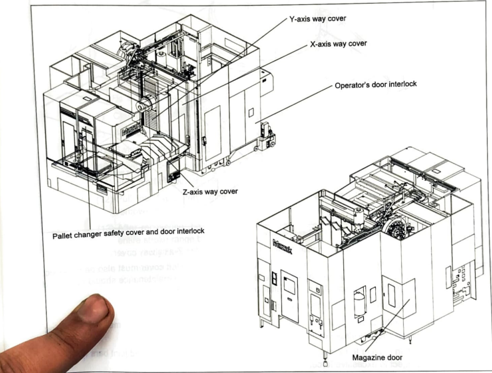

Document ID: 583
Source: /content/man1_merged.pdf
Content:
The image displays a large, blurry number "5" in the center of a white square. The number "5" is written in black font and takes up most of the space within the square. The background of the image is a light gray color, with a darker gray border around the edges. The overall effect is one of simplicity and focus on the central element, which is the number "5".
Image:


Document ID: 584
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet striking visual representation of the number 5 within a square frame. The prominent features of the image are:

* **Central Number:** A large, bold font displays the number 5 in black, centered within a square frame. The number is rendered in a sans-serif font, with a thick and dark outline that stands out against the white background.
* **Square Frame:** The square frame is outlined in a thin, light gray line, which provides a subtle contrast to the white background. This frame serves to contain the central number, creating a sense of focus and emphasis.
* **Background:** The background of the image is a clean and crisp white, which helps to highlight the central number and its surrounding frame. The simplicity of the background allows the viewer's attention to be drawn directly to the number 5.

Overall, the image effectively communicates the value of 5 through its clear and concise design. Th

Document ID: 585
Source: /content/man1_merged.pdf
Content:
The image displays a warning symbol in the shape of a triangle with an exclamation mark inside. The symbol is black and white, set against a white background.

*   The triangle is black and has a thick border.
    *   The triangle is evenly weighted on all sides.
    *   The triangle is not rotated or skewed.
*   Inside the triangle is an exclamation mark.
    *   The exclamation mark is black.
    *   The exclamation mark is centered within the triangle.
    *   The exclamation mark is outlined in black.
*   The background of the image is white.
    *   The background is plain and unadorned.
    *   There are no other symbols or markings on the background.

The image effectively conveys a sense of caution or warning, making it suitable for use in a variety of contexts where attention needs to be drawn to a potential hazard or risk.
Image:


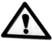

Document ID: 586
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a mechanical assembly, specifically focusing on the Z-axis way cover. The diagram is rendered in black and white, with various components labeled for clarity.

**Key Components:**

* **Z-axis way cover (left):** Located on the left side of the diagram, this component is represented by a rectangular shape with a curved top edge.
* **Z-axis:** A circular component situated at the center of the diagram, featuring an arrow pointing to the right and a label indicating its direction.
* **Spindle:** Positioned on the right side of the diagram, this component is depicted as a cylindrical shape with a flat top and bottom.
* **Bolt A:** A small rectangular component attached to the Z-axis way cover, labeled as "No. 1" and featuring an arrow pointing to the right.
* **Z-axis way cover (right):** Similar in shape to the left-hand cover, this component is located on the right side of the diagram.
* *

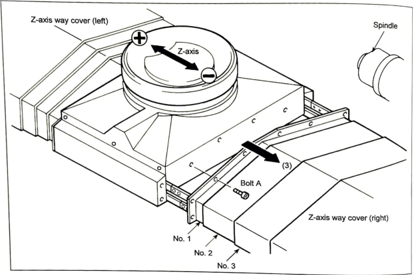

Document ID: 587
Source: /content/man1_merged.pdf
Content:
The image is a close-up photograph of a human thumb, with the thumbnail visible and the surrounding skin blurred.

The thumbnail is oval-shaped and appears to be clean and well-manicured. The skin surrounding the thumbnail is brown and has a few wrinkles, particularly on the side of the thumb closest to the camera. The background of the image is white, suggesting that it may be a product photo or a stock image.

Overall, the image presents a clear and detailed view of a human thumb, with a focus on the thumbnail and the surrounding skin. The use of a white background helps to highlight the details of the thumb and creates a clean and minimalist aesthetic.
Image:


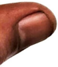

Document ID: 588
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet striking visual representation of the number 5 within a square box. Here is the breakdown of the image's components:

* **Number 5**
	+ The number 5 is prominently displayed in the center of the image.
	+ It is rendered in a bold, dark gray font that stands out against the lighter background.
	+ The numeral is positioned slightly off-center to the left, creating a sense of balance and harmony in the composition.
* **Square Box**
	+ A thin, dark gray border surrounds the number 5, forming a square box.
	+ The box is slightly larger than the number itself, creating a sense of containment and framing.
	+ The box's border is uniform in thickness and does not have any rounded corners, giving it a clean and precise appearance.
* **Background**
	+ The background of the image is a solid, light gray color.
	+ The background is plain and unadorned, allowing the number 5 and the square box to take center s

Document ID: 589
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a mechanical component, likely from an engineering or manufacturing context. The drawing is titled "the direction indicated by the arrow symbol (→)" and features a detailed illustration of the component's components and their relationships.

**Key Components:**

* **Bolt C**: A bolt labeled "Bolt C" is shown in the top-left corner of the drawing.
* **Spindle**: A spindle is depicted in the top-right corner of the drawing.
* **Z-axis way cover (left)**: A z-axis way cover is illustrated in the bottom-left corner of the drawing.
* **(11)**: A black arrow points to a specific part of the component, labeled "(11)".
* **No. 1, No. 2, No. 3**: Three numbers are labeled on the component, indicating different parts or sections.

**Visual Elements:**

* The drawing is rendered in black lines on a white background, providing clear contrast and visibility.
* The use of arrows and labels helps to c

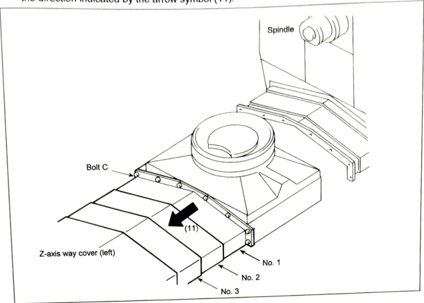

Document ID: 590
Source: /content/man1_merged.pdf
Content:
The image is a close-up of a finger, with the tip pointing towards the top right corner. The finger is positioned at an angle, with the thumb on the left side of the image and the palm facing downwards.

*   **Finger:**
    *   The finger is pinkish-white in color.
    *   It has a small, rounded nail that is also pinkish-white.
    *   The skin around the nail bed is slightly darker than the rest of the finger.
    *   The finger is positioned at an angle, with the thumb on the left side of the image and the palm facing downwards.
*   **Background:**
    *   The background is white.
    *   There are some faint, illegible black text marks on the right side of the image.

Overall, the image appears to be a close-up shot of a person's finger, possibly taken for medical or scientific purposes.
Image:


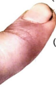

Document ID: 591
Source: /content/man1_merged.pdf
Content:
The image presents a close-up view of a metal object, with a focus on its surface and a label indicating the presence of countersunk head screws.

* The metal object is predominantly silver in color, featuring a smooth, reflective surface.
	+ The object appears to be made of a single piece of metal, with no visible seams or joints.
	+ The surface is relatively flat, with some subtle curvature evident along the edges.
* A label is placed near the center of the object, drawing attention to the countersunk head screws.
	+ The label is rectangular in shape and white in color, with black text that reads "Countersunk head screws".
	+ The label is positioned near the center of the object, allowing for clear visibility and emphasis on the screws.
* The background of the image is predominantly white, providing a clean and neutral contrast to the metal object.
	+ The white background helps to highlight the details of the metal object, ma

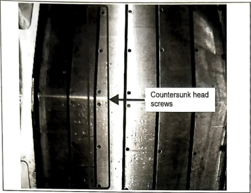

Document ID: 592
Source: /content/man1_merged.pdf
Content:
The image is a technical diagram that shows the components of a wiper assembly and how they fit together. The diagram is divided into two sections: the top-left section shows a close-up view of the wiper assembly, while the bottom-right section provides a detailed illustration of the individual parts.

* **Wiper Assembly (Top-Left Section)**
	+ A close-up view of the wiper assembly
	+ The assembly consists of several metal pieces that are connected by screws or rivets
	+ The wiper blades are attached to the metal frame using clips or brackets
* **Individual Parts (Bottom-Right Section)**
	+ Wiper blade
	+ Wiper arm
	+ Wiper motor
	+ Wiper cover
	+ Wiper stop plate
	+ Wiper protector
* **Assembly Process**
	+ The wiper blade is attached to the wiper arm using a clip or bracket
	+ The wiper arm is attached to the wiper motor using a screw or rivet
	+ The wiper motor is attached to the wiper cover using a screw or rivet
	+ The wip

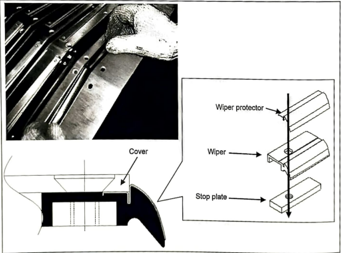

Document ID: 593
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a door's internal mechanism, comprising several components labeled with arrows pointing to specific parts. The diagram is divided into two sections: the left side features a close-up view of the door's surface, while the right side provides a more extensive view of the door's interior.

**Components and Labels**

*   **X-axis way cover**: A rectangular box situated on the left side of the image, adjacent to the door's surface.
*   **Stop plate**: A small, circular object located at the center of the door, near the X-axis way cover.
*   **Bolt**: A long, thin rod extending from the X-axis way cover to the right side of the image, labeled "Bolt."
*   **Nut**: A small, circular object attached to the end of the bolt, labeled "Nut."
*   **Wiper**: A small, rectangular piece positioned between the bolt and nut, labeled "Wiper."

**Visual Elements**

*   **Arrow**: A white arrow pointing to th

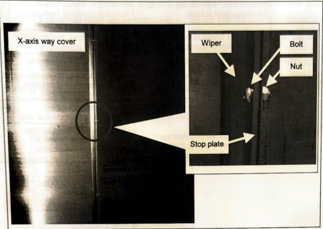

Document ID: 594
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a wiper and its fixed cover, accompanied by instructions for mounting the wiper without extending beyond the fixed cover edge. The diagram is set against a white background and features black text and lines.

*   **Wiper**
    *   The wiper is positioned at the top left of the image, with an arrow pointing to it labeled "Wiper."
    *   A curved line extends from the wiper, indicating its movement.
*   **Fixed Cover**
    *   The fixed cover is situated at the top right of the image, with an arrow pointing to it labeled "Fixed cover."
    *   A straight line connects the fixed cover to the wiper, illustrating their relationship.
*   **Mounting Instructions**
    *   At the bottom left of the image, black text provides instructions for mounting the wiper: "Mount the wiper so that it will not extend from the fixed cover edge."
    *   A small arrow points to the wiper, emphasizing the imp

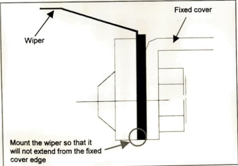

Document ID: 595
Source: /content/man1_merged.pdf
Content:
The image depicts a blurry, pixelated number 5 within a square box. The number is centered and appears to be in black font against a white background.

*   **Number 5:**
    *   The number 5 is the main focus of the image.
    *   It is displayed in a large, bold font.
    *   The number is centered within the square box.
*   **Square Box:**
    *   The square box serves as the container for the number 5.
    *   It has a thick gray border that surrounds the white background.
    *   The box is slightly larger than the number 5, providing a clear visual distinction between the two elements.
*   **Background:**
    *   The background of the image is a solid gray color.
    *   It provides a neutral and subtle backdrop for the number 5 and the square box.

In summary, the image features a prominent number 5 within a square box, set against a gray background. The design is simple yet effective in drawing attention to the central e

Document ID: 596
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet striking visual composition. At its center is a large black numeral "5" set against a white background, framed by a thin black border. The numeral itself is rendered in bold, sans-serif font, with a subtle shadow effect that adds depth and dimensionality to the design.

*   **Numerical "5"**
    *   Color: Black
    *   Font: Sans-serif
    *   Shadow effect: Subtle
*   **Background**
    *   Color: White
*   **Border**
    *   Color: Black
    *   Thickness: Thin

The overall effect of the image is one of simplicity and elegance, with the bold numeral standing out against the clean white background. The use of a thin black border adds a touch of sophistication, making the image feel both modern and classic at the same time.
Image:


Document ID: 597
Source: /content/man1_merged.pdf
Content:
The image is a simple, gray-scale representation of the number 5 within a square border. The purpose of the image appears to be a basic numerical symbol or icon.

* A square with a number inside it:
	+ The square is a solid gray color.
	+ It has a thin gray border around it.
	+ The number 5 is centered inside the square.
* The number is 5:
	+ It is written in a large, dark gray font.
	+ The font is sans-serif and bold.
	+ The number is aligned centrally within the square.
* The background is light gray:
	+ It provides a subtle contrast to the darker gray of the square and number.
	+ The light gray tone helps the image blend into the surrounding environment.

The main focus of the image is the number 5, which is prominently displayed within the square border. The use of a light gray background and a bold, dark gray font for the number creates a clear and readable visual representation.
Image:


Document ID: 598
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram, likely from an instruction manual or repair guide, featuring various components and labels. The diagram is divided into two sections: a larger section on the right and a smaller section on the left.

* **Larger Section:**
	+ A vertical rectangle with horizontal lines and dots, accompanied by the label "Switch" to its right.
	+ A series of symbols, including circles, rectangles, and lines, are arranged vertically within the rectangle.
	+ The numbers "QF11," "33," and "13" are written above the rectangle.
* **Smaller Section:**
	+ A horizontal rectangle with a circular symbol and a line extending from it to the left.
	+ The label "Reset button" is placed to the left of the rectangle.
	+ The combination "FR15, 16" is written above the rectangle.
* **Additional Labels:**
	+ The numbers "QF11," "33," and "13" are repeated at the top of the image.
	+ The labels "Reset button" and "Switch" are p

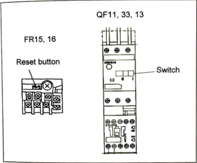

Document ID: 599
Source: /content/man1_merged.pdf
Content:
The image displays a black and white text box with the number "5" in it, accompanied by a label that reads "MAINTENANCE OF MAJOR UNITS".

*   The text box is a small, rectangular shape with a thin black border. It is positioned in the top-left corner of the image.
    *   Inside the text box, there is a large black numeral "5".
*   Below the text box, there is a line of text that reads "MAINTENANCE OF MAJOR UNITS".
    *   The text is written in a simple, sans-serif font and is aligned to the left side of the image.
    *   The text is also black in color, matching the border of the text box.
*   The background of the image is plain white, providing a clean and neutral backdrop for the text box and label.

In summary, the image features a simple yet effective design, with a prominent text box containing the number "5" and a label that provides additional context. The use of a plain white background helps to draw attention to th

Document ID: 600
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a mechanical system, featuring various components and labels. The diagram is composed of black lines on a white background, with the components and labels displayed in black text.

*   **Sensor Cable**
    *   Located at the top of the diagram
    *   Labeled as "Sensor cable"
*   **Proximity Sensor**
    *   Positioned below the sensor cable
    *   Identified as "Proximity sensor"
*   **Gap: 1.0 - 1.3 mm (0.04 - 0.05 in)**
    *   Indicated by an arrow pointing to the proximity sensor
    *   Specifies the gap between the proximity sensor and the nut B
*   **Dog**
    *   Situated at the bottom-left corner of the diagram
    *   Labeled as "Dog"
*   **Nut B**
    *   Located below the proximity sensor
    *   Identified as "Nut B"
*   **Washer**
    *   Positioned between the nut B and the dog
    *   Labeled as "Washer"
*   **Bracket**
    *   Situated above the nut A
    *   Identif

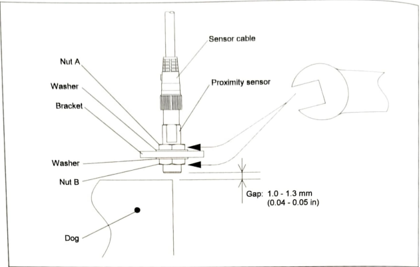

Document ID: 601
Source: /content/man1_merged.pdf
Content:
The image is a close-up of a finger, with the thumbnail prominently displayed.

*   The thumbnail is a light pink color.
    *   The thumbnail is in sharp focus, while the rest of the image is blurred.
    *   The thumbnail is positioned at an angle, with the tip pointing towards the top-left corner of the image.
    *   The thumbnail is surrounded by a small amount of skin, which is also light pink in color.
*   The fingernail is well-groomed and appears to be healthy.
    *   There are no visible signs of damage or discoloration on the thumbnail.
    *   The thumbnail is smooth and even, with no visible ridges or imperfections.
*   The background of the image is white.
    *   The white background helps to highlight the thumbnail and create a clean and simple visual effect.

In summary, the image is a close-up of a finger, with the thumbnail being the main focus of the image. The thumbnail is light pink in color, well-groomed

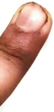

Document ID: 602
Source: /content/man1_merged.pdf
Content:
The image displays a simple, low-resolution icon of the number 5 within a square box. The number 5 is centered in the image and is displayed in a large, dark gray font. The number is contained within a square box that has a thin, dark gray border. The background of the image is white, providing a clean and neutral contrast to the dark gray number and border. Overall, the image appears to be a simple graphic or icon used to represent the number 5 in a digital or printed context.
Image:


Document ID: 603
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of an LED light, accompanied by labels and annotations that provide detailed information about its components and functionality.

*   **LED Light**
    *   The LED light is the central focus of the image.
    *   It features a rectangular shape with rounded edges.
    *   A cylindrical protrusion is visible at one end of the LED light.
    *   The LED light is depicted in black lines on a white background.
*   **Labeling and Annotations**
    *   The label "LED" is positioned near the top-right corner of the image.
    *   A line extends from the label to the LED light, indicating the location of the component.
    *   An "A" is labeled near the bottom-left corner of the image.
    *   Two lines extend from the label "A", one pointing to the LED light and another pointing to the cylindrical protrusion.
*   **Background and Border**
    *   The background of the image is white.
    *   A th

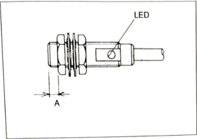

Document ID: 604
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated icon of a square with a smaller square inside it. The icon is likely a symbol or logo used to represent something, but the blurriness makes it difficult to discern any specific details.

Here are the main points about the image:

• **Icon Shape**: The icon is a square shape with rounded corners.
• **Inner Square**: Inside the square is a smaller square that is also pixelated and blurry.
• **Pixelation**: The entire icon is heavily pixelated, making it challenging to make out any distinct features.
• **Background**: The background of the image is plain white, which helps the icon stand out but also contributes to the overall blurriness.

Overall, the image appears to be a low-resolution representation of an icon or symbol, but the lack of clarity makes it difficult to determine its purpose or meaning.
Image:


Document ID: 605
Source: /content/man1_merged.pdf
Content:
The image presents a black circle with a white book icon, set against a white background. The book icon is positioned centrally within the circle, featuring a simple yet distinctive design.

*   **Black Circle:**
    *   The circle is solid black, providing a striking contrast to the white background.
    *   It serves as the primary visual element, drawing attention to the book icon within.
*   **White Book Icon:**
    *   The icon depicts a book with a rectangular shape and two covers.
    *   The book is oriented vertically, with the covers facing outward.
    *   The icon is rendered in white, creating a clean and crisp appearance against the black circle.
*   **White Background:**
    *   The background of the image is a plain white color.
    *   It provides a neutral backdrop for the black circle and white book icon.
    *   The white background helps to create a sense of simplicity and minimality.

In summary, the image

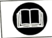

Document ID: 606
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated icon that appears to be a button or other interactive element. Here are the details of the image:

* The icon is rectangular with rounded corners.
* It has a thick black border around it.
* Inside the icon, there is a gray square with a smaller black square inside it.
* The smaller black square has an "X" shape in the middle, with two lines that cross over each other.
* The background of the image is white.

Overall, the image appears to be a simple graphic design element, possibly used as a button or toggle switch in an application or website. However, due to the blurriness and pixelation of the image, it is difficult to determine its exact purpose or function.
Image:


Document ID: 607
Source: /content/man1_merged.pdf
Content:
The image is a simple, low-resolution graphic of the number 5.

* The number 5 is displayed in the center of the image.
	+ It is a large, dark gray font with a thick outline.
	+ The font is sans-serif and appears to be a standard font, possibly Arial or Helvetica.
* The number is contained within a square box.
	+ The box has a thick gray border around it.
	+ The box is slightly larger than the number itself, leaving a small margin around the edges.
* The background of the image is white.

The image is a simple, straightforward representation of the number 5, with a clean and modern aesthetic.
Image:


Document ID: 608
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a mechanical device, likely used in an industrial or manufacturing setting. The device is depicted in black and white, with various components labeled.

*   **Tool length measuring arm extend end sensor**
    *   Located on the left side of the image.
    *   A long, thin rod with a sensor at the end.
    *   The sensor is connected to a box with a label that reads "Tool length measuring arm extend end sensor."
*   **Air cylinder**
    *   Positioned on the right side of the image.
    *   A cylindrical component with a label that reads "Air cylinder."
    *   The air cylinder appears to be connected to the tool length measuring arm extend end sensor.

The diagram provides a detailed view of the device's components, highlighting their relationships and functions. The inclusion of labels and annotations suggests that the image is intended for instructional or educational purposes, helpin

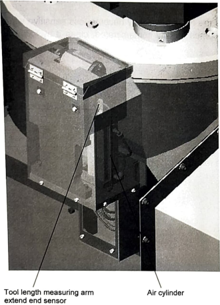

Document ID: 609
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a tool length measuring arm, with labels and arrows pointing to various components. The diagram is titled "Tool length measuring arm extend" and features a black-and-white photograph of the device, accompanied by labels and arrows that highlight its different parts.

* **Skip sensor**: Located at the top of the device, the skip sensor is labeled with a black arrow pointing to it.
	+ Function: The skip sensor is responsible for detecting the presence of a tool or object in the measuring arm's path.
	+ Characteristics: The skip sensor is depicted as a small, rectangular box with a sensor protruding from it.
* **Deceleration sensor**: Situated below the skip sensor, the deceleration sensor is labeled with a black arrow pointing to it.
	+ Function: The deceleration sensor monitors the deceleration of the measuring arm as it approaches a target.
	+ Characteristics: The deceleration sensor app

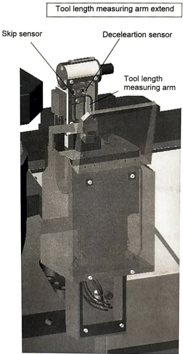

Document ID: 610
Source: /content/man1_merged.pdf
Content:
The image depicts a large, gray number "5" on a white background, surrounded by a gray border. The number is centered in the image and takes up most of the space. It is written in a large, bold font and has a slight shadow effect around it, giving it a 3D appearance. The background of the image is white, with a gray border around the edges. The border is thicker at the top and bottom than it is on the left and right sides. The overall effect of the image is one of simplicity and clarity, with the large number standing out against the plain background.
Image:


Document ID: 611
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a machine, likely used for instructional or educational purposes. The drawing is divided into two sections, each featuring a detailed diagram of the machine's components and their corresponding labels.

* **Left Section:**
	+ A small inset image labeled "Joint arm" is positioned at the bottom left corner.
	+ A larger image of the machine's component, labeled "Cover," is situated above the inset image.
	+ A label pointing to the component reads "Bolt [3]".
* **Right Section:**
	+ A larger image of the machine's component, labeled "Plate," is positioned at the top right corner.
	+ A smaller image of the machine's component, labeled "Joint pin," is situated below the larger image.
	+ A label pointing to the component reads "Bolt [1]".
* **Bottom Section:**
	+ A small inset image labeled "Joint pin" is positioned at the bottom right corner.
	+ A larger image of the machine's component, labe

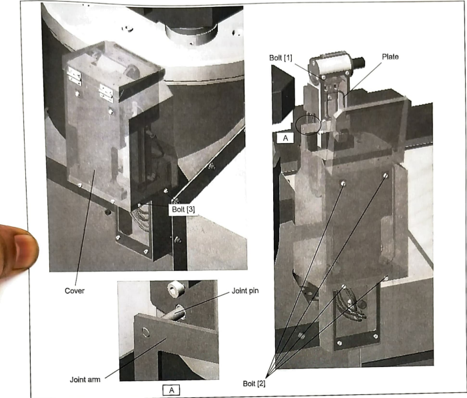

Document ID: 612
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the number 5 in it, accompanied by the words "MAINTENANCE OF MAJOR UNITS" below it.

*   The text box is a small, thin rectangle with a thin black border and a white interior. It is positioned in the top-left corner of the image.
*   Inside the text box, the number 5 is displayed in bold, black font. The number is centered within the box.
*   Below the text box, the words "MAINTENANCE OF MAJOR UNITS" are written in a smaller, thinner black font. The text is left-aligned and spans the width of the image.

The image appears to be a slide or title card from a presentation, possibly related to maintenance or repair procedures for major units. The use of a simple text box and bold font suggests a straightforward and easy-to-read design.
Image:


Document ID: 613
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "WARNING" below it. The purpose of this image is to convey a sense of caution or alertness.

* **Triangle:**
	+ Shape: Equilateral triangle
	+ Color: Black outline with a white interior
	+ Size: Occupies most of the image
* **Exclamation Mark:**
	+ Location: Inside the triangle
	+ Orientation: Vertical
	+ Color: Black
* **Text:**
	+ Word: "WARNING"
	+ Font: Simple, sans-serif font
	+ Color: Black
	+ Size: Smaller than the triangle

In summary, the image effectively conveys a warning message through its simple yet attention-grabbing design. The use of a triangle and exclamation mark creates a sense of urgency, while the text "WARNING" clearly communicates the intended message.
Image:


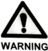

Document ID: 614
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a mechanical component, likely a part of a machine or device. The drawing is rendered in black lines on a white background, with no additional colors present.

*   **Background**
    *   The background is white.
*   **Lines and Shapes**
    *   The drawing features various lines and shapes, including straight lines, curves, and geometric shapes like circles and rectangles.
    *   Some lines are solid, while others are dashed or dotted.
    *   The lines vary in thickness and style, indicating different levels of importance or detail in the drawing.
*   **Text**
    *   There is no text present in the drawing.
*   **Symbols and Markings**
    *   Various symbols and markings are scattered throughout the drawing, including arrows, circles, and other geometric shapes.
    *   These symbols likely represent specific components or features within the mechanical system being depicted.

In su

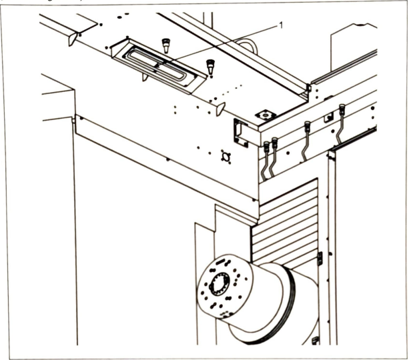

Document ID: 615
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular text box with a prominent number "5" displayed in its center. The box is outlined by a thin black line, and the number is rendered in a bold, black font.

**Key Features:**

* **Text Box:** A rectangular box with a thin black outline.
* **Number "5":** A bold, black font displaying the number "5" in the center of the box.
* **Background:** A white background that provides a clean and neutral contrast to the black text and outline.
* **Border:** A thin black border surrounds the entire image, adding a subtle frame to the overall design.

**Visual Representation:**

The image effectively conveys a clear and concise message, with the number "5" being the focal point. The simple yet striking design makes it easy to focus on the central element, making it suitable for various applications where a straightforward and attention-grabbing visual cue is required.
Image:


Document ID: 616
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated representation of the number 5. The number is centered in the image and appears to be in a large font size. It is displayed on a white background with a thin gray border around it. The number is slightly out of focus, giving it a soft and fuzzy appearance. The overall effect is one of simplicity and minimalism, with the bold black number standing out against the clean white background.
Image:


Document ID: 617
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of the back side of a device, showcasing its various components and labels. The diagram is set against a white background, providing a clear visual representation of the device's internal structure.

* **Front side**
	+ Located at the top-left corner of the diagram
	+ Labeled as "Front side"
* **Back side**
	+ Occupies most of the diagram
	+ Labeled as "Back side"
* **Mounting bolts (8 places)**
	+ Positioned on the left side of the diagram
	+ Labeled as "Mounting bolts (8 places)"
	+ Consist of eight bolts arranged in a straight line
* **LED light section**
	+ Situated in the center of the diagram
	+ Labeled as "LED light section"
	+ Comprises a long, horizontal strip with a flat top and a curved bottom
* **Connector (connection section)**
	+ Located on the right side of the diagram
	+ Labeled as "Connector (connection section)"
	+ Features a rectangular shape with a circular hole at the t

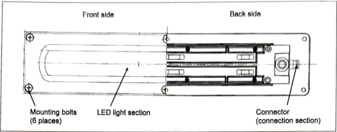

Document ID: 618
Source: /content/man1_merged.pdf
Content:
The image displays a warning message on a white background with black text. The text is contained within a thin black rectangle with rounded corners, which is also outlined in black.

*   **Text:**
    *   The text reads "012 SERVO BATTERY WARNING (&00000001, &0003, )".
    *   It is written in all capital letters.
*   **Rectangle:**
    *   The rectangle is thin and has rounded corners.
    *   It is outlined in black.
    *   It contains the text, which is centered within it.

The image appears to be a warning message related to a servo battery, indicating that there may be an issue with the battery or its connection.
Image:


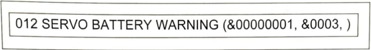

Document ID: 619
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a battery unit, likely intended for use in an engineering or manufacturing context. The drawing is rendered in black and white, with the battery unit depicted in a detailed and precise manner.

* **Battery Unit**
	+ The battery unit is shown from an isometric perspective, providing a three-dimensional view of its components.
	+ The unit is comprised of several modules, each with its own distinct features and connections.
	+ The modules are connected by wires and cables, forming a complex network that powers the system.
* **Modules**
	+ Each module is rectangular in shape and has a flat top surface.
	+ The modules vary in size, with some being larger than others.
	+ Some modules have additional components attached to their sides, such as vents or connections.
* **Connections and Wiring**
	+ The modules are connected by a network of wires and cables.
	+ The wires are thin and appear to be

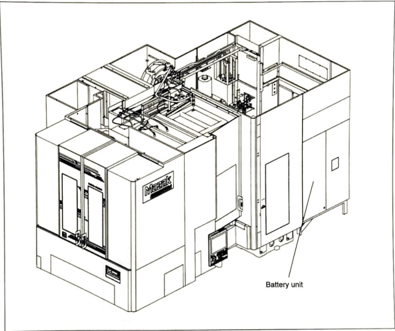

Document ID: 620
Source: /content/man1_merged.pdf
Content:
The image is a simple, low-resolution photograph of the number 5 in a white box with a gray border. 

* The number 5 is displayed in the center of the image.
	+ It is written in large, dark gray font.
	+ The number is enclosed within a white box.
	+ The box has a thin, gray border around it.
	+ The background of the image is not visible due to the white box.

The image appears to be a simple graphic or icon, possibly used as a placeholder or in a digital interface.
Image:


Document ID: 621
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a device with a warning caption, set against a white background. The diagram is rendered in black and white, featuring a square device with a rectangular section at its bottom.

**Key Features:**

* **Device:** A square device with a rectangular section at its bottom.
* **Screws:** Four screws are visible on the device, with two at the top and two at the bottom.
* **Warning Caption:** The caption reads, "The cover can be taken off after removing the four screws."
* **Background:** The image has a white background.

**Visual Representation:**

The diagram provides a clear visual representation of the device's design and the location of the screws. The warning caption serves as a reminder to the user to take necessary precautions when handling the device.

**Conclusion:**

The image effectively communicates the technical information related to the device, providing a clear and concise vis

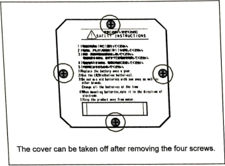

Document ID: 622
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an alkaline battery and its terminals, accompanied by labels that provide information about the positive and negative terminals.

*   The diagram features:
    *   A square-shaped battery with four circular terminals.
    *   The terminals are arranged in a 2x2 grid, with two terminals on each side.
    *   The top-left terminal is labeled "Plus terminal at the near side."
    *   The top-right terminal is labeled "Minus terminal at the near side."
    *   The bottom-left terminal is labeled "Minus terminal at the near side."
    *   The bottom-right terminal is labeled "Plus terminal at the near side."
    *   The battery is labeled "Alkaline battery" below it.
*   The diagram is set against a white background with a thin black border.

The diagram effectively illustrates the configuration of the alkaline battery's terminals, providing a clear understanding of the positive and negative

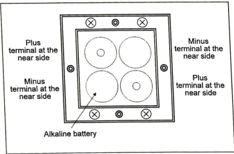

Document ID: 623
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a gray border and a white interior. Within the box, a large black numeral "5" is prominently displayed.

*   The numeral "5" is rendered in a bold, black font.
    *   It is centered within the box.
    *   The numeral is large, occupying most of the space within the box.
*   The box itself has a gray border.
    *   The border is thin and surrounds the entire box.
    *   The color of the border is a medium to light gray.
*   The background of the image is plain white.
    *   It provides a clean and neutral backdrop for the box and its contents.
    *   There are no other elements or markings on the background.

In summary, the image features a large, centered numeral "5" within a gray-bordered, white box, set against a plain white background.
Image:


Document ID: 624
Source: /content/man1_merged.pdf
Content:
The image presents a warning symbol, comprising a triangle with an exclamation mark inside it. The triangle is outlined in black and has a white interior, while the exclamation mark is also black. The background of the image is white.

*   **Triangle:**
    *   Outlined in black
    *   White interior
    *   Black exclamation mark inside
*   **Exclamation Mark:**
    *   Black color
    *   Located inside the triangle
*   **Background:**
    *   White color

The warning symbol is likely used to alert individuals of potential danger or caution. The use of a triangle and exclamation mark is a common visual representation of warning or caution in various contexts, such as road signs, safety labels, and hazard indicators.
Image:


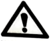

Document ID: 625
Source: /content/man1_merged.pdf
Content:
The image presents a close-up view of the tip of a finger, featuring a thumb. The thumb is positioned on the left side of the image, with its tip pointing towards the top-right corner. The thumbnail is small and oval-shaped, with a smooth, rounded surface.

The thumbnail is a light brown color, with a subtle sheen that suggests it has been polished or oiled. The surrounding area is white, providing a clean and neutral background that allows the thumbnail to take center stage.

Overall, the image appears to be a product photo or a close-up shot for a website or catalog, showcasing the thumbnail as the main subject. The simple yet elegant composition highlights the beauty and uniqueness of the thumbnail, making it an attractive and eye-catching visual.
Image:


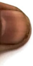

Document ID: 626
Source: /content/man1_merged.pdf
Content:
The image displays a simple, black-and-white graphic with the text "INSTALLATION 6" in the center. The purpose of this image is unclear, but it may be used as a placeholder or a label for an installation or project.

* Text:
	+ The word "INSTALLATION" is written in large, bold, black font to the left of the number "6".
	+ The text is centered and takes up most of the width of the image.
* Number:
	+ The number "6" is written in a large, bold, black font inside a small, square box.
	+ The box is outlined in black and is positioned to the right of the word "INSTALLATION".
* Background:
	+ The background of the image is a solid light gray color.
	+ There are no other design elements or patterns on the background.

Overall, the image is a straightforward and simple graphic that effectively conveys the text "INSTALLATION 6". There are no significant changes or comparisons to note in this image.
Image:


Document ID: 627
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet clear, visual representation of a numbered item. The text "6 INSTALLATION" is prominently displayed, with the number "6" enclosed in a square box on the left side of the image and the word "INSTALLATION" positioned to the right.

Here is a detailed breakdown of the image:

*   **Number 6**
    *   Located in a square box
    *   Positioned on the left side of the image
    *   Enclosed in a square box
*   **Text**
    *   Reads "INSTALLATION"
    *   Positioned to the right of the number 6
    *   Written in a clear, easy-to-read font

In summary, the image effectively communicates the presence of a numbered item, specifically item number 6, which is related to installation. The use of a square box around the number adds a touch of visual interest and helps to draw attention to the important information. Overall, the image is well-designed and easy to understand at a glance.
Image:


Document ID: 628
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign with the word "CAUTION" written below it, set against a white background. The sign is depicted in black and white, featuring a triangle shape with an exclamation mark inside. The text "CAUTION" is displayed in all capital letters, also in black.

**Key Features:**

* **Triangle Sign:** A warning sign in the shape of a triangle, with a black outline and a white interior.
* **Exclamation Mark:** A black exclamation mark is centered within the triangle, serving as a visual indicator of caution.
* **Text "CAUTION":** The word "CAUTION" is written in all capital letters below the triangle, using the same black color as the sign.
* **Background:** The background of the image is white, providing a clean and neutral contrast to the black and white sign and text.

**Overall Impression:**
The image effectively conveys a sense of caution or warning, making it suitable for use in various contexts where att

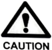

Document ID: 629
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangle with an exclamation mark inside and the word "WARNING" below it. The sign is likely used to alert individuals to potential hazards or risks.

*   **Triangle:**
    *   The triangle is equilateral, with all sides of equal length.
    *   It has a solid black outline.
    *   The triangle is centered in the image, with its apex pointing upwards.
*   **Exclamation Mark:**
    *   The exclamation mark is a stylized representation, with a rounded top and a pointed bottom.
    *   It is positioned inside the triangle, near the center.
    *   The exclamation mark is also black, matching the color of the triangle's outline.
*   **Text:**
    *   The word "WARNING" is written in all capital letters.
    *   It is positioned below the triangle, centered horizontally.
    *   The text is in a bold, sans-serif font.
    *   The color of the text is also black, matching the color sche

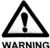

Document ID: 630
Source: /content/man1_merged.pdf
Content:
The image displays a warning sign with the word "CAUTION" below it. The warning sign is in the shape of a triangle, with an exclamation mark inside of it.

* A warning sign is in the shape of a triangle:
	+ The triangle is dark gray and has a thick outline.
	+ The triangle is centered in the image.
* The warning sign has an exclamation mark inside of it:
	+ The exclamation mark is also dark gray.
	+ The exclamation mark is located inside the triangle, near the center.
* The word "CAUTION" is written below the warning sign:
	+ The word "CAUTION" is written in all capital letters.
	+ The text is dark gray and is aligned to the left.

The image effectively conveys a sense of warning or caution, and the use of a triangle and exclamation mark is a common visual cue for indicating danger or risk.
Image:


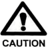

Document ID: 631
Source: /content/man1_merged.pdf
Content:
The image presents a simple, monochromatic design featuring the word "INSTALLATION" in black text on a white background.

At the center of the image, the word "INSTALLATION" is displayed in a clear, sans-serif font, with each letter aligned to the left. To the right of the text, a square box contains the number "6" in bold, black text, outlined by a thin black border. The image's background is a clean white, providing a neutral backdrop for the prominent text and box.

The overall aesthetic of the image is straightforward and functional, suggesting it may be used as a label or identifier for a specific purpose. The use of a single color scheme and simple typography contributes to a sense of clarity and focus.
Image:


Document ID: 632
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet clear, visual representation of the word "INSTALLATION" accompanied by a number 6 in a square box. The text is displayed in a dark gray font against a white background.

*   **Text:**
    *   The word "INSTALLATION" is written in a dark gray font.
    *   It is positioned on the left side of the image.
    *   The text is aligned to the left.
*   **Number 6:**
    *   A number 6 is enclosed in a square box.
    *   The number is also displayed in a dark gray font.
    *   The box is outlined in black and has a thin border.
    *   The number is positioned on the right side of the image.
    *   The number is aligned to the right.
*   **Background:**
    *   The background of the image is white.

In summary, the image features the word "INSTALLATION" alongside the number 6 in a square box, both in dark gray font against a white background.
Image:


Document ID: 633
Source: /content/man1_merged.pdf
Content:
The image presents a simple, text-based graphic with the phrase "INSTALLATION" accompanied by a numerical value in a box.

* The text "INSTALLATION" is displayed in lowercase letters and centered within the image.
	+ The font used for the text is plain, sans-serif, and black.
	+ The text is positioned horizontally, taking up half of the image's width.
* A numerical value "6" is enclosed in a box located in the upper-left corner of the image.
	+ The box is rectangular and has a thin black outline.
	+ The numerical value "6" is centered both horizontally and vertically within the box.
	+ The font used for the number is the same as that used for the word "INSTALLATION".
* The background of the image is white, providing a clean and neutral backdrop for the text and box.

In summary, the image features a prominent display of the word "INSTALLATION" alongside a numerical value "6" within a box, set against a white background.
Image:


Document ID: 634
Source: /content/man1_merged.pdf
Content:
The image presents a simple, text-based graphic with the word "INSTALLATION" and the number 6 in a box. The purpose of this image is likely to serve as a label or identifier for an installation or project.

* The word "INSTALLATION" is written in all capital letters:
	+ It is positioned on the left side of the image.
	+ It is written in a dark gray color.
* A number 6 is inside a box:
	+ The box is a thin, dark gray rectangle.
	+ The number 6 is centered within the box.
	+ The box is located on the right side of the image, adjacent to the word "INSTALLATION".

In summary, the image features a clear and concise label that includes both the word "INSTALLATION" and the number 6 in a box, suggesting its use as a identifier for an installation or project.
Image:


Document ID: 635
Source: /content/man1_merged.pdf
Content:
The image displays a simple, text-based graphic with the number "6" and the word "INSTALLATION" in black font against a white background. The number "6" is enclosed in a small square with a thin black border.

*   The number "6":
    *   Located in the top-left corner of the image
    *   Enclosed in a small square with a thin black border
    *   Displayed in a large, bold font
*   The word "INSTALLATION":
    *   Positioned below the number "6"
    *   Written in a smaller font than the number "6"
    *   Also displayed in black text
*   The background:
    *   A solid white color

The image appears to be a simple label or icon, possibly used to indicate a specific step or process in a larger system or workflow. The use of a bold font for the number "6" suggests that it may be a key or important element in the process. Overall, the image is straightforward and easy to read, making it suitable for use in a variety of contexts.

Document ID: 636
Source: /content/man1_merged.pdf
Content:
The image presents two technical drawings of a machine, accompanied by measurements and labels. The purpose of the image is to provide a detailed representation of the machine's design and specifications.

* **Top Drawing:**
	+ A rectangular box with a smaller rectangle inside, representing the machine's main body and internal components.
	+ Measurements: 3483 (137.52) on the top and sides, indicating the machine's dimensions.
	+ Label: "Quick" in the center of the smaller rectangle, suggesting a quick or rapid process.
* **Bottom Drawing:**
	+ A larger rectangular box with various components, including a smaller rectangle, rectangle with a square in the middle, and rectangle with a circle in the middle.
	+ Measurements: 5770 (227.17) on the top and sides, indicating the machine's dimensions.
	+ Label: "Quick" in the center of the smaller rectangle, consistent with the top drawing.
* **Additional Labels:**
	+ "Unit: mm (in)" at

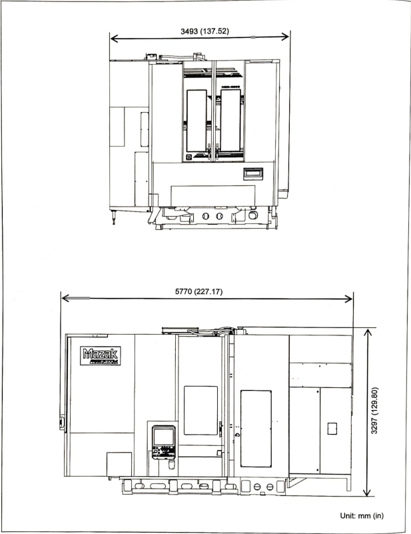

Document ID: 637
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign with a triangle and an exclamation mark, accompanied by the word "CAUTION" in bold letters. The sign is depicted in black on a white background, creating a striking visual effect.

*   **Triangle Warning Sign:**
    *   The triangle is equilateral, with a solid black outline.
    *   Inside the triangle, there is a black exclamation mark.
    *   The exclamation mark is centered within the triangle.
*   **CAUTION Label:**
    *   The label is written in bold, black font.
    *   It is positioned below the triangle, spanning the entire width of the image.
    *   The text is aligned to the left side of the image.
*   **Background:**
    *   The background of the image is white.
    *   The white background provides a clean and neutral contrast to the black triangle and text.

In summary, the image effectively conveys a warning message through its simple yet impactful design. The use of a triangl

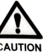

Document ID: 638
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic featuring the text "INSTALLATION" and the number "6." The text is displayed in a bold, sans-serif font, with "INSTALLATION" situated on the left side of the image and "6" positioned in a square box to its right. The background of the image is a clean white, providing a clear contrast to the black text.

**Key Features:**

* **Text:** "INSTALLATION" and "6"
* **Font:** Bold, sans-serif
* **Background:** White
* **Box:** Square box containing the number "6"

**Visual Description:**

The image is a straightforward graphic with minimal design elements. The bold font and simple layout make it easy to read and understand. The use of a square box for the number "6" adds a touch of visual interest to the image. Overall, the image appears to be a label or indicator for a specific installation or process.
Image:


Document ID: 639
Source: /content/man1_merged.pdf
Content:
The image displays a simple text-based graphic with the words "INSTALLATION" and a number "6" in a box.

*   The word "INSTALLATION" is written in black text on a white background.
    *   It is positioned to the right of the number "6", which is enclosed in a black-outlined box.
    *   The font used for the text is sans-serif and appears to be a standard font, possibly Arial or Helvetica.
    *   The text is centered horizontally within its container.
*   The number "6" is displayed inside a black-outlined box.
    *   The box is square-shaped and has a thin border around it.
    *   The number "6" is written in large, bold font within the box.
    *   The box is positioned in the top-left corner of the image.
*   The background of the image is solid white.
    *   There are no other design elements or graphics present in the image.

In summary, the image features a straightforward design with the word "INSTALLATION" and the 

Document ID: 640
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, featuring a triangular shape with a black outline and a white interior. The triangle is positioned at an angle, with its point facing upwards to the right. Inside the triangle, a black exclamation mark is centered within the white area.

*   **Triangle:**
    *   Shape: Triangular
    *   Color: Black (outline) and White (interior)
    *   Orientation: Angled, with the point facing upwards to the right
*   **Exclamation Mark:**
    *   Color: Black
    *   Location: Centered within the white interior of the triangle
*   **Text:**
    *   Color: Black
    *   Font: Bold
    *   Text: "WARNING"

The background of the image is white, providing a clean and neutral backdrop for the warning sign. Overall, the image effectively conveys a sense of caution or alertness through its use of a bold, attention-grabbing design.
Image:


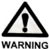

Document ID: 641
Source: /content/man1_merged.pdf
Content:
The image presents a cautionary message, conveyed through a triangle-shaped warning symbol accompanied by the word "CAUTION" in bold, black text. The symbol is positioned above the text, creating a clear visual hierarchy.

* **Triangle Warning Symbol:**
	+ Shape: Triangle with an exclamation mark inside
	+ Color: Black
	+ Position: Above the text "CAUTION"
* **Text:**
	+ Word: CAUTION
	+ Font: Bold
	+ Color: Black
	+ Position: Below the triangle warning symbol

In summary, the image effectively conveys a cautionary message through the use of a distinctive triangle-shaped warning symbol and bold, black text. The visual arrangement creates a clear and attention-grabbing warning, likely intended to alert viewers to potential hazards or risks.
Image:


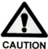

Document ID: 642
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with a gray border and a white interior. The box is centered in the frame, occupying most of the space. Inside the box, a large, black, sans-serif font number "6" is prominently displayed, taking up approximately 75% of the box's width.

Here are the key features of the image:

* **Box:**
	+ Color: Gray
	+ Border style: Thick
	+ Interior color: White
	+ Orientation: Centered in the frame
	+ Size: Occupies most of the frame
* **Number 6:**
	+ Font: Sans-serif
	+ Color: Black
	+ Size: Approximately 75% of the box's width
	+ Position: Centered within the box

In summary, the image features a gray-bordered, white box containing a large black number "6" in a sans-serif font, occupying most of the frame.
Image:


Document ID: 643
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of three distinct views of a machine, each labeled with numbers and accompanied by arrows. The drawing is rendered in black on a white background, providing clear visibility of the machine's components.

* **Top-Left View**
	+ Labeled as "1"
	+ Features a large rectangular box with a smaller box attached to its side
	+ A long, thin pole extends from the top of the larger box
	+ Two smaller boxes are positioned at the bottom of the larger box
* **Top-Right View**
	+ Labeled as "2"
	+ Displays a complex arrangement of gears and other mechanical components
	+ A large wheel is prominently featured in the center of the view
	+ Various other components are scattered throughout the view
* **Bottom View**
	+ Labeled as "3"
	+ Presents a detailed view of the machine's front and back
	+ A large door is visible on the front of the machine
	+ A series of pipes and tubes are depicted on the back of the

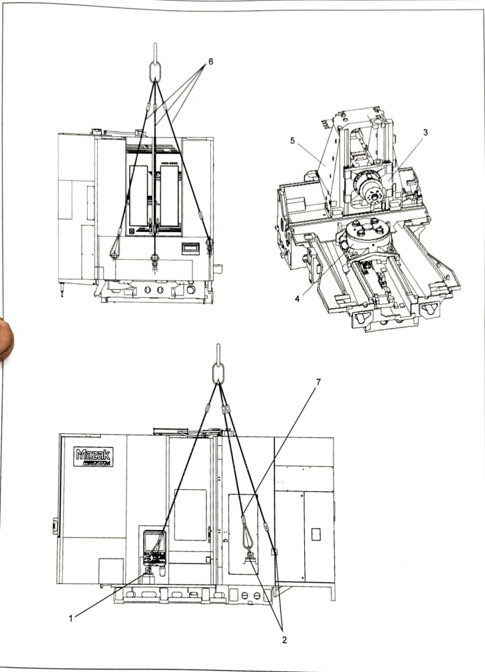

Document ID: 644
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the number 6 and the word "INSTALLATION" inside it.

*   The text box is a small, white square with a thin black border.
    *   It is positioned in the top-left corner of the image.
    *   The number 6 is written in large, black font inside the text box.
*   To the right of the text box, the word "INSTALLATION" is written in smaller, black font.
    *   The word is centered within the image.
    *   It is written in all capital letters.

The image appears to be a label or marker for some kind of installation or setup process. The number 6 may indicate a specific step or phase in the process, while the word "INSTALLATION" provides a clear indication of the purpose of the image. Overall, the image is simple and straightforward, conveying a clear message to the viewer.
Image:


Document ID: 645
Source: /content/man1_merged.pdf
Content:
The image presents a simple, monochromatic design featuring the text "INSTALLATION" accompanied by a square containing the number 6. The purpose of this image is likely to serve as a label or identifier for a specific process or stage within a larger system or project.

Here are the key elements of the image:

* **Number 6 in a square:**
	+ Located in the top-left corner of the image
	+ Enclosed within a thin black square with a white background
	+ The number 6 is displayed in a clear, bold font
* **Text "INSTALLATION":**
	+ Positioned below the square containing the number 6
	+ Written in a standard black font
	+ The text is centered and spans the width of the image

In summary, the image effectively conveys the label "INSTALLATION" with a clear and concise visual representation of the number 6 in a square. This design is likely intended to be easily readable and recognizable in various contexts.
Image:


Document ID: 646
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a machine, accompanied by labels and arrows that identify various parts and their functions. The diagram is divided into two sections, with the top section featuring a larger machine and the bottom section showing a smaller, more detailed view of the same machine.

* **Machine Diagram**
	+ The diagram is a line drawing that illustrates the machine's components and their relationships.
	+ The machine appears to be a complex assembly of parts, including a base, frame, and various mechanisms.
	+ The diagram includes labels and arrows that point to specific parts, providing a clear understanding of their functions and interactions.
* **Machine Parts**
	+ The machine consists of several key components, including:
		- Shipping bracket fixing the column (red)
		- Block for lifting the machine (red)
		- Shipping bracket fixing the spindle
		- Shipping bracket fixing the table (red)
		- Shipping 

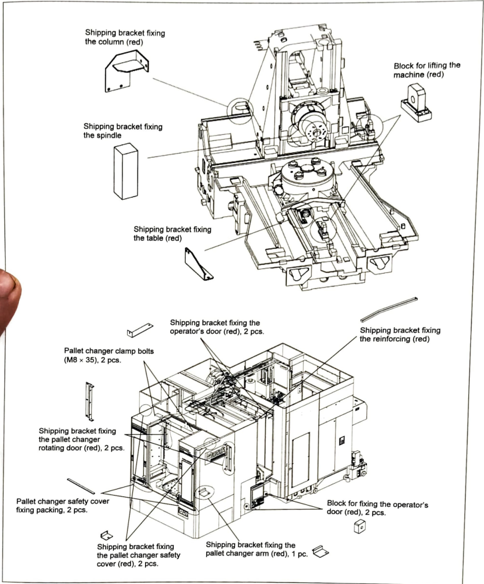

Document ID: 647
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "INSTALLATION" and a number "6" in a box.

* The word "INSTALLATION" is written in all capital letters, using a sans-serif font.
	+ The text is positioned on the left side of the image.
	+ It is centered within its allocated space.
* A box with a thin black border contains the number "6", which is also in black and all capital letters.
	+ The box is positioned to the right of the text "INSTALLATION".
	+ It is centered within its allocated space.

In summary, the image features a clear and concise display of the text "INSTALLATION" followed by the number "6" in a box, all presented in a clean and simple design.
Image:


Document ID: 648
Source: /content/man1_merged.pdf
Content:
The image displays a simple graphic with the text "6 INSTALLATION" in black font on a white background.

*   The number 6 is enclosed in a square outline, positioned to the left of the word "INSTALLATION".
    *   The number is written in a large, bold font.
    *   The square outline is a thin black line that forms a rectangle around the number.
*   The word "INSTALLATION" is written in all capital letters, slightly smaller than the number 6.
    *   It is positioned to the right of the square outline.

Overall, the image appears to be a simple graphic or icon used to represent the concept of installation or setup, possibly in a technical or instructional context.
Image:


Document ID: 649
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of an object, accompanied by numerical values and labels. The purpose of the image is to provide a detailed representation of the object's dimensions and specifications.

* A technical drawing of an object:
	+ The object is depicted in black lines on a white background.
	+ It has a rectangular base with a curved top section.
	+ There are various labels and annotations throughout the drawing, including measurements and dimensions.
* The drawing is labeled with measurements and dimensions:
	+ The measurements are listed in millimeters (mm) and inches (in).
	+ The dimensions include the length, width, and height of the object.
	+ The labels also include information about the object's material, finish, and other relevant details.
* The background is a solid gray color:
	+ The gray background provides a clean and neutral contrast to the black lines of the drawing.
	+ The solid color helps to fo

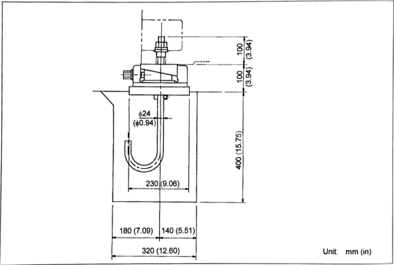

Document ID: 650
Source: /content/man1_merged.pdf
Content:
The image displays a simple, monochrome graphic with the text "INSTALLATION 6" in a rectangular box. 

* The text "INSTALLATION" is written in a large, gray font on the left side of the image.
	+ It is centered and takes up about half of the width of the image.
* To the right of the text is a rectangular box outlined in gray.
	+ Inside the box is the number "6" in a large, gray font.
	+ The box is positioned so that its top-left corner is aligned with the top-left corner of the text.
* The background of the image is plain white.

In summary, the image features a prominent display of the text "INSTALLATION 6" within a rectangular box, set against a clean white background.
Image:


Document ID: 651
Source: /content/man1_merged.pdf
Content:
The image displays a blurry, pixelated number 6 in a box.

* The number 6 is in the center of the image.
	+ It is a large, dark gray font.
	+ It is enclosed in a thin, dark gray border.
	+ The background of the image is white.

The image appears to be a low-resolution or pixelated representation of the number 6, possibly used as a placeholder or icon.
Image:


Document ID: 652
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, characterized by a black triangle with an exclamation mark inside. This symbol is commonly used to indicate caution or danger.

*   **Warning Sign:**
    *   The sign is a black triangle with a white interior.
    *   Inside the triangle, there is a black exclamation mark.
    *   The triangle is positioned with its point facing upwards.
    *   The background of the image is white.

In summary, the image displays a warning sign featuring a black triangle with a white interior and a black exclamation mark inside, set against a white background.
Image:


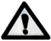

Document ID: 653
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of an electrical device, likely a component or assembly, with a focus on its internal structure and connections. The diagram is rendered in black lines on a white background, providing clear visibility of the various parts and their relationships.

*   **Device Configuration:**
    *   The device is depicted as a three-dimensional box with a rectangular shape.
    *   It features a circular opening on one side, which may represent an input or output port.
    *   The box has several protrusions and recesses, indicating various components or connectors.
*   **Connections and Wires:**
    *   Several wires are connected to the device, some of which are attached to the protrusions mentioned earlier.
    *   These wires likely serve as power or signal connections to other components or systems.
*   **Internal Components:**
    *   The interior of the device is partially visible, showing a few 

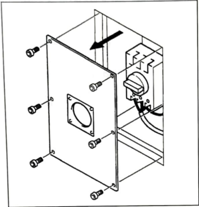

Document ID: 654
Source: /content/man1_merged.pdf
Content:
The image displays a simple text message with the word "INSTALLATION" and a number "6" in a box. The purpose of the image is to convey information about an installation process, likely related to technical or industrial settings.

* The word "INSTALLATION" is written in gray text on the left side of the image.
	+ The font is plain and easy to read.
	+ The text is aligned to the left.
* A box contains the number "6" in the top-right corner.
	+ The box is a thin gray line that forms a square around the number.
	+ The number "6" is centered inside the box.

The image effectively conveys the information that the installation process is at step number 6. There are no significant changes or comparisons to note in this image.
Image:


Document ID: 655
Source: /content/man1_merged.pdf
Content:
The image depicts a technical diagram of an electrical device, specifically a light switch or outlet. The diagram is presented in black and white, with a solid white background and a black outline of the device.

Here are the key features of the diagram:

* **Device:** 
	+ The device is a rectangular box with a circular knob on the front.
	+ It has a flat top and bottom, with a slight curve on the sides.
	+ There are several wires coming out of the back of the device, which are not clearly labeled.
* **Background:** 
	+ The background of the diagram is solid white.
	+ There is a thin black border around the edges of the diagram.
* **Text:** 
	+ In the bottom-right corner of the diagram, there is a series of numbers: "MC111-01337".
	+ These numbers may be a part number or identifier for the device.
* **Overall:** 
	+ The diagram appears to be a technical illustration for a user manual or instruction guide.
	+ It provides a clear

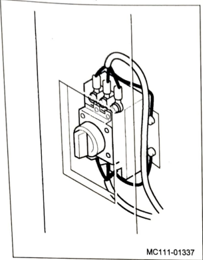

Document ID: 656
Source: /content/man1_merged.pdf
Content:
The image displays a simple text and number graphic. 

*   The image features a square box with a thin black outline, positioned in the top-left corner.
    *   Inside the box, the number "6" is prominently displayed in large black text.
*   To the right of the box, the word "INSTALLATION" is written in smaller black text.

The background of the image is a plain white color.
Image:


Document ID: 657
Source: /content/man1_merged.pdf
Content:
The image presents a diagram illustrating the concept of grounding resistance at each point, with a clear and concise visual representation. The diagram is divided into three sections, each depicting a different scenario.

*   **Section 1:**
    *   A rectangle with three lines extending from it horizontally.
    *   The lines are evenly spaced and have equal lengths.
    *   The rectangle is centered in the section.
*   **Section 2:**
    *   A rectangle with three lines extending from it horizontally.
    *   The lines are evenly spaced and have equal lengths.
    *   The rectangle is centered in the section.
*   **Section 3:**
    *   A rectangle with three lines extending from it horizontally.
    *   The lines are evenly spaced and have equal lengths.
    *   The rectangle is centered in the section.

The diagram effectively conveys the concept of grounding resistance at each point, with a clear and consistent visual repre

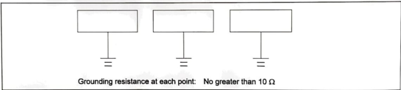

Document ID: 658
Source: /content/man1_merged.pdf
Content:
The image presents a diagram illustrating the grounding conductor's connection to the grounding terminal, accompanied by a mathematical formula. The diagram is titled "Grounding resistance" and features a simple line drawing of three machines connected to a common grounding terminal via a grounding conductor.

**Key Components:**

* **Title:** Grounding resistance
* **Diagram:**
	+ Three machines
	+ Grounding terminal
	+ Grounding conductor connecting the machines to the terminal
* **Formula:**
	+ Grounding resistance = 10 / Number of machines
	+ Grounding resistance is measured in ohms (Ω)

**Summary:**

The image effectively conveys the importance of proper grounding in a machine setup, highlighting the need for a common grounding terminal and the calculation of grounding resistance. The diagram and formula provide a clear understanding of the concept, making it easy for viewers to visualize and calculate the required groundi

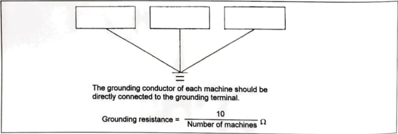

Document ID: 659
Source: /content/man1_merged.pdf
Content:
The image presents a warning sign, characterized by a triangle with an exclamation mark inside and the word "WARNING" written below it. The purpose of this image is to convey a sense of caution or alertness to the viewer.

Here are the key features of the image:

* **Triangle:**
	+ Shape: Equilateral triangle
	+ Color: Black outline with a white interior
	+ Size: Approximately 1/3 of the width of the image
* **Exclamation Mark:**
	+ Shape: Black exclamation mark
	+ Location: Inside the triangle
	+ Size: Small, roughly 1/4 of the height of the triangle
* **Word "WARNING":**
	+ Text: Black capital letters
	+ Location: Below the triangle
	+ Size: Slightly larger than the triangle, covering about 1/2 of the image's width

In summary, the image effectively conveys a warning message through its simple yet striking design, using a prominent triangle and bold text to grab the viewer's attention.
Image:


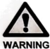

Document ID: 660
Source: /content/man1_merged.pdf
Content:
The image is a blurry, pixelated representation of the number 6, with a white background and a gray border around it. The number 6 is also depicted in gray.

* The image is blurry and pixelated, suggesting that it may have been enlarged or distorted for display purposes.
	+ The white background is visible through the gray border, creating a subtle contrast between the two colors.
	+ The gray border is thicker on the left and right sides than on the top and bottom, giving the image a sense of depth and dimensionality.
* The number 6 is depicted in gray, which is the dominant color in the image.
	+ The gray tone is consistent throughout the image, with no visible shading or texture.
	+ The number 6 is centered within the image, with equal spacing between the top, bottom, left, and right edges of the number and the surrounding border.
* The overall effect of the image is one of simplicity and clarity, despite its blurry and pixela

Document ID: 661
Source: /content/man1_merged.pdf
Content:
The image presents a simple line drawing of a circuit, comprising a circle with a diagonal line through it, surrounded by various lines and rectangles. The purpose of this image is to illustrate the concept of a circuit or electrical diagram.

* A circle with a diagonal line through it:
	+ The circle is centered in the image.
	+ A diagonal line runs from the top-left to the bottom-right of the circle.
	+ The circle and diagonal line are solid black.
* A rectangle with a line extending from it:
	+ The rectangle is positioned on the left side of the circle.
	+ A line extends from the right side of the rectangle, connecting to the circle.
	+ The rectangle and line are also solid black.
* Two rectangles on either side of the circle:
	+ The rectangles are symmetrical, one on each side of the circle.
	+ They are identical in size and shape to the first rectangle.
	+ The rectangles are also solid black.

The image effectively conveys 

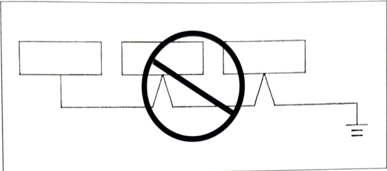

Document ID: 662
Source: /content/man1_merged.pdf
Content:
The image features a black and white warning sign, comprising:

*   **Triangle**: A black triangle with a white interior, positioned at the top of the image. The triangle is outlined in black, with a smaller black triangle inside it, pointing downwards. The inner triangle contains a black exclamation mark.
*   **Text**: Below the triangle, the word "WARNING" is written in black text, centered within the image.

The background of the image is plain white, providing a clean and simple contrast to the bold black and white design of the warning sign.

In summary, the image presents a clear and concise warning sign, effectively conveying a sense of caution or alertness through its distinctive design and prominent placement.
Image:


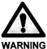

Document ID: 663
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of an industrial air-handling system, showcasing its various components and their connections. The diagram is divided into two main sections: the top section features a large, complex diagram with multiple lines and symbols, while the bottom section provides a closer look at specific parts of the system.

*   **Top Section:**
    *   The top section of the diagram displays a large, complex system with multiple lines and symbols.
    *   A black arrow points to the center of the diagram, indicating the connection point for the external air source.
    *   The diagram includes several labels and annotations, providing context and clarity for the viewer.
*   **Bottom Section:**
    *   The bottom section of the diagram focuses on specific parts of the system, including the filter, mist separator, and reducing valve.
    *   Each component is labeled and connected to other parts of the system, 

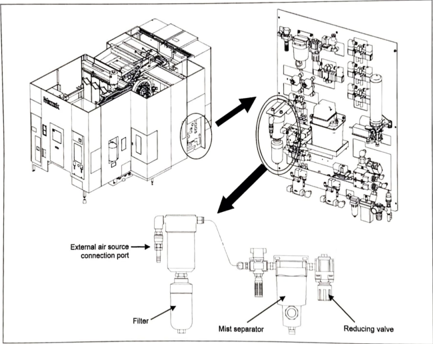

Document ID: 664
Source: /content/man1_merged.pdf
Content:
The image displays a simple text box with the words "INSTALLATION" and the number "6". 

* The number 6 is in a square box.
	+ The box is outlined in black.
	+ The number 6 is centered in the box.
* The word "INSTALLATION" is to the right of the number 6.
	+ It is written in black text.
	+ It is also centered below the number 6.

The background of the image is white.
Image:


Document ID: 665
Source: /content/man1_merged.pdf
Content:
The image presents a technical diagram of a transformer and phase tester, with the title "Transformer" and "Phase tester" displayed prominently at the top. The diagram is set against a white background, providing a clean and clear visual representation of the components.

*   **Transformer**
    *   The transformer is depicted as a rectangular shape with a wavy line on the top-left side, indicating its electrical connections.
    *   A smaller rectangle is positioned within the larger one, representing the transformer's internal components.
    *   The transformer is connected to the phase tester via two lines, labeled "DT" and "DS".
*   **Phase Tester**
    *   The phase tester is illustrated as a square-shaped device with a circular dial on the right side.
    *   The dial features three labels: "DT", "DS", and "DR", which likely correspond to different phases or settings.
    *   The phase tester is connected to the transfor

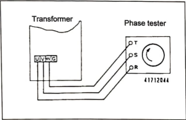

Document ID: 666
Source: /content/man1_merged.pdf
Content:
The image presents a simple, black-and-white graphic with the text "INSTALLATION" and a number "6" enclosed in a square box. The purpose of this image is unclear, but it may be used as a placeholder or indicator for installation-related content.

* **Text**
	+ The word "INSTALLATION" is written in a black, sans-serif font.
	+ It is positioned on the left side of the image, aligned to the left margin.
* **Number 6**
	+ The number "6" is displayed in a large, black, sans-serif font.
	+ It is enclosed in a small, white square box with a thin black border.
	+ The box is positioned on the right side of the image, aligned to the right margin.
* **Background**
	+ The background of the image is a solid white color.
	+ There are no other design elements or patterns present in the background.

The main finding from this image is that it appears to be a simple graphic used for labeling or indicating installation-related content. There are

Document ID: 667
Source: /content/man1_merged.pdf
Content:
The image presents a multiple-choice question, accompanied by a diagram and instructions. The question is:

**Question:** Identify the correct position of the letters.

**Diagram:**

*   A rectangle with the letter "d" inside
*   A rectangle with the letter "E" inside
*   A rectangle with the letters "1", "2", "3", "4", "5", and "6" inside

**Instructions:**

*   If any of the following letters is displayed in this position, it indicates that alarm has occurred.
*   1, 2, 3, 4, 5, 6, and E

**Answer Options:**

*   Correct
*   Alarm

The image provides a clear and concise visual representation of the question, making it easy for the viewer to understand and respond.
Image:


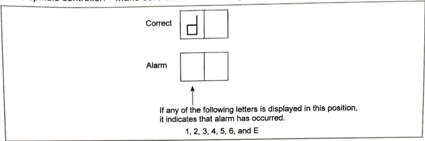

Document ID: 668
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet clear, visual representation of the word "APPENDIX" alongside a number "7" enclosed in a square box. This concise design effectively conveys the content, making it easily readable and understand.

* The word "APPENDIX" is displayed prominently on the left side of the image.
	+ It is written in a standard font, ensuring readability.
	+ The text is positioned in a way that it is immediately noticeable.
* To the right of the word "APPENDIX", there is a square box containing the number "7".
	+ The number is centered within the box, creating a sense of balance.
	+ The use of a square box for the number adds a touch of simplicity to the design.
* The background of the image is a clean white, providing a neutral backdrop that allows the text and number to stand out.
	+ The white background helps to maintain the focus on the content.
	+ It avoids any distractions, ensuring the viewer's attention remains

Document ID: 669
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box containing the number 7, accompanied by the word "APPENDIX" to its right. The purpose of this image is likely to serve as a visual indicator or label for an appendix section within a document or presentation.

Here are the key features of the image:

* **Number 7:**
	+ Located in a rectangular box
	+ Box is outlined in a thin black line
	+ Number 7 is centered within the box
* **Word "APPENDIX":**
	+ Positioned to the right of the number 7
	+ Word is written in a simple, sans-serif font
	+ Text color is black
* **Background:**
	+ White background

In summary, the image effectively conveys the presence of an appendix section with a clear and concise visual cue. The use of a rectangular box and simple font makes the image easy to read and understand.
Image:


Document ID: 670
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a machine, showcasing its various components and their connections. The diagram is divided into two sections: the top section features a 3D representation of the machine, while the bottom section provides a labeled list of parts.

**Top Section:**

* A 3D representation of the machine is displayed.
* The machine consists of several components, including:
	+ ATC Unlock (SQ-39)
	+ ATC Lock (SQ-38)
	+ Way Lube Grease Pressure (SP-11)
	+ Mag. Door Interlock (SQ-31)
	+ Spindle Through Air Blow (YV-4)
	+ Pallet Pin Ret. (YV-58)
	+ Measuring Arm Ret. (YV-41)
	+ Measuring Arm Ext. (YV-40)
	+ Pallet Air Blow (YV-57)
	+ Pallet Door Close (FMS)
	+ Pallet Door Open (FMS)
	+ Pallet Clamp Confirmation Sensor (SP-129)(OP)
	+ Pallet Seating Detection Sensor (SP-126)(OP)
	+ Spindle Through Coolant (YV-3)
	+ Pallet Clamp Confirmation (YV-123)(OP)
	+ ATC Cover Close End (SQ-23)
	+ ATC Cover Open End (SQ-22

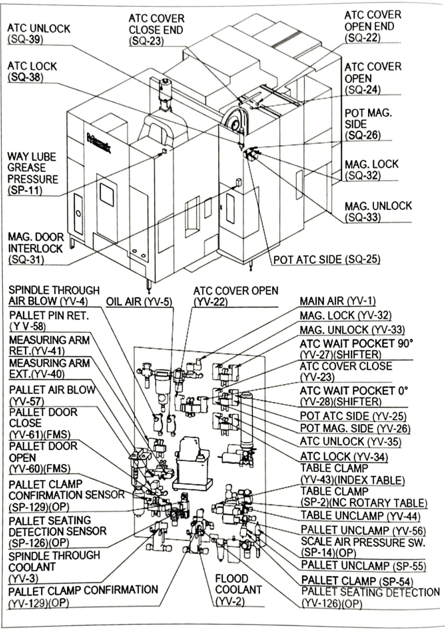

Document ID: 671
Source: /content/man1_merged.pdf
Content:
The image presents a simple, yet informative visual element, likely used in a document or presentation to provide context or reference information. The image features a bold, black font with the text "APPENDIX" on the left side of the image, accompanied by a square box containing the number "7" on the right side.

Here is a detailed breakdown of the image's components:

* **Text**
	+ Font: Bold, black font
	+ Text: "APPENDIX"
	+ Location: Left side of the image
* **Number**
	+ Font: Same as the text font
	+ Number: "7"
	+ Location: Inside a square box on the right side of the image

In summary, the image displays a clear and concise visual representation of an appendix number, with the text "APPENDIX" on the left and the number "7" in a square box on the right. This design suggests that the image is intended to be a quick reference point for readers or viewers, providing easy access to important information.
Image:


Document ID: 672
Source: /content/man1_merged.pdf
Content:
The image presents a detailed diagram of a machine with various components labeled. The diagram is divided into sections, each containing a list of parts and their corresponding labels.

*   **Pallet Door Interlock (SQ-56)(STD,FMS,pre.)**
    *   Pallet Door Open (SQ-50)(FMS)
    *   Pallet Door Close (SQ-52)(FMS)
    *   Pallet Door Close (SQ-63)(FMS)
    *   P/C Arm Down (SQ-52)
    *   Pallet Zero Pos.(SQ-57)
    *   Mag. Shifter ATC Side Pos. (SQ-37)
    *   ATC Wait Pocket 0* (SQ-28)
    *   Mag. Door Interlock (SQ-31)
    *   ATC Wait Pocket 90* (SQ-27)
*   **Work Light (EL-1)**
    *   Pallet Door Open (SQ-61)(FMS)
    *   Machine Door Interlock (SQ-9)
*   **Measuring Arm Ret. (SQ-41)**
    *   Table Clamp (SQ-44)(Index Table)
    *   Oil Air Pressure SW. (SP-5)
    *   Tool Clamp (SQ-11)
    *   Work Air Blast (YV-11)(OP)
    *   Tool Unclamp (YV-10)
    *   Tool Unclamp (SQ-10)
    *   Clamp No Tool (SQ-112)(OP)

The d

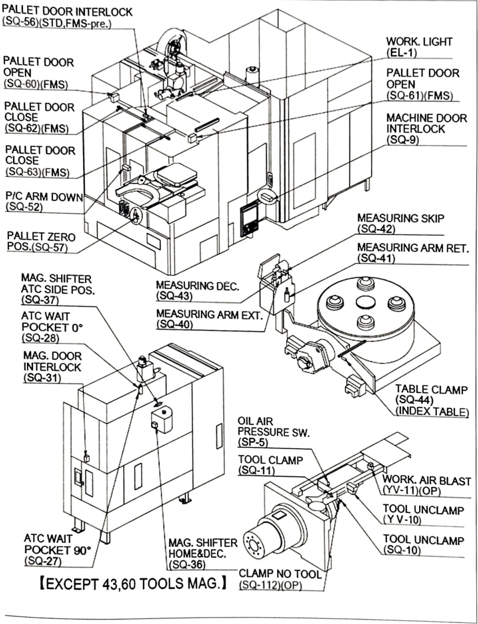

Document ID: 673
Source: /content/man1_merged.pdf
Content:
The image presents a simple, rectangular box with the number 7 inside it, accompanied by the word "APPENDIX" to its right. The box is outlined in black and contains the large, black numeral 7 in the center. To the right of the box, the word "APPENDIX" is written in the same black font, but in a smaller size.

*   **Box**
    *   The box is rectangular in shape.
    *   It has a black outline.
    *   The number 7 is inside the box.
    *   The box is positioned on the left side of the image.
*   **Text**
    *   The word "APPENDIX" is written to the right of the box.
    *   It is in the same black font as the number 7.
    *   The text is smaller than the number 7.
*   **Background**
    *   The background of the image is white.

In summary, the image features a simple design with a rectangular box containing the number 7 and the word "APPENDIX" written to its right. The box and text are outlined in black, while the background

Document ID: 674
Source: /content/man1_merged.pdf
Content:
The image presents a simple, monochromatic design featuring the text "APPENDIX" and a numerical value enclosed in a square. The purpose of this image is likely to serve as a header or label for an appendix section in a document.

* The word "APPENDIX" is displayed in a plain, black font:
	+ It is positioned on the left side of the image.
	+ The text is written in lowercase letters.
* A number 7 is enclosed in a square:
	+ The square is outlined in black.
	+ The number 7 is centered within the square.
	+ The square is located on the right side of the image.
* The background is white:
	+ The color provides a clean and neutral contrast to the black text and outline.

In summary, the image effectively conveys the information that it is an appendix section of a document, with the number 7 possibly indicating the order of the appendix or a specific reference within it. The use of a simple, monochromatic design ensures clarity and rea

Document ID: 675
Source: /content/man1_merged.pdf
Content:
The image presents a technical drawing of a machine component, with labels and arrows indicating its various parts. The drawing is rendered in black and white, with a focus on clarity and precision.

*   **Y-axis way cover**
    *   Located at the top-left corner of the drawing
    *   Labeled with an arrow pointing to it
*   **Z-axis way cover (spindle side)**
    *   Situated at the bottom-right corner of the drawing
    *   Labeled with an arrow pointing to it
*   **Z-axis way cover (pallet changer side)**
    *   Positioned at the bottom-left corner of the drawing
    *   Labeled with an arrow pointing to it
*   **X-axis way cover**
    *   Placed at the top-right corner of the drawing
    *   Labeled with an arrow pointing to it

The drawing provides a detailed view of the machine component's structure, highlighting its key components and their relationships. The use of labels and arrows ensures that the viewer can easily 

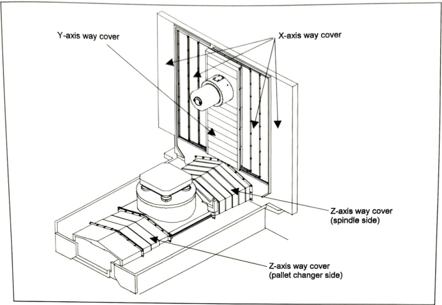

In [13]:
import itertools
from docling_core.types.doc.document import RefItem
from IPython.display import display

# Assuming 'texts', 'tables', 'pictures', and 'conversions' are predefined lists or dictionaries

# Print all created documents from texts and tables
for document in itertools.chain(texts, tables):
    print(f"Document ID: {document.metadata['doc_id']}")
    print(f"Source: {document.metadata['source']}")
    print(f"Content:\n{document.page_content}")
    print("=" * 88)  # Separator for clarity

# Print all created documents from pictures
for document in pictures:
    print(f"Document ID: {document.metadata['doc_id']}")
    source = document.metadata['source']
    print(f"Source: {source}")
    print(f"Content:\n{document.page_content}")

    # Resolve reference and get image
    docling_document = conversions.get(source)  # Use .get to avoid KeyError
    if docling_document:
        ref = document.metadata['ref']
        picture = RefItem(cref=ref).resolve(docling_document)
        image = picture.get_image(docling_document)

        print("Image:")
        display(image)
        print("=" * 80)  # Separator for clarity


In [30]:
import tempfile
from langchain_core.vectorstores import VectorStore
from langchain_milvus import Milvus

# Create a temporary file for the database
db_file = tempfile.NamedTemporaryFile(prefix="vectorstore", suffix=".db", delete=False).name  #it's stored locally in Google Colab's runtime, not remotely.

print(f"The vector database will be saved to {db_file}") #This suggests to Milvus:"Hey, connect to a Milvus server at this file path."

# Initialize the vector store
vector_db: VectorStore = Milvus(
    embedding_function=embeddings_model,  # Ensure 'embeddings_model' is defined...used to embed incoming text/images (e.g., from OpenAI, Hugging Face, etc.).
    connection_args={"uri": db_file},     #instructs the vector store where to connect (typically to a running Milvus server, not a .db file).
    auto_id=True,                         #auto-generates vector IDs.
    enable_dynamic_field=True,
    index_params={"index_type": "AUTOINDEX"}  #lets Milvus automatically choose the best index type.

)



The vector database will be saved to /tmp/vectorstore1smh5_xe.db


In [ ]:
!pip install pinecone

In [ ]:


from pinecone import Pinecone, ServerlessSpec







# Set your API key
api_key = "......."

# Initialize Pinecone instance
pc = Pinecone(api_key=api_key)

# 3. Create an index (if it doesn’t already exist)
index_name = "rag-granite-index"
dimension = 384  # Match your embedding size (Granite = 1024)

if index_name not in pc.list_indexes().names():
    pc.create_index(
        name=index_name,
        dimension=dimension,
        metric='cosine',
        spec=ServerlessSpec(
            cloud='aws',
            region='us-east-1'  # Or your preferred Pinecone region
        )
    )

# Connect to the index
index = pc.Index(index_name)


In [32]:
documents = list(itertools.chain(texts, tables, pictures))


In [33]:
texts_to_embed = [doc.page_content for doc in documents]

embeddings = embeddings_model.embed_documents(texts_to_embed)




In [34]:
vectors = []
for i, (doc, embed) in enumerate(zip(documents, embeddings)):
    vectors.append({
        "id": f"vec{i}",
        "values": embed,
        "metadata": {
            "text": doc.page_content,
            "source": doc.metadata.get("source", "unknown"),
            "page": doc.metadata.get("page", -1)
        }
    })

index.upsert(vectors=vectors, namespace="rag-ns")


{'upserted_count': 675}

In [35]:
query = "what are safety instruction?"
query_embedding = embeddings_model.embed_query(query)

results = index.query(
    namespace="rag-ns",
    vector=query_embedding,
    top_k=3,
    include_metadata=True
)

for match in results['matches']:
    print(match['metadata']['text'])
    print("="*80)


1. This section contains the precautions to be obseived as to the working methods and states usually expected. Of course, however, unexpected operations and/or unexpected working states may take place at the user site.
2. During daily operation of the machine, therefore, the user must pay extra careful attention to its own working safety as well as to obseive the precautions described below.
2. The meanings of our safety precautions to  DANGER, WARNING,  and CAUTION  are as follows:
4. Failure to follow these instructions could result in loss of life.
5. Failure to obseive these instructions could result in serious harm to a human life or body.
6. FailLNe to  obseive these instructions could result in  minor injuries or serious machine damage.
Prepared at: August  24  2 Yamazaki Mazak Co~ra~~
- Operate the machine only after reading the instruction manual carefully and understanding the contents thoroughly.
This material is a reference for the instruction manual and do not operate the 

Here's the confusion: Milvus is not like SQLite or FAISS where data is saved in a local .db file.

Milvus is a vector database server — it expects a running service (usually accessed via localhost:19530 or a cloud endpoint).

So when you give it a file path like vectorstoreXYZ.db, it won’t work unless you've set up a fake or mocked interface (which isn’t the standard).





| Storage Type         | Works in Colab?     | Local/Remote?            | Requires Server? |
| -------------------- | ------------------- | ------------------------ | ---------------- |
| `Milvus` (Your code) | ❌ Needs extra setup | Remote or server-hosted  | ✅ Yes            |
| `FAISS`              | ✅ Yes               | Local (in memory / file) | ❌ No             |
| `Chroma`             | ✅ Yes               | Local (with folder)      | ❌ No             |


In [36]:
retrieved_context = "\n\n".join(match['metadata']['text'] for match in results['matches'])


In [ ]:
from langchain.prompts import PromptTemplate
from langchain.chains.llm import LLMChain
from langchain_groq import ChatGroq

# Set up Groq LLM
from langchain_groq import ChatGroq
from transformers import AutoTokenizer
'''
# Set up Groq API Key
GROQ_API_KEY = "......"

# Initialize LLaMA 3.3 70B Versatile on Groq
llm= ChatGroq(
    model_name="llama3-70b-8192",  # LLaMA 3.3 70B Versatile
    api_key=GROQ_API_KEY
)
'''
# Create prompt template
prompt = PromptTemplate(
    input_variables=["context", "question"],
    template="""
You are a smart assistant. Based on the provided context, answer the question in 1 to 2 lines only and if it has more information then answer in more briefly

Context:
{context}

Question: {question}

Answer:
"""
)

# Create LLM chain
llm_chain = LLMChain(llm=model, prompt=prompt)

# Call LLM with retrieved context
query = "What are safety instructions?give their examples"
response = llm_chain.invoke({
    "context": retrieved_context,
    "question": query
})

# Print final answer
print("Answer:", response["text"])


Answer: Safety instructions are precautions to be observed during machine operation to prevent harm or damage. Examples include: DANGER (loss of life), WARNING (serious harm to human life or body), and CAUTION (minor injuries or serious machine damage).


** 1. create_stuff_documents_chain (Stuffing)**
What it does: Concatenates all documents into a single prompt.

Use case: When documents are small enough to fit within the model's context window.

Pros: Fast, simple.

Cons: Doesn’t scale well for large numbers of documents.

**2. create_map_reduce_documents_chain (Map-Reduce)**
What it does:

Map: Apply LLM to each document separately to generate partial answers.

Reduce: Combine partial results into a final answer.

Use case: When many or large documents exceed the model’s token limit.

Pros: More scalable, parallel processing.

Cons: Slower, may lose coherence across documents.

**3. create_refine_documents_chain (Refine)**
What it does:

Processes the first document.

Then iteratively “refines” the answer using each additional document.

Use case: When documents are long and there's a clear benefit to incremental improvement.

Pros: Useful when each doc adds new context.

Cons: Sensitive to order; may be slower.